In [1]:
import pandas as pd
import numpy as np
import gudhi as gd
import matplotlib.pyplot as plt
from matplotlib.animation import ArtistAnimation
import diagram2vec
from collections import defaultdict
from mpl_toolkits.axes_grid1 import make_axes_locatable
import imageio
import time
from sklearn.neighbors.kde import KernelDensity
from ripser import Rips
from gudhi.representations.kernel_methods import PersistenceFisherDistance, \
                                                SlicedWassersteinDistance
vr = Rips()
import seaborn as sns
import tensorflow as tf

from sklearn.model_selection import KFold, train_test_split, cross_val_score, GridSearchCV
from tqdm import tqdm


Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


In [2]:
I = np.array(pd.read_csv('datasets/mnist_train.csv', header = None))

In [3]:
idx = np.argwhere(I[:,0] == 4)
image = np.reshape(I[idx[21],1:], [28,28])

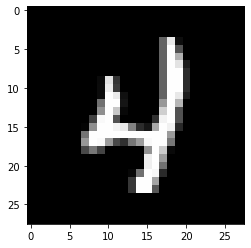

In [4]:
plt.imshow(image, cmap = 'gray')

In [8]:
image = image/255

In [6]:
class DirectedFilter:
    def __init__(self, angle, threshold = 0.4, normalized = True, inverse = False):
        
        self.threshold = threshold
        self.direction = (-np.sin(angle), np.cos(angle))
        self.normalized = normalized
        self.inverse = inverse
    def transform(self, image):
        
        #binarization of image 
        if(not self.inverse):
            bin_image = np.array(image > self.threshold, dtype = np.int8).reshape(image.shape)
        else:
            bin_image = np.array(image <= self.threshold, dtype = np.int8).reshape(image.shape)
        #filter by direction
        #pos = zip(np.where(bin_image))
        
        l1, l2 = map(list, np.where(bin_image))
        pos = list(zip(l1,l2))
        val_filt = np.array([np.array(p)@np.array(self.direction) for p in pos])
        filtred_img = bin_image.copy()
        filtred_img[l1,l2] = val_filt
        
        l1, l2 = map(list, np.where(bin_image == 0))
        filtred_img[l1,l2] = filtred_img.max().max() + 5
        if(self.normalized):
            min_val = filtred_img.min().min()
            filtred_img = (filtred_img - min_val)
            max_val = filtred_img.max().max()
            filtred_img = filtred_img/max_val
        return filtred_img
    

In [7]:
def get_diagram(x, concat = False):
    if(not concat):
        d = defaultdict(list)
        for ind, inter in x:
            d[ind].append(inter)
        return [np.array(d[c]) for c in d]
    
    res = []
    for _, inter in x:
        if(inter[1] == float('inf')):
            res.append([inter[0], 1000])
        else:
            res.append(inter)
    return np.array(res)

In [42]:
def make_animation(image, file_name, threshold = 0.4, max_lim = 3, inverse = False):
    for ind, i in enumerate(np.arange(0, 361, 5)):
        fig = plt.figure(figsize = (16, 12));
        ax1 = plt.subplot(2, 2, 1, projection = 'polar');
        ax1.set_yticks([])
        ax1.set_title('Direction of filter', fontsize = 18)
        ax2 = plt.subplot(2, 2, 2);
        ax2.set_title('Image filter', fontsize = 18)
        ax3 = plt.subplot(2, 2, 3);
        ax3.set_title('Betti curve', fontsize = 18)
        ax3.set_xlim((0,1))
        ax3.set_ylim((-1,max_lim))
        ax4 = plt.subplot(2, 2, 4);
        ax1.arrow(0,0,(i/360)*2*np.pi,1)
        fig.suptitle('Directed filter')
        filt = DirectedFilter(angle = (i/360)*2*np.pi, threshold = threshold, inverse = inverse)
        new_img = filt.transform(image)
        cc_density_crater = gd.CubicalComplex(dimensions = new_img.shape, 
                                          top_dimensional_cells = new_img.reshape(-1))

        pers_density_crater = cc_density_crater.persistence()
        diag = get_diagram(pers_density_crater)
        diagram = vr.plot(diag, xy_range = [-0.1, 1.1, -0.1, 1.1], title = 'Persistent diagram', size = 50)
        
        ax4.set_xlim(-.1,1.15)
        ax4.set_ylim(-.1,1.15)
        image_show = ax2.imshow(new_img, cmap = 'rainbow')
        ax2.set_xticks([])
        ax2.set_yticks([])
        divider = make_axes_locatable(ax2)
        cax = divider.append_axes('right', size='5%', pad=0.05)
        plt.colorbar(image_show, cax=cax, orientation='vertical')
        
        X_betti_curve = diagram2vec.persistence_curve(diag, m=64)
        betti_curve = ax3.step(np.linspace(0,1,64), X_betti_curve[0][0], color="r", where="post", linewidth=2, label="Pers-1", animated=True)
        try:
            betti_curve = ax3.step(np.linspace(0,1,64), X_betti_curve[0][1], color="b", where="post", linewidth=2, label="Pers-2", animated=True)
        except:
            print('not have 2 dim')
            #betti_curve = ax3.step(np.linspace(0,1,64), np.zeros(64), color="b", where="post", linewidth=2, label="Pers-2", animated=True)
        ax3.legend()
        #print(frames[-1])
        plt.savefig('animate/tmp'+str(ind)+'.png')
        plt.close()
    
    png_dir = 'animate'
    images = []
    
    for i in range(72):
        images.append(imageio.imread('animate/tmp'+str(i)+'.png'))
    imageio.mimsave(file_name, images, fps = 8)
    
    del images

In [14]:
for num in range(10):
    idx = np.argwhere(I[:,0] == num)
    image = np.reshape(I[idx[21],1:], [28,28])
    image = image/255
    make_animation(image, 'animation_for_'+str(num)+'.gif')
    

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim
not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

In [15]:
def get_sim_table(image, angel_step, f_dist, threshold):
    angles = np.arange(0, 361, angel_step)
    sim_mat = np.zeros([angles.shape[0]]*2)
    diagrams = []
    for ang in angles:
        filt = DirectedFilter((ang/360)*2*np.pi, threshold)
        new_img = filt.transform(image)
        cc_density_crater = gd.CubicalComplex(dimensions = new_img.shape, 
                                          top_dimensional_cells = new_img.reshape(-1))
        pers_density_crater = cc_density_crater.persistence()
        
        diag = get_diagram(pers_density_crater, True)
        #print(diag.shape)
        diagrams.append(diag)
    
    res = f_dist.fit_transform(diagrams)
            
    return res

In [4]:
def plot_dist_mat(images, angle_step, name, threshold = 0.4):
    F_slised = SlicedWassersteinDistance()
    F_fisher = PersistenceFisherDistance(0.5)
    angles = np.arange(0, 361, angle_step)
    res_table_slised = np.zeros([angles.shape[0]]*2)
    res_table_fisher = np.zeros([angles.shape[0]]*2)
    for ind, img in enumerate(images):
        #print(img.shape)
        res_table_slised += get_sim_table(img, angle_step, F_slised, threshold)
        res_table_fisher += get_sim_table(img, angle_step, F_fisher, threshold)
    
    fig, ax = plt.subplots(1, 2, figsize = (16, 6))
    fig.suptitle('Distanse between direction for ' + str(name))
    
    res_table_fisher /= len(images)
    res_table_slised /= len(images)
    
    data_fisher = pd.DataFrame(res_table_fisher, columns = angles, index = angles)
    data_slised = pd.DataFrame(res_table_slised, columns = angles, index = angles)
    
    sns.heatmap(data_fisher, ax = ax[0])
    sns.heatmap(data_slised, ax = ax[1])
    
    ax[1].set_title('Sliced Wasserstein Distance')
    ax[1].set_xlabel('Angles')
    ax[1].set_ylabel('Angles')
    
    ax[0].set_title('Persistence Fisher Distance')
    ax[0].set_xlabel('Angles')
    ax[0].set_ylabel('Angles')
    
    plt.savefig('dist_plot_'+str(name)+'.png')

0
1
2
3
4
5
6
7
8
9


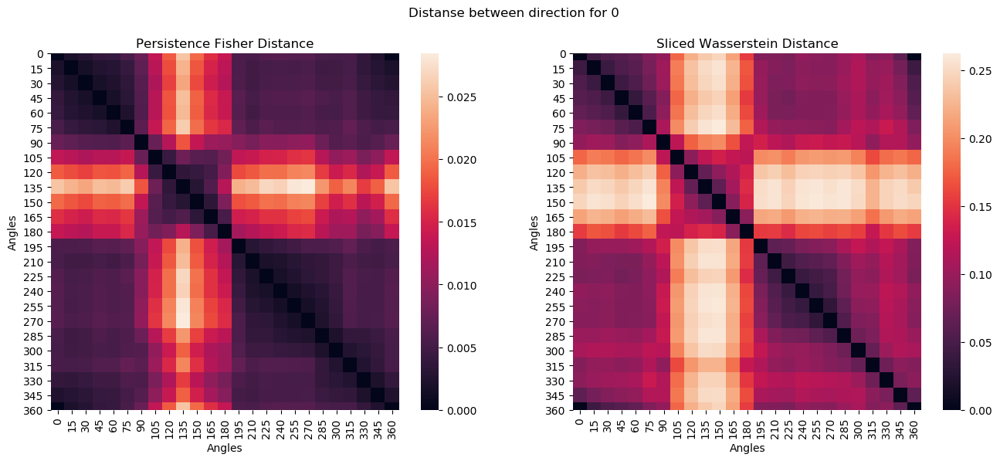

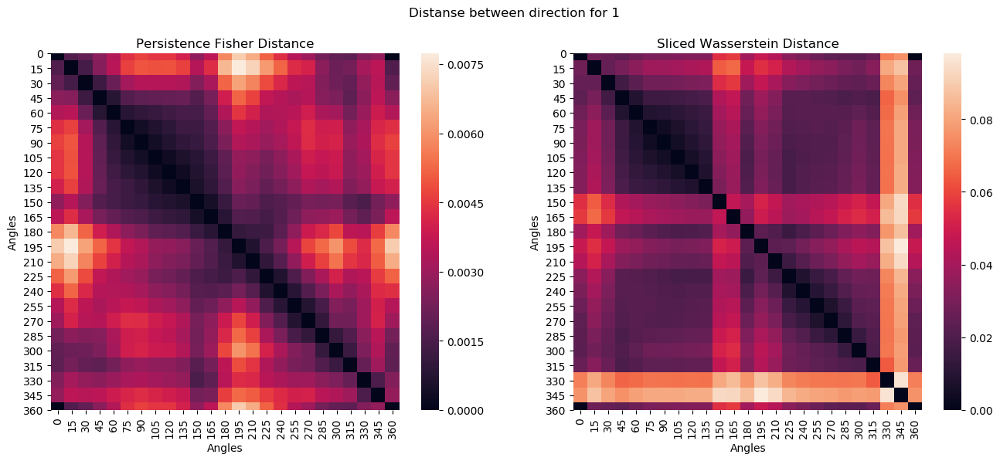

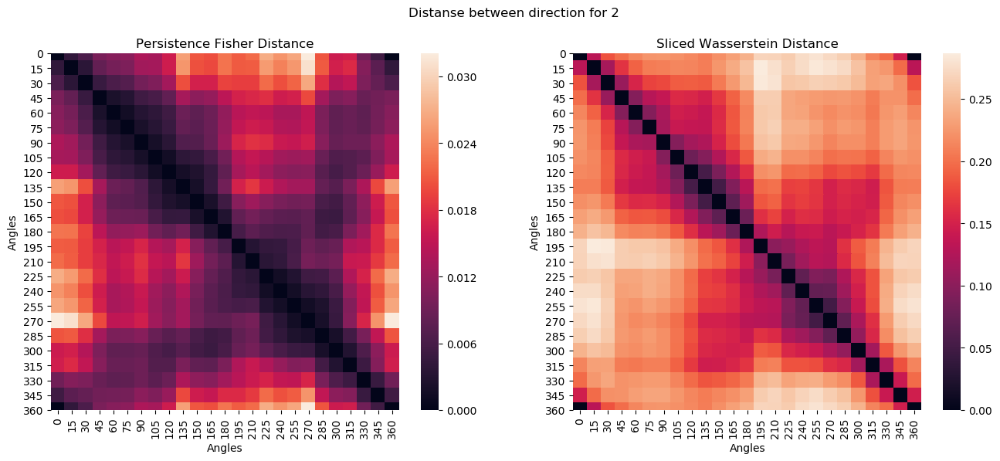

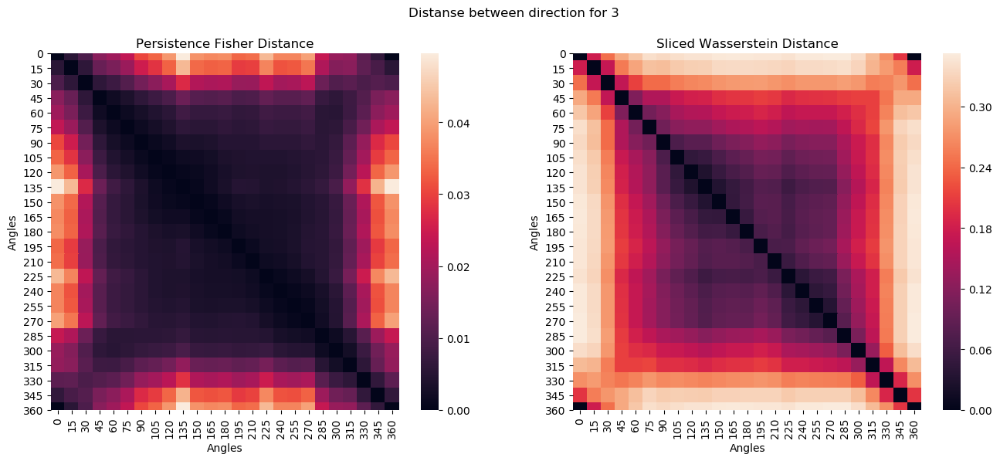

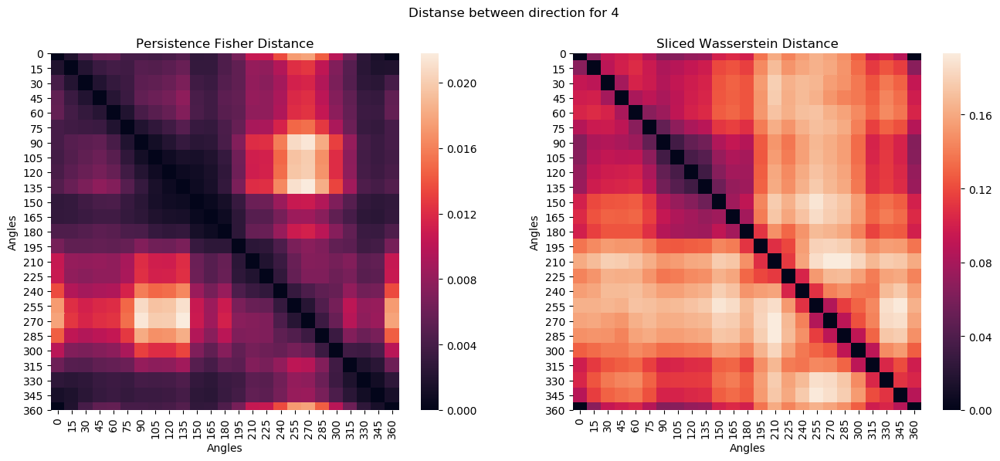

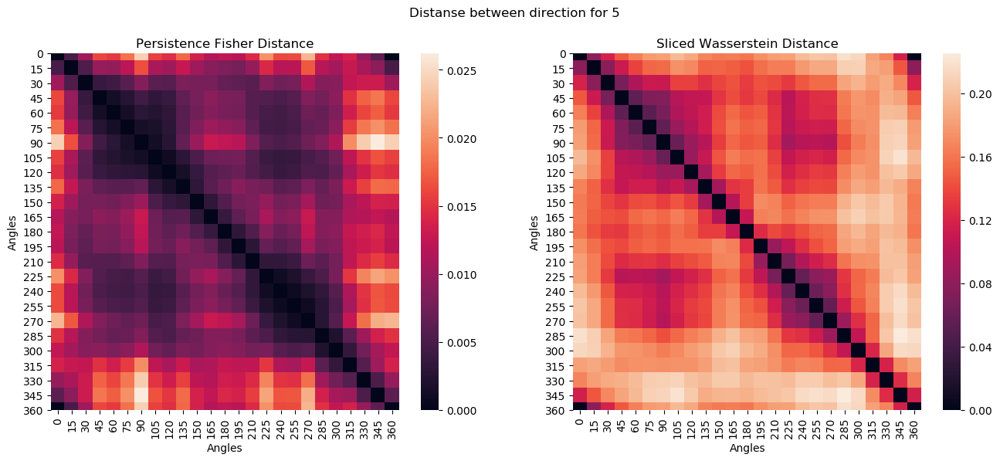

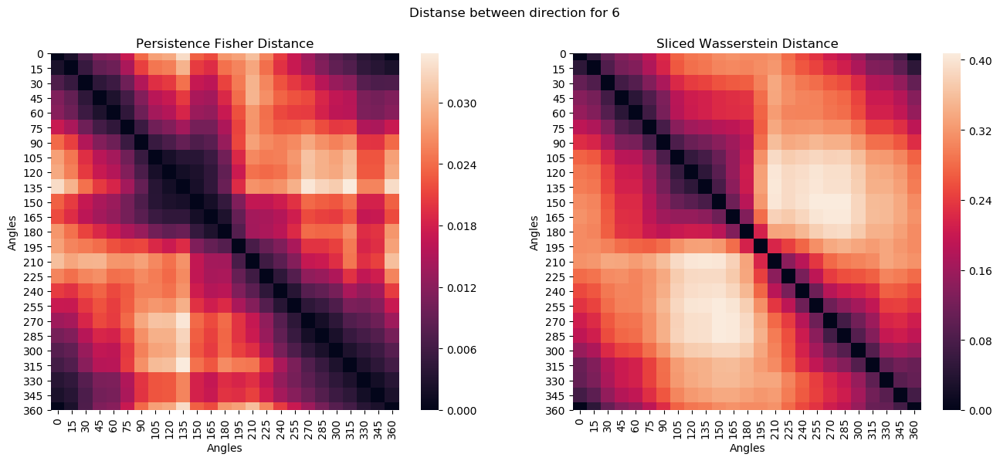

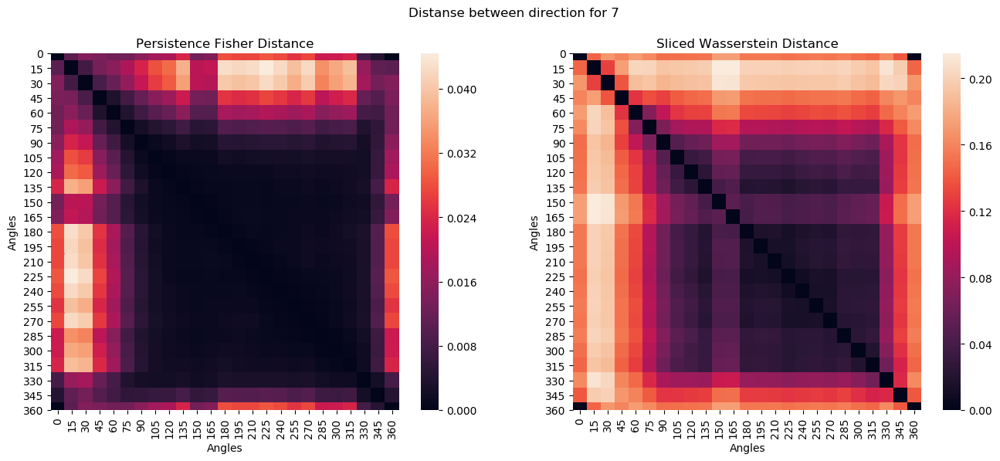

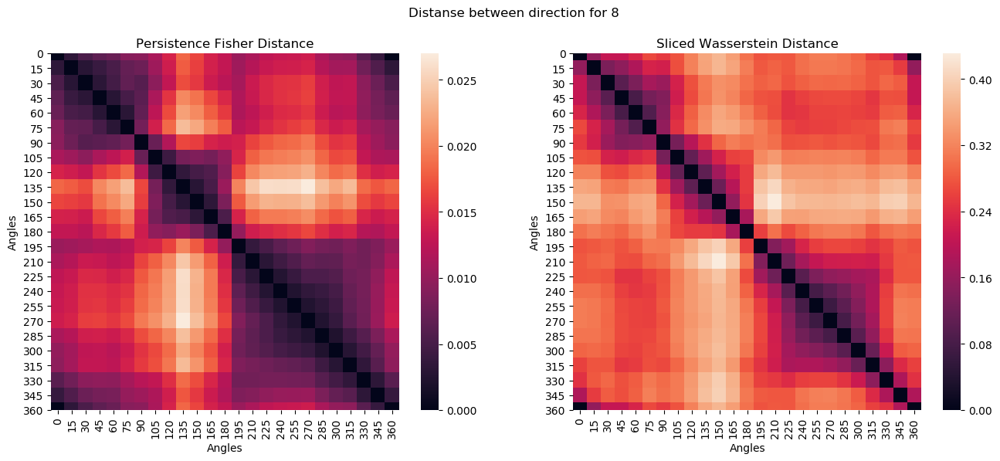

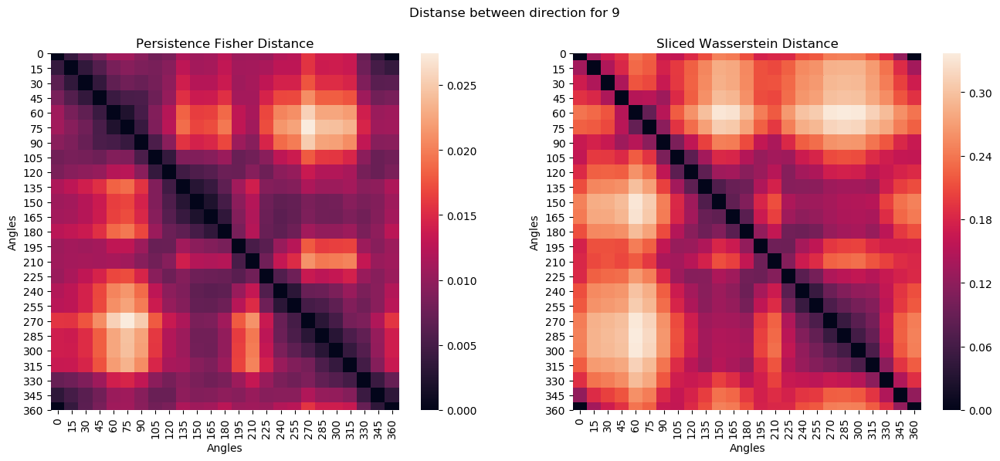

In [19]:
for i in range(10):
    print(i)
    idx = np.argwhere(I[:,0] == i)
    images = I[idx,1:].reshape(-1,28,28)
    rnd = np.random.choice(images.shape[0],300)
    sub_images = images[rnd]
    plot_dist_mat(sub_images, 15, i)

In [ ]:
idx = np.argwhere(I[:,0] == 4)
image = np.reshape(I[idx[21],1:], [28,28])

In [84]:
images = I[idx,1:].reshape(-1,28,28)

(2, 2)
(2, 2)
(3, 2)
(1, 2)
(2, 2)
(2, 2)
(3, 2)
(3, 2)
(3, 2)
(2, 2)
(2, 2)
(6, 2)
(2, 2)


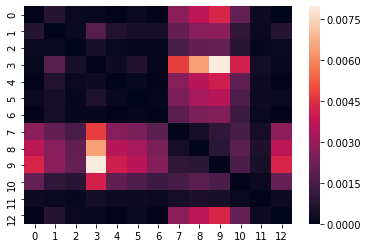

In [20]:
def generate_orbit(point_0, r, n=1000):
    
    X = np.zeros([n, 2])
    
    xcur, ycur = point_0[0], point_0[1]
    
    for idx in range(n):
        xcur = (xcur + r * ycur * (1. - ycur)) % 1
        ycur = (ycur + r * xcur * (1. - xcur)) % 1
        X[idx, :] = [xcur, ycur]
    
    return X

def generate_orbits(m, rs=[2.5, 3.5, 4.0, 4.1, 4.3], n=1000):
    
    # m orbits, each of n points of dimension 2
    orbits = np.zeros((m * len(rs), n, 2))
    
    # for each r
    for j, r in enumerate(rs):

        # initial points
        points_0 = np.random.uniform(size=(m,2))

        for i, point_0 in enumerate(points_0):
            orbits[j*m + i] = generate_orbit(points_0[i], rs[j], n)
            
    return orbits

In [21]:
class KDEFilter:
    def __init__(self, size, sigma):
        self.sigma = sigma
        self.size = size
        
    def transform(self, points):
        xval = np.arange(0, 1, self.size[0])
        yval = np.arange(0, 1, self.size[1])
        nx = len(xval)
        ny = len(yval)

        kde = KernelDensity(kernel = 'gaussian', bandwidth= self.sigma).fit(points)
        positions = np.array([[u,v] for u in xval for v in yval])
        scores = -np.exp(kde.score_samples(X = positions))
        return nx, ny, scores


In [22]:
# generate m point clouds in each of 5 classes with n points in each
# m=1000, n=1000, r=[2.5, 3.5, 4.0, 4.1, 4.3] is known as ORBIT5K dataset
X = generate_orbits(m=1000, n=1000)
X.shape

(5000, 1000, 2)

In [25]:
def get_animation_orbit5k(X, file_name):
    for ind, sigma in enumerate(np.arange(0.001, 0.1, 0.001)):
        fig, ax = plt.subplots(1,4, figsize = (24,6))
        filt = KDEFilter((1/250,1/250),sigma)
        nx, ny, filt_values = filt.transform(X)
        min_val = filt_values.min()
        filt_values = (filt_values - min_val)
        max_val = filt_values.max()
        filt_values = filt_values/max_val
        new_filt = filt_values.reshape(nx, ny)
        ax[0].imshow(new_filt, cmap = 'hot')
        ax[1].scatter(X[:,0],X[:,1], s=10, c="k")
        cc_density_crater = gd.CubicalComplex(
            dimensions = [nx ,ny], 
            top_dimensional_cells = filt_values
        )
        pers_density_crater = cc_density_crater.persistence()
        diag = get_diagram(pers_density_crater)
        ax[0].set_title('Kde filter with bandwidth = '+str(round(sigma,4)))
        ax[1].set_title('Scatter plot')
        X_betti_curve = diagram2vec.persistence_curve(diag, m=64)
        betti_curve = ax[2].step(np.linspace(0,1,64), X_betti_curve[0][0], color="r", where="post", linewidth=2, label="Pers-1", animated=True)
        try:
            betti_curve = ax[2].step(np.linspace(0,1,64), X_betti_curve[0][1], color="b", where="post", linewidth=2, label="Pers-2", animated=True)
        except:
            print('not have 2 dim')
            #betti_curve = ax3.step(np.linspace(0,1,64), np.zeros(64), color="b", where="post", linewidth=2, label="Pers-2", animated=True)
        ax[2].legend()
        vr.plot(diag, title = 'Persistent diagram', size = 15, xy_range = [-0.1, 1.1, -0.1, 1.1])
        #print(frames[-1])
        plt.savefig('animate/tmp'+str(ind)+'.png')
        plt.close()
        
    images = []
    for i in range(98):
        images.append(imageio.imread('animate/tmp'+str(i)+'.png'))
    imageio.mimsave(file_name, images, fps = 8)

    del images

In [26]:
ind = [100, 1200, 3400, 4200]
for i in ind:
    get_animation_orbit5k(X[i], 'animation_orbit5k'+str(i)+'.gif')

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

In [60]:
from scipy.ndimage import gaussian_filter
W = 300
sigma1 = 4
sigma2 = 2
t = 0.01

def generate(N, S, W=300, sigma1=4, sigma2=2, t=0.01, bins=64):

    z = np.zeros((N, S, 2))
    for n in range(N):
        z[n, 0] = np.random.uniform(0, W, size=(2))
        for s in range(S-1):
            d_1 = np.random.normal(0, sigma1)
            d_2 = np.random.normal(0, sigma1)
            z[n, s+1, 0] = (z[n, s, 0] + d_1) % W
            z[n, s+1, 1] = (z[n, s, 1] + d_2) % W

    z_r = z.reshape(N*S, 2)
    H, _, _ = np.histogram2d(z_r[:,0], z_r[:,1], bins=bins)
    
    G = gaussian_filter(H, sigma2)
    G[G < t] = 0
    
    return G

In [44]:
for t in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
    make_animation(images[60], 'matitial_B'+str(t)+'.gif', t, 20, True)

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]


not have 2 dim


C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwar

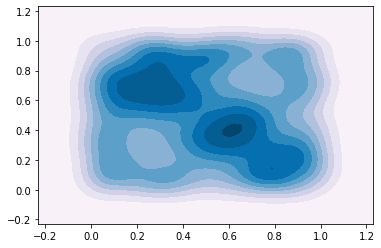

In [42]:
sns.kdeplot(
    X[24],
    shade = True, 
    cmap = "PuBu", 
    bw_method = .1
);

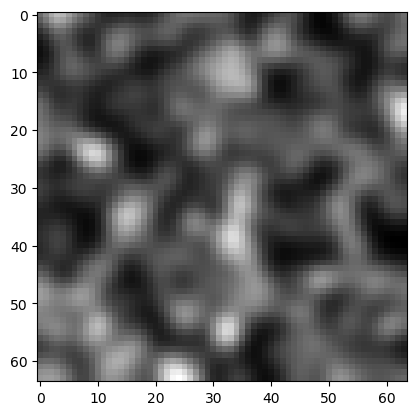

In [45]:
filt = DirectedFilter(np.pi, 0.8)
new_img = filt.transform(images[10])
plt.imshow(images[60], cmap = 'gray')


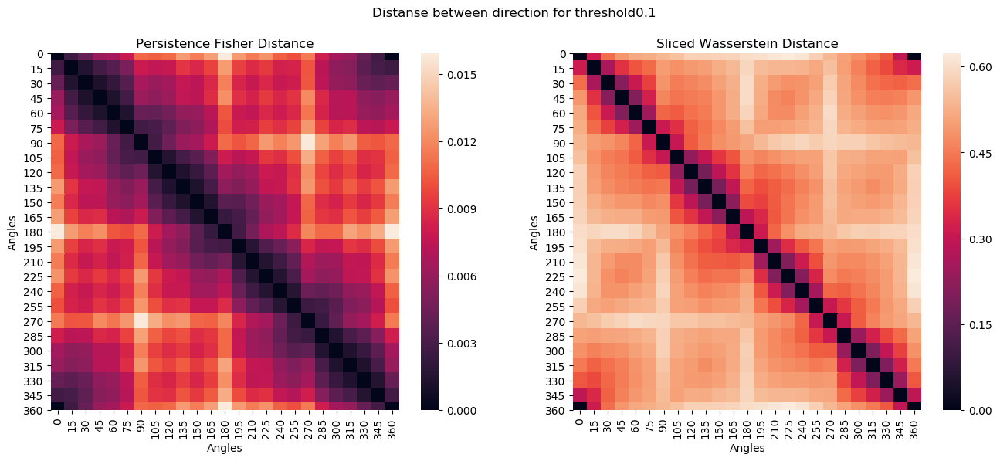

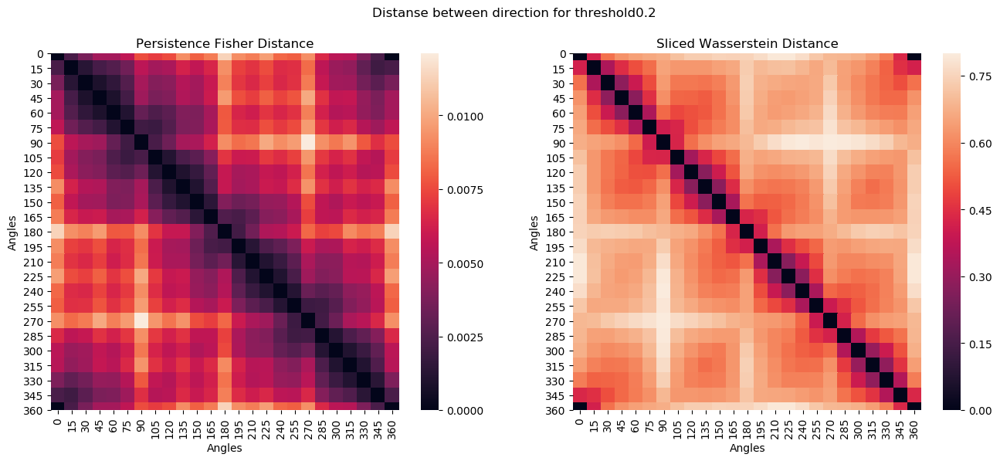

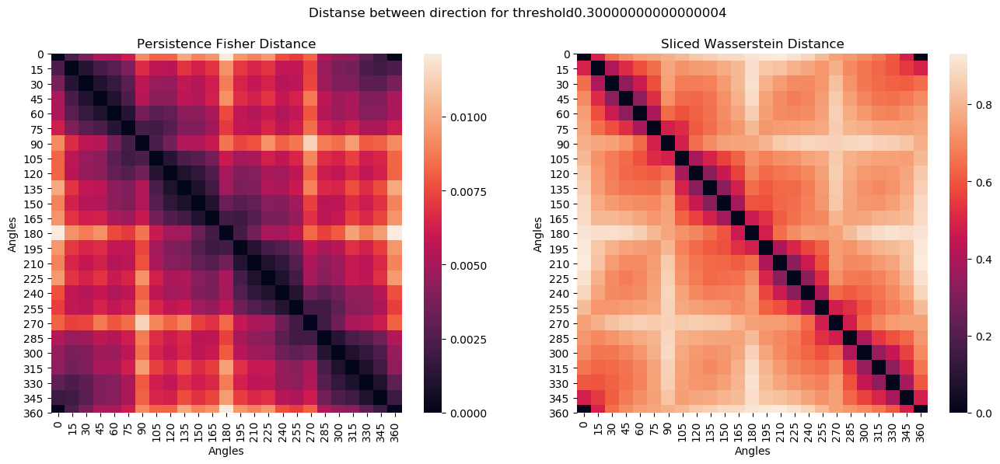

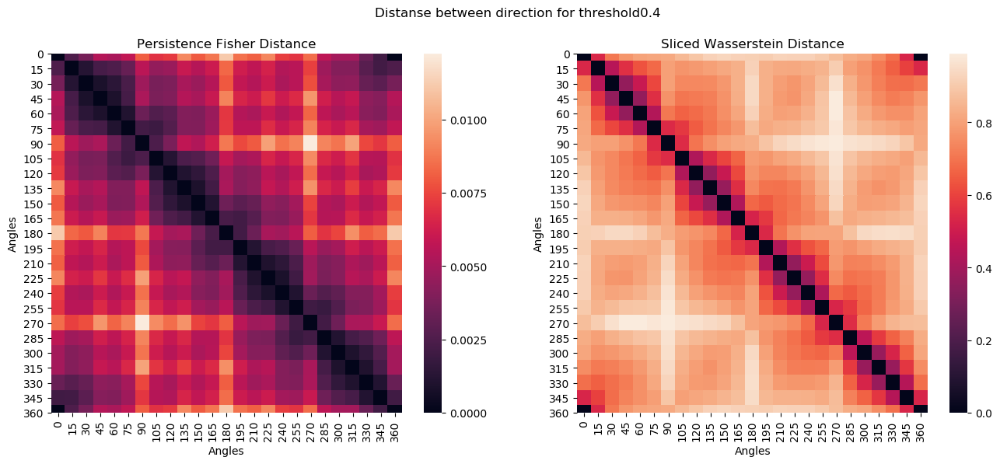

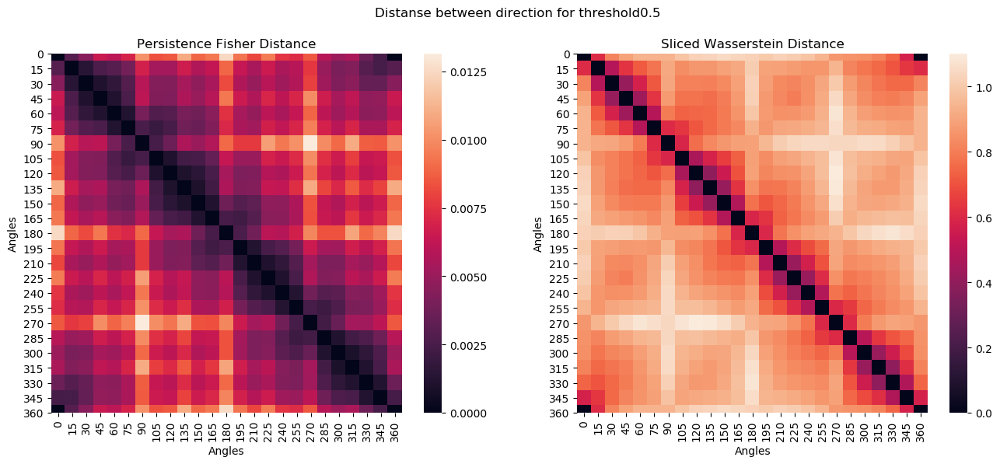

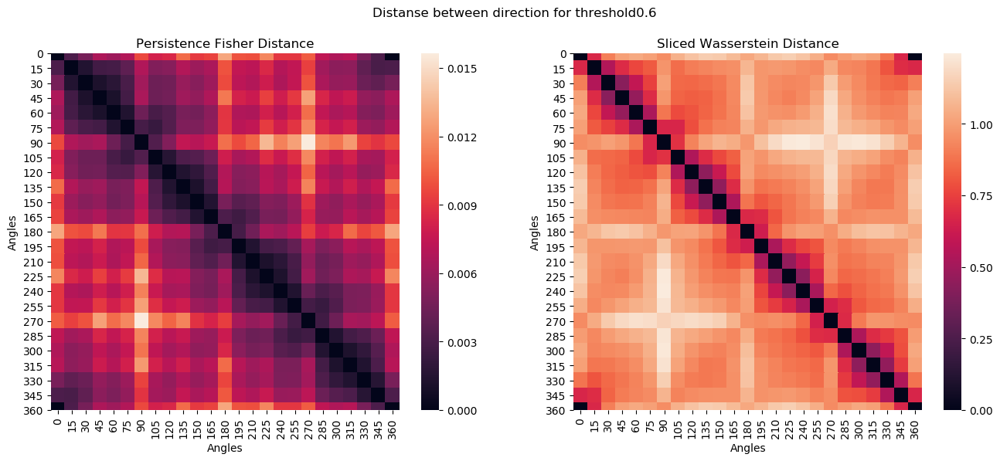

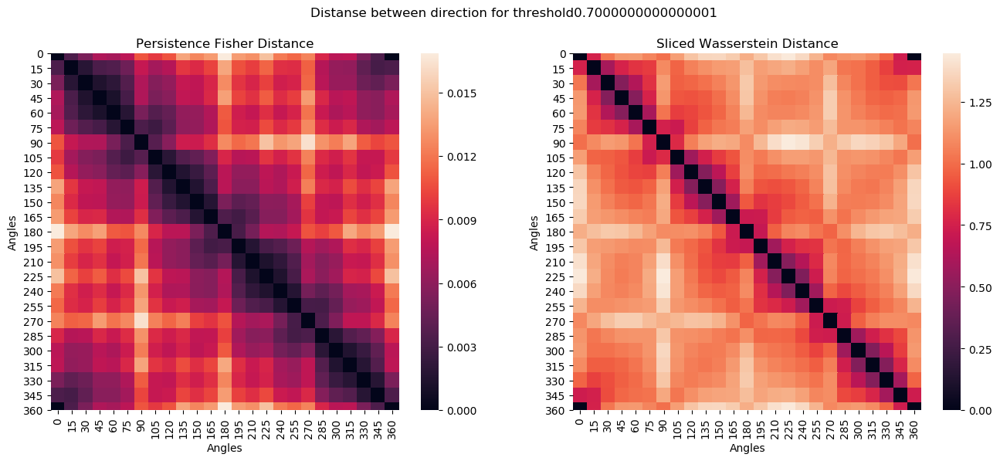

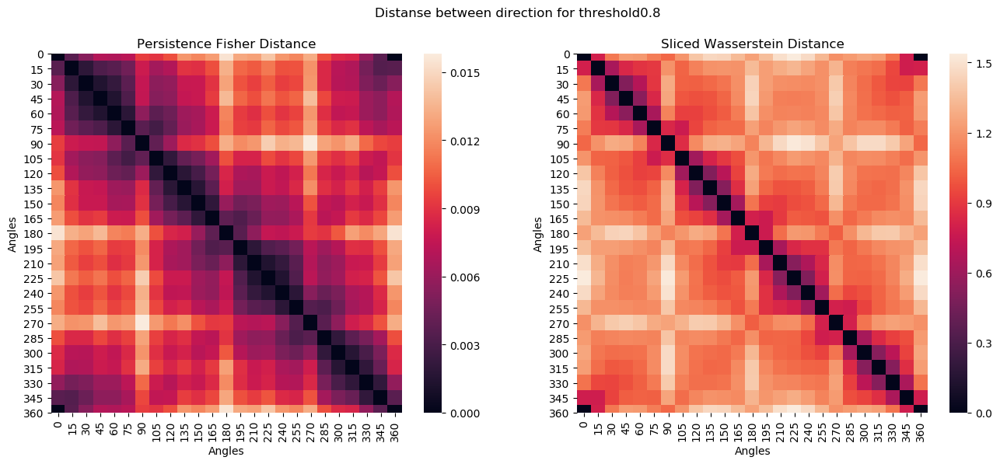

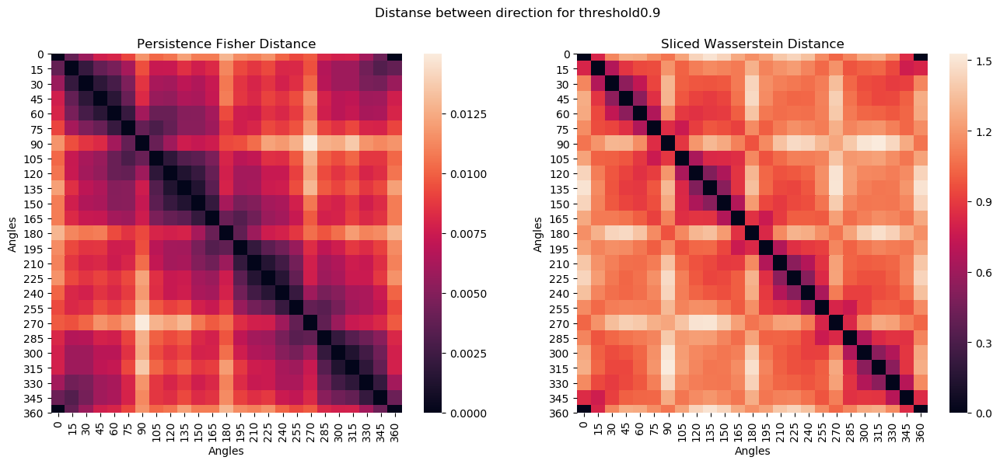

In [51]:
for i in np.arange(0.1, 0.91, 0.1):
    plot_dist_mat(images[0:50], 15, 'threshold'+str(i), i)

In [12]:
def BettiCurve(dgm):
    curver = gd.representations.vector_methods.BettiCurve(64)
    new_dgm = dgm.numpy()
    betti_curve = curver.fit_transform([new_dgm])
    return tf.convert_to_tensor(betti_curve)

In [5]:
def get_y(y):
    v = np.zeros(10)
    v[y] = 1
    return tf.reshape(tf.convert_to_tensor(v, tf.float32), (1,-1))

In [6]:
def Cubical(X, dim, card):
    # Parameters: X (image),
    #             dim (homological dimension), 
    #             card (number of persistence diagram points, sorted by distance-to-diagonal)

    # Compute the persistence pairs with Gudhi
    cc = gd.CubicalComplex(dimensions=X.shape, top_dimensional_cells=tf.reshape(X, (-1,)))
    cc.persistence()
    try:
        cof = cc.cofaces_of_persistence_pairs()[0][dim]
    except IndexError:
        cof = np.array([])
        
    Xs = X.shape

    if len(cof) > 0:
        # Sort points with distance-to-diagonal
        pers = [X[np.unravel_index(cof[idx,1], Xs)] - X[np.unravel_index(cof[idx,0], Xs)] for idx in range(len(cof))]
        perm = np.argsort(pers)
        cof = cof[perm[::-1]]
    
    # Retrieve and ouput image indices/pixels corresponding to positive and negative simplices
    D = len(Xs)
    ocof = np.array([0 for _ in range(D*card*2)])
    count = 0
    for idx in range(0,min(2*card, 2*cof.shape[0]),2):
        ocof[D*idx:D*(idx+1)]     = np.unravel_index(cof[count,0], Xs)
        ocof[D*(idx+1):D*(idx+2)] = np.unravel_index(cof[count,1], Xs)
        count += 1
    return list(np.array(ocof, dtype=np.int32))

class CubicalModel(tf.keras.Model):
    def __init__(self, X, dim=1, card=50):
        super(CubicalModel, self).__init__()
        self.X = X
        self.dim = dim
        self.card = card
        
    def call(self):
        d, c, D = self.dim, self.card, len(self.X.shape)
        XX = tf.reshape(self.X, [1, self.X.shape[0], self.X.shape[1]])
        
        # Turn numpy function into tensorflow function
        CbTF = lambda X: tf.py_function(Cubical, [X, d, c], [tf.int32 for _ in range(2*D*c)])
        
        # Compute pixels associated to positive and negative simplices 
        # Don't compute gradient for this operation
        inds = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(CbTF, XX, dtype=[tf.int32 for _ in range(2*D*c)]))
        
        # Get persistence diagram by simply picking the corresponding entries in the image
        dgm = tf.reshape(tf.gather_nd(self.X, tf.reshape(inds, [-1,D])), [-1,2])
        return dgm

In [7]:
def persistance_landscape(dgm, t):
    return tf.maximum((dgm[:,0] - tf.abs(t - dgm[:,1])), np.array([0]))

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
C = tf.Variable(initial_value=np.array((np.pi/2, ), dtype=np.float32), trainable=True)
num_epochs = 10
hdim = 0
hcard = 50
W = tf.Variable(name='weight', initial_value = tf.random.uniform((64, 10)), trainable=True)
for epoch in range(num_epochs+1):
    for ind, img in enumerate(I):
        y = get_y(img[0])
        image = np.reshape(img[1:], [28,28])
        image = image / 255
        image = np.array(image > 0, np.float64)
        
        with tf.GradientTape() as tape:
            img = image
            inds = np.argwhere(img > 0)
            IX, IY = 1e3 * np.ones(img.shape), 1e3 * np.ones(img.shape)
            for k in range(len(inds)):
                IX[inds[k,0], inds[k,1]] = inds[k,0]
                IY[inds[k,0], inds[k,1]] = inds[k,1]
                
            II = tf.math.cos(C)*IX + tf.math.sin(C)*IY
            II = II/1e3
            
            dgm = CubicalModel(II, dim=hdim, card=hcard).call()
            ranger = tf.range(-2,2,4/64)
            LSTF = lambda X: tf.py_function(persistance_landscape, [dgm, X], tf.float32)
            lanscape = tf.map_fn(LSTF, ranger, dtype = tf.float32)
            vector = tf.reshape(tf.math.reduce_max(lanscape, axis=1), [1, -1])
            l1 = tf.nn.softmax(vector@W)
            loss = tf.compat.v1.losses.softmax_cross_entropy(y, l1)
            
            gradients = tape.gradient(loss, [C, W])
            optimizer.apply_gradients(zip(gradients, [C, W]))
            
            if(ind%100 == 0):
                print(loss)

tf.Tensor(2.3334038, shape=(), dtype=float32)
tf.Tensor(2.3635902, shape=(), dtype=float32)
tf.Tensor(2.2068114, shape=(), dtype=float32)
tf.Tensor(2.3979223, shape=(), dtype=float32)
tf.Tensor(2.247299, shape=(), dtype=float32)
tf.Tensor(2.345008, shape=(), dtype=float32)
tf.Tensor(2.285487, shape=(), dtype=float32)
tf.Tensor(2.305132, shape=(), dtype=float32)
tf.Tensor(2.2918696, shape=(), dtype=float32)
tf.Tensor(2.30023, shape=(), dtype=float32)
tf.Tensor(2.3131816, shape=(), dtype=float32)
tf.Tensor(2.379941, shape=(), dtype=float32)
tf.Tensor(2.2483664, shape=(), dtype=float32)
tf.Tensor(2.2430182, shape=(), dtype=float32)
tf.Tensor(2.2597063, shape=(), dtype=float32)
tf.Tensor(2.304121, shape=(), dtype=float32)
tf.Tensor(2.305336, shape=(), dtype=float32)
tf.Tensor(2.2978578, shape=(), dtype=float32)
tf.Tensor(2.3026953, shape=(), dtype=float32)
tf.Tensor(2.3014355, shape=(), dtype=float32)
tf.Tensor(2.326242, shape=(), dtype=float32)
tf.Tensor(2.3028083, shape=(), dtype=float32

In [5]:
X = I[:, 1:].reshape((-1,28,28))
y = I[:, 0]

In [8]:
new_X = []
F = PersistenceFisherDistance(0.5)
for img in tqdm(X):
    sim_table = get_sim_table(img, 30, F, 0.4)
    tri_upper_diag = np.triu(sim_table, k=0).reshape((-1,))
    new_X.append(tri_upper_diag)
    
new_X = np.array(new_X)

100%|██████████████████████████████████████████████████████████████████████████| 60000/60000 [2:27:17<00:00,  6.79it/s]


In [9]:
import json
with open('prep_data_mnist2.json', 'w') as f:
    json.dump({'data' : new_X.tolist()}, f)

In [101]:
with open('prep_data_mnist.json', 'r') as f:
    data = json.load(f)

In [104]:
new_X = np.array(data['data'])

[[0.0,
  0.012749603692673342,
  0.017095385235744092,
  0.029266542327557342,
  0.010043140119269765,
  0.010326381989746282,
  0.013270523666807473,
  0.0259188322170461,
  0.028559492644488694,
  0.04865892479556895,
  0.02577347707278559,
  0.0014910897610261194,
  0.0,
  0.0,
  0.0,
  0.0010924307479119422,
  0.002056351320701438,
  0.000266206868741203,
  0.0012298911686384453,
  0.003175640691072048,
  0.0015366081949174126,
  0.001989904597984973,
  0.00375140066028891,
  0.0013551237900915768,
  0.012142587300584718,
  0.01274960369268205,
  0.0,
  0.0,
  0.0,
  0.00016658274374519602,
  0.0005638322892353504,
  0.0027219793400217003,
  0.005751770629248067,
  0.00014276381297481826,
  0.00017188368349568313,
  0.0004528964991796737,
  0.0004013463363857539,
  0.016384125789823463,
  0.017095385235744092,
  0.0,
  0.0,
  0.0,
  0.0,
  0.001065376925856199,
  0.004812646138154737,
  0.010652083412814822,
  0.00046544564275381115,
  5.914380130346842e-05,
  0.0003431842128065019

In [106]:
X_train, X_test, y_train, y_test = train_test_split(new_X, y, test_size=0.3, random_state=42)

In [107]:
import lightgbm
lgb = lightgbm.LGBMClassifier()

In [108]:
searcher = GridSearchCV(lgb, {'num_leaves' : np.arange(10, 201, 25),
                             'learning_rate' : [0.001, 0.01, 0.1],
                             'n_estimators' : [100, 200, 250]},
                       scoring = 'accuracy',
                       cv = 5,
                       verbose = 3)

In [109]:
searcher.fit(X_train, y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.773, total=   4.7s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.6s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.786, total=   4.8s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    9.5s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.783, total=   4.4s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.784, total=   4.2s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.781, total=   4.2s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=35 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=35, score=0.831, total=   9.7s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=35 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=35, score=0.843, total=   9.3s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=35 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=35, score=0.835, total=   9.0s
[CV] learning_rate=0.001, n_estimators=100, num_leav

[CV] learning_rate=0.001, n_estimators=250, num_leaves=135 ...........
[CV]  learning_rate=0.001, n_estimators=250, num_leaves=135, score=0.873, total= 1.1min
[CV] learning_rate=0.001, n_estimators=250, num_leaves=135 ...........
[CV]  learning_rate=0.001, n_estimators=250, num_leaves=135, score=0.882, total= 1.1min
[CV] learning_rate=0.001, n_estimators=250, num_leaves=135 ...........
[CV]  learning_rate=0.001, n_estimators=250, num_leaves=135, score=0.875, total= 1.1min
[CV] learning_rate=0.001, n_estimators=250, num_leaves=135 ...........
[CV]  learning_rate=0.001, n_estimators=250, num_leaves=135, score=0.875, total= 1.1min
[CV] learning_rate=0.001, n_estimators=250, num_leaves=135 ...........
[CV]  learning_rate=0.001, n_estimators=250, num_leaves=135, score=0.877, total= 1.1min
[CV] learning_rate=0.001, n_estimators=250, num_leaves=160 ...........
[CV]  learning_rate=0.001, n_estimators=250, num_leaves=160, score=0.875, total= 1.2min
[CV] learning_rate=0.001, n_estimators=250, nu

[CV]  learning_rate=0.01, n_estimators=250, num_leaves=35, score=0.893, total=  27.2s
[CV] learning_rate=0.01, n_estimators=250, num_leaves=35 .............
[CV]  learning_rate=0.01, n_estimators=250, num_leaves=35, score=0.899, total=  28.8s
[CV] learning_rate=0.01, n_estimators=250, num_leaves=60 .............
[CV]  learning_rate=0.01, n_estimators=250, num_leaves=60, score=0.907, total=  38.5s
[CV] learning_rate=0.01, n_estimators=250, num_leaves=60 .............
[CV]  learning_rate=0.01, n_estimators=250, num_leaves=60, score=0.905, total=  38.1s
[CV] learning_rate=0.01, n_estimators=250, num_leaves=60 .............
[CV]  learning_rate=0.01, n_estimators=250, num_leaves=60, score=0.900, total=  38.6s
[CV] learning_rate=0.01, n_estimators=250, num_leaves=60 .............
[CV]  learning_rate=0.01, n_estimators=250, num_leaves=60, score=0.901, total=  39.6s
[CV] learning_rate=0.01, n_estimators=250, num_leaves=60 .............
[CV]  learning_rate=0.01, n_estimators=250, num_leaves=60,

[CV]  learning_rate=0.1, n_estimators=200, num_leaves=160, score=0.919, total=  46.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=160 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=160, score=0.922, total=  45.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=160 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=160, score=0.926, total=  43.3s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=185 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=185, score=0.928, total=  45.1s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=185 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=185, score=0.924, total=  45.1s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=185 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=185, score=0.920, total=  46.2s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=185 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=185,

[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed: 211.7min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                      

In [132]:
searcher.best_score_

0.926952380952381

In [57]:
clf = searcher.best_estimator_

In [112]:
clf.fit(X_train, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=200, n_jobs=-1, num_leaves=10, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [113]:
(clf.predict(X_test) == y_test).mean()

0.9146111111111112

In [140]:
def get_error_table(y_true, y_pred, num_classes):
    t = np.zeros((num_classes, num_classes))
    for i in range(len(y_true)):
        t[y_true[i],y_pred[i]] += 1
    
    for i in range(num_classes):
        t[i] = t[i]/t[i].sum()
    return t

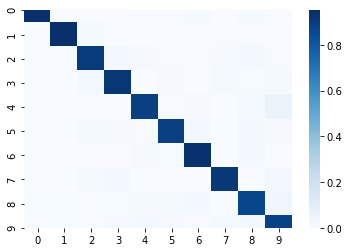

In [141]:
table = get_error_table(y_test, clf.predict(X_test), 10)
sns.heatmap(table, cmap = 'Blues')

In [150]:
table[9].round(3)

array([0.005, 0.01 , 0.006, 0.014, 0.023, 0.012, 0.001, 0.018, 0.023,
       0.889])

In [88]:
def generate_data_set(num_first_class, num_second_class, s1, s2):
    images = np.zeros((num_first_class + num_second_class,64,64))

    # class A

    

    for n in range(num_first_class):
        images[n] = generate(N, s1)

    # class B
    
    

    for n in range(num_second_class):
        images[n+num_second_class] = generate(N, s2)
    
    y = np.zeros(num_first_class + num_second_class)
    y[:num_first_class] = 1
    
    return images, y

In [95]:
X, y = generate_data_set(1000, 1000, 10, 15)

In [17]:
new_X = []
F = PersistenceFisherDistance(0.5)
for img in tqdm(X):
    sim_table = get_sim_table(img, 30, F, 0.4)
    tri_upper_diag = sim_table[np.triu_indices(sim_table.shape[0])]
    new_X.append(tri_upper_diag)
    
new_X = np.array(new_X)

100%|██████████████████████████████████████████████████████████████████████████| 60000/60000 [2:09:59<00:00,  7.69it/s]


In [20]:
import lightgbm
lgb = lightgbm.LGBMClassifier()
searcher = GridSearchCV(lgb, {'num_leaves' : np.arange(10, 201, 50),
                             'learning_rate' : [0.001, 0.01, 0.1],
                             'n_estimators' : [100, 200]},
                       scoring = 'accuracy',
                       cv = 5,
                       verbose = 3)

In [21]:
X_train, X_test, y_train, y_test = train_test_split(new_X, y, test_size=0.2, random_state=42)

In [22]:
searcher.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.746, total=   5.4s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.3s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.735, total=   5.4s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   10.7s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.740, total=   5.4s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.749, total=   5.1s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.740, total=   5.2s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.813, total=  13.9s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.809, total=  14.8s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.814, total=  16.7s
[CV] learning_rate=0.001, n_estimators=100, num_leav

[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.906, total=  44.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.904, total=  48.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.908, total=  42.7s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.906, total=  44.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.907, total=  44.7s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, score=0.908, total= 1.1min
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, scor

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed: 67.7min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                      

In [23]:
searcher.best_score_

0.9070625

In [100]:
clf = searcher.best_estimator_
clf.fit(X_train, y_train)
(clf.predict(X_test) == y_test).mean()

0.785

In [135]:
def get_betty_curve(img, angles, dim):
    res = np.zeros(dim)
    
    for angle in angles:
        filt = DirectedFilter(angle = np.random.uniform(), threshold = 0.4)
        new_img = filt.transform(img)
        cc_density_crater = gd.CubicalComplex(dimensions = new_img.shape, 
                                          top_dimensional_cells = new_img.reshape(-1))

        pers_density_crater = cc_density_crater.persistence()
        diag = get_diagram(pers_density_crater)
        X_betti_curve = diagram2vec.persistence_curve(diag, m=dim)
        res = res + np.array(X_betti_curve[0][0])
    
    return list(res/len(angles))

In [136]:
new_X = []
for i in tqdm(X):
    new_X.append(get_betty_curve(i, np.arange(0, 2*np.pi, np.pi/6), 128))







  0%|                                                                                        | 0/60000 [00:00<?, ?it/s]C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]





  0%|                                                                              | 2/60000 [00:00<1:34:25, 10.59it/s]




  0%|                                                                              | 4/60000 [00:00<1:30:22, 11.06it/s]




  0%|                                                                              | 6/60000 [00:00<1:30:51, 11.00it/s]




  0%|                                                                              | 8/60000 [00:00<1:29:13, 11.21it/s]




  0%|                                   

  0%|▎                                                                           | 258/60000 [00:22<1:26:28, 11.51it/s]




  0%|▎                                                                           | 260/60000 [00:23<1:26:04, 11.57it/s]




  0%|▎                                                                           | 262/60000 [00:23<1:25:37, 11.63it/s]




  0%|▎                                                                           | 264/60000 [00:23<1:25:27, 11.65it/s]




  0%|▎                                                                           | 266/60000 [00:23<1:26:31, 11.51it/s]




  0%|▎                                                                           | 268/60000 [00:23<1:26:31, 11.50it/s]




  0%|▎                                                                           | 270/60000 [00:24<1:25:02, 11.71it/s]




  0%|▎                                                                           | 272/60000 [00:24<1:23:28, 11.93it/s]




  0%|▎  

  1%|▋                                                                           | 522/60000 [00:45<1:25:53, 11.54it/s]




  1%|▋                                                                           | 524/60000 [00:46<1:25:04, 11.65it/s]




  1%|▋                                                                           | 526/60000 [00:46<1:26:00, 11.53it/s]




  1%|▋                                                                           | 528/60000 [00:46<1:27:05, 11.38it/s]




  1%|▋                                                                           | 530/60000 [00:46<1:28:26, 11.21it/s]




  1%|▋                                                                           | 532/60000 [00:46<1:32:21, 10.73it/s]




  1%|▋                                                                           | 534/60000 [00:46<1:31:50, 10.79it/s]




  1%|▋                                                                           | 536/60000 [00:47<1:30:08, 11.00it/s]




  1%|▋  

  1%|▉                                                                           | 786/60000 [01:08<1:25:48, 11.50it/s]




  1%|▉                                                                           | 788/60000 [01:09<1:25:39, 11.52it/s]




  1%|█                                                                           | 790/60000 [01:09<1:25:41, 11.52it/s]




  1%|█                                                                           | 792/60000 [01:09<1:27:38, 11.26it/s]




  1%|█                                                                           | 794/60000 [01:09<1:28:16, 11.18it/s]




  1%|█                                                                           | 796/60000 [01:09<1:27:31, 11.27it/s]




  1%|█                                                                           | 798/60000 [01:10<1:26:51, 11.36it/s]




  1%|█                                                                           | 800/60000 [01:10<1:25:56, 11.48it/s]




  1%|█  

  2%|█▎                                                                         | 1050/60000 [01:31<1:26:50, 11.31it/s]




  2%|█▎                                                                         | 1052/60000 [01:32<1:25:14, 11.53it/s]




  2%|█▎                                                                         | 1054/60000 [01:32<1:24:41, 11.60it/s]




  2%|█▎                                                                         | 1056/60000 [01:32<1:25:22, 11.51it/s]




  2%|█▎                                                                         | 1058/60000 [01:32<1:24:47, 11.59it/s]




  2%|█▎                                                                         | 1060/60000 [01:32<1:24:41, 11.60it/s]




  2%|█▎                                                                         | 1062/60000 [01:33<1:24:01, 11.69it/s]




  2%|█▎                                                                         | 1064/60000 [01:33<1:24:34, 11.61it/s]




  2%|█▎ 

  2%|█▋                                                                         | 1314/60000 [01:55<1:26:48, 11.27it/s]




  2%|█▋                                                                         | 1316/60000 [01:55<1:27:27, 11.18it/s]




  2%|█▋                                                                         | 1318/60000 [01:55<1:28:55, 11.00it/s]




  2%|█▋                                                                         | 1320/60000 [01:55<1:29:04, 10.98it/s]




  2%|█▋                                                                         | 1322/60000 [01:55<1:26:58, 11.24it/s]




  2%|█▋                                                                         | 1324/60000 [01:56<1:27:07, 11.23it/s]




  2%|█▋                                                                         | 1326/60000 [01:56<1:26:55, 11.25it/s]




  2%|█▋                                                                         | 1328/60000 [01:56<1:25:45, 11.40it/s]




  2%|█▋ 

  3%|█▉                                                                         | 1578/60000 [02:18<1:23:57, 11.60it/s]




  3%|█▉                                                                         | 1580/60000 [02:18<1:24:18, 11.55it/s]




  3%|█▉                                                                         | 1582/60000 [02:18<1:24:59, 11.46it/s]




  3%|█▉                                                                         | 1584/60000 [02:18<1:24:35, 11.51it/s]




  3%|█▉                                                                         | 1586/60000 [02:18<1:24:18, 11.55it/s]




  3%|█▉                                                                         | 1588/60000 [02:19<1:24:33, 11.51it/s]




  3%|█▉                                                                         | 1590/60000 [02:19<1:24:25, 11.53it/s]




  3%|█▉                                                                         | 1592/60000 [02:19<1:24:37, 11.50it/s]




  3%|█▉ 

  3%|██▎                                                                        | 1842/60000 [02:41<1:22:22, 11.77it/s]




  3%|██▎                                                                        | 1844/60000 [02:41<1:23:31, 11.60it/s]




  3%|██▎                                                                        | 1846/60000 [02:41<1:24:45, 11.43it/s]




  3%|██▎                                                                        | 1848/60000 [02:41<1:26:12, 11.24it/s]




  3%|██▎                                                                        | 1850/60000 [02:41<1:25:11, 11.38it/s]




  3%|██▎                                                                        | 1852/60000 [02:41<1:24:19, 11.49it/s]




  3%|██▎                                                                        | 1854/60000 [02:42<1:24:35, 11.46it/s]




  3%|██▎                                                                        | 1856/60000 [02:42<1:24:50, 11.42it/s]




  3%|██▎

  4%|██▋                                                                        | 2106/60000 [03:04<1:24:41, 11.39it/s]




  4%|██▋                                                                        | 2108/60000 [03:04<1:24:35, 11.41it/s]




  4%|██▋                                                                        | 2110/60000 [03:04<1:23:04, 11.61it/s]




  4%|██▋                                                                        | 2112/60000 [03:04<1:22:09, 11.74it/s]




  4%|██▋                                                                        | 2114/60000 [03:04<1:23:06, 11.61it/s]




  4%|██▋                                                                        | 2116/60000 [03:05<1:23:03, 11.62it/s]




  4%|██▋                                                                        | 2118/60000 [03:05<1:24:09, 11.46it/s]




  4%|██▋                                                                        | 2120/60000 [03:05<1:24:21, 11.43it/s]




  4%|██▋

  4%|██▉                                                                        | 2370/60000 [03:27<1:22:57, 11.58it/s]




  4%|██▉                                                                        | 2372/60000 [03:27<1:23:24, 11.51it/s]




  4%|██▉                                                                        | 2374/60000 [03:27<1:24:00, 11.43it/s]




  4%|██▉                                                                        | 2376/60000 [03:27<1:21:57, 11.72it/s]




  4%|██▉                                                                        | 2378/60000 [03:27<1:22:42, 11.61it/s]




  4%|██▉                                                                        | 2380/60000 [03:28<1:23:48, 11.46it/s]




  4%|██▉                                                                        | 2382/60000 [03:28<1:23:33, 11.49it/s]




  4%|██▉                                                                        | 2384/60000 [03:28<1:25:24, 11.24it/s]




  4%|██▉

  4%|███▎                                                                       | 2634/60000 [03:50<1:23:44, 11.42it/s]




  4%|███▎                                                                       | 2636/60000 [03:50<1:24:50, 11.27it/s]




  4%|███▎                                                                       | 2638/60000 [03:50<1:25:28, 11.19it/s]




  4%|███▎                                                                       | 2640/60000 [03:50<1:24:28, 11.32it/s]




  4%|███▎                                                                       | 2642/60000 [03:51<1:25:38, 11.16it/s]




  4%|███▎                                                                       | 2644/60000 [03:51<1:25:09, 11.22it/s]




  4%|███▎                                                                       | 2646/60000 [03:51<1:24:24, 11.33it/s]




  4%|███▎                                                                       | 2648/60000 [03:51<1:25:00, 11.24it/s]




  4%|███

  5%|███▌                                                                       | 2898/60000 [04:13<1:22:05, 11.59it/s]




  5%|███▋                                                                       | 2900/60000 [04:13<1:22:25, 11.55it/s]




  5%|███▋                                                                       | 2902/60000 [04:13<1:23:05, 11.45it/s]




  5%|███▋                                                                       | 2904/60000 [04:13<1:21:43, 11.64it/s]




  5%|███▋                                                                       | 2906/60000 [04:14<1:22:44, 11.50it/s]




  5%|███▋                                                                       | 2908/60000 [04:14<1:20:18, 11.85it/s]




  5%|███▋                                                                       | 2910/60000 [04:14<1:24:44, 11.23it/s]




  5%|███▋                                                                       | 2912/60000 [04:14<1:27:58, 10.81it/s]




  5%|███

  5%|███▉                                                                       | 3162/60000 [04:37<1:27:23, 10.84it/s]




  5%|███▉                                                                       | 3164/60000 [04:37<1:27:09, 10.87it/s]




  5%|███▉                                                                       | 3166/60000 [04:37<1:27:25, 10.84it/s]




  5%|███▉                                                                       | 3168/60000 [04:37<1:26:02, 11.01it/s]




  5%|███▉                                                                       | 3170/60000 [04:37<1:26:54, 10.90it/s]




  5%|███▉                                                                       | 3172/60000 [04:38<1:25:49, 11.04it/s]




  5%|███▉                                                                       | 3174/60000 [04:38<1:26:12, 10.99it/s]




  5%|███▉                                                                       | 3176/60000 [04:38<1:26:10, 10.99it/s]




  5%|███

  6%|████▎                                                                      | 3426/60000 [05:00<1:26:51, 10.85it/s]




  6%|████▎                                                                      | 3428/60000 [05:01<1:24:41, 11.13it/s]




  6%|████▎                                                                      | 3430/60000 [05:01<1:24:04, 11.21it/s]




  6%|████▎                                                                      | 3432/60000 [05:01<1:21:27, 11.57it/s]




  6%|████▎                                                                      | 3434/60000 [05:01<1:21:44, 11.53it/s]




  6%|████▎                                                                      | 3436/60000 [05:01<1:22:58, 11.36it/s]




  6%|████▎                                                                      | 3438/60000 [05:02<1:24:13, 11.19it/s]




  6%|████▎                                                                      | 3440/60000 [05:02<1:24:06, 11.21it/s]




  6%|███

  6%|████▌                                                                      | 3690/60000 [05:24<1:22:42, 11.35it/s]




  6%|████▌                                                                      | 3692/60000 [05:24<1:23:46, 11.20it/s]




  6%|████▌                                                                      | 3694/60000 [05:25<1:25:13, 11.01it/s]




  6%|████▌                                                                      | 3696/60000 [05:25<1:24:41, 11.08it/s]




  6%|████▌                                                                      | 3698/60000 [05:25<1:23:45, 11.20it/s]




  6%|████▋                                                                      | 3700/60000 [05:25<1:25:04, 11.03it/s]




  6%|████▋                                                                      | 3702/60000 [05:25<1:25:17, 11.00it/s]




  6%|████▋                                                                      | 3704/60000 [05:25<1:23:02, 11.30it/s]




  6%|███

  7%|████▉                                                                      | 3909/60000 [05:46<1:37:52,  9.55it/s]




  7%|████▉                                                                      | 3911/60000 [05:47<1:37:22,  9.60it/s]




  7%|████▉                                                                      | 3913/60000 [05:47<1:35:54,  9.75it/s]




  7%|████▉                                                                      | 3914/60000 [05:47<1:41:02,  9.25it/s]




  7%|████▉                                                                      | 3916/60000 [05:47<1:39:01,  9.44it/s]




  7%|████▉                                                                      | 3918/60000 [05:47<1:39:17,  9.41it/s]




  7%|████▉                                                                      | 3919/60000 [05:48<1:40:53,  9.26it/s]




  7%|████▉                                                                      | 3920/60000 [05:48<1:40:02,  9.34it/s]




  7%|███

  7%|█████▏                                                                     | 4138/60000 [06:09<1:20:18, 11.59it/s]




  7%|█████▏                                                                     | 4140/60000 [06:09<1:20:49, 11.52it/s]




  7%|█████▏                                                                     | 4142/60000 [06:09<1:20:57, 11.50it/s]




  7%|█████▏                                                                     | 4144/60000 [06:09<1:22:44, 11.25it/s]




  7%|█████▏                                                                     | 4146/60000 [06:09<1:22:40, 11.26it/s]




  7%|█████▏                                                                     | 4148/60000 [06:09<1:19:52, 11.65it/s]




  7%|█████▏                                                                     | 4150/60000 [06:10<1:19:33, 11.70it/s]




  7%|█████▏                                                                     | 4152/60000 [06:10<1:24:55, 10.96it/s]




  7%|███

  7%|█████▍                                                                     | 4348/60000 [06:30<1:49:10,  8.50it/s]




  7%|█████▍                                                                     | 4349/60000 [06:30<1:45:20,  8.80it/s]




  7%|█████▍                                                                     | 4350/60000 [06:30<1:45:59,  8.75it/s]




  7%|█████▍                                                                     | 4351/60000 [06:30<1:46:43,  8.69it/s]




  7%|█████▍                                                                     | 4353/60000 [06:30<1:41:32,  9.13it/s]




  7%|█████▍                                                                     | 4354/60000 [06:31<1:48:19,  8.56it/s]




  7%|█████▍                                                                     | 4355/60000 [06:31<1:43:54,  8.93it/s]




  7%|█████▍                                                                     | 4356/60000 [06:31<1:43:02,  9.00it/s]




  7%|███

  8%|█████▋                                                                     | 4565/60000 [06:52<1:35:13,  9.70it/s]




  8%|█████▋                                                                     | 4566/60000 [06:52<1:36:50,  9.54it/s]




  8%|█████▋                                                                     | 4568/60000 [06:52<1:35:37,  9.66it/s]




  8%|█████▋                                                                     | 4569/60000 [06:52<1:36:00,  9.62it/s]




  8%|█████▋                                                                     | 4570/60000 [06:52<1:35:10,  9.71it/s]




  8%|█████▋                                                                     | 4571/60000 [06:52<1:36:15,  9.60it/s]




  8%|█████▋                                                                     | 4573/60000 [06:52<1:33:57,  9.83it/s]




  8%|█████▋                                                                     | 4574/60000 [06:53<1:34:01,  9.82it/s]




  8%|███

  8%|██████                                                                     | 4821/60000 [07:16<1:25:05, 10.81it/s]




  8%|██████                                                                     | 4823/60000 [07:16<1:23:17, 11.04it/s]




  8%|██████                                                                     | 4825/60000 [07:16<1:27:23, 10.52it/s]




  8%|██████                                                                     | 4827/60000 [07:17<1:26:56, 10.58it/s]




  8%|██████                                                                     | 4829/60000 [07:17<1:29:24, 10.28it/s]




  8%|██████                                                                     | 4831/60000 [07:17<1:29:56, 10.22it/s]




  8%|██████                                                                     | 4833/60000 [07:17<1:29:49, 10.24it/s]




  8%|██████                                                                     | 4835/60000 [07:17<1:35:24,  9.64it/s]




  8%|███

  8%|██████▎                                                                    | 5081/60000 [07:40<1:32:28,  9.90it/s]




  8%|██████▎                                                                    | 5083/60000 [07:41<1:30:48, 10.08it/s]




  8%|██████▎                                                                    | 5085/60000 [07:41<1:31:42,  9.98it/s]




  8%|██████▎                                                                    | 5086/60000 [07:41<1:33:01,  9.84it/s]




  8%|██████▎                                                                    | 5087/60000 [07:41<1:35:03,  9.63it/s]




  8%|██████▎                                                                    | 5088/60000 [07:41<1:33:59,  9.74it/s]




  8%|██████▎                                                                    | 5090/60000 [07:41<1:31:30, 10.00it/s]




  8%|██████▎                                                                    | 5092/60000 [07:42<1:29:58, 10.17it/s]




  8%|███

  9%|██████▋                                                                    | 5331/60000 [08:04<1:27:35, 10.40it/s]




  9%|██████▋                                                                    | 5333/60000 [08:05<1:26:42, 10.51it/s]




  9%|██████▋                                                                    | 5335/60000 [08:05<1:26:56, 10.48it/s]




  9%|██████▋                                                                    | 5337/60000 [08:05<1:27:04, 10.46it/s]




  9%|██████▋                                                                    | 5339/60000 [08:05<1:27:53, 10.37it/s]




  9%|██████▋                                                                    | 5341/60000 [08:05<1:30:52, 10.02it/s]




  9%|██████▋                                                                    | 5343/60000 [08:06<1:31:28,  9.96it/s]




  9%|██████▋                                                                    | 5344/60000 [08:06<1:32:31,  9.85it/s]




  9%|███

  9%|██████▉                                                                    | 5591/60000 [08:29<1:27:17, 10.39it/s]




  9%|██████▉                                                                    | 5593/60000 [08:29<1:26:33, 10.48it/s]




  9%|██████▉                                                                    | 5595/60000 [08:29<1:26:24, 10.49it/s]




  9%|██████▉                                                                    | 5597/60000 [08:30<1:25:54, 10.55it/s]




  9%|██████▉                                                                    | 5599/60000 [08:30<1:26:40, 10.46it/s]




  9%|███████                                                                    | 5601/60000 [08:30<1:25:00, 10.67it/s]




  9%|███████                                                                    | 5603/60000 [08:30<1:23:25, 10.87it/s]




  9%|███████                                                                    | 5605/60000 [08:30<1:23:09, 10.90it/s]




  9%|███

 10%|███████▎                                                                   | 5855/60000 [08:53<1:24:31, 10.68it/s]




 10%|███████▎                                                                   | 5857/60000 [08:54<1:24:29, 10.68it/s]




 10%|███████▎                                                                   | 5859/60000 [08:54<1:22:56, 10.88it/s]




 10%|███████▎                                                                   | 5861/60000 [08:54<1:22:25, 10.95it/s]




 10%|███████▎                                                                   | 5863/60000 [08:54<1:22:03, 11.00it/s]




 10%|███████▎                                                                   | 5865/60000 [08:54<1:20:58, 11.14it/s]




 10%|███████▎                                                                   | 5867/60000 [08:55<1:22:30, 10.93it/s]




 10%|███████▎                                                                   | 5869/60000 [08:55<1:23:51, 10.76it/s]




 10%|███

 10%|███████▋                                                                   | 6119/60000 [09:18<1:23:12, 10.79it/s]




 10%|███████▋                                                                   | 6121/60000 [09:18<1:23:56, 10.70it/s]




 10%|███████▋                                                                   | 6123/60000 [09:18<1:22:26, 10.89it/s]




 10%|███████▋                                                                   | 6125/60000 [09:19<1:22:47, 10.85it/s]




 10%|███████▋                                                                   | 6127/60000 [09:19<1:23:50, 10.71it/s]




 10%|███████▋                                                                   | 6129/60000 [09:19<1:23:28, 10.76it/s]




 10%|███████▋                                                                   | 6131/60000 [09:19<1:24:08, 10.67it/s]




 10%|███████▋                                                                   | 6133/60000 [09:19<1:24:27, 10.63it/s]




 10%|███

 11%|███████▉                                                                   | 6383/60000 [09:43<1:20:54, 11.04it/s]




 11%|███████▉                                                                   | 6385/60000 [09:43<1:20:37, 11.08it/s]




 11%|███████▉                                                                   | 6387/60000 [09:43<1:20:58, 11.04it/s]




 11%|███████▉                                                                   | 6389/60000 [09:43<1:21:19, 10.99it/s]




 11%|███████▉                                                                   | 6391/60000 [09:43<1:22:16, 10.86it/s]




 11%|███████▉                                                                   | 6393/60000 [09:43<1:23:03, 10.76it/s]




 11%|███████▉                                                                   | 6395/60000 [09:44<1:24:25, 10.58it/s]




 11%|███████▉                                                                   | 6397/60000 [09:44<1:22:55, 10.77it/s]




 11%|███

 11%|████████▎                                                                  | 6647/60000 [10:07<1:22:02, 10.84it/s]




 11%|████████▎                                                                  | 6649/60000 [10:07<1:21:01, 10.98it/s]




 11%|████████▎                                                                  | 6651/60000 [10:08<1:22:12, 10.82it/s]




 11%|████████▎                                                                  | 6653/60000 [10:08<1:22:27, 10.78it/s]




 11%|████████▎                                                                  | 6655/60000 [10:08<1:20:58, 10.98it/s]




 11%|████████▎                                                                  | 6657/60000 [10:08<1:21:20, 10.93it/s]




 11%|████████▎                                                                  | 6659/60000 [10:08<1:22:38, 10.76it/s]




 11%|████████▎                                                                  | 6661/60000 [10:08<1:22:33, 10.77it/s]




 11%|███

 12%|████████▋                                                                  | 6911/60000 [10:31<1:21:24, 10.87it/s]




 12%|████████▋                                                                  | 6913/60000 [10:32<1:21:30, 10.85it/s]




 12%|████████▋                                                                  | 6915/60000 [10:32<1:21:11, 10.90it/s]




 12%|████████▋                                                                  | 6917/60000 [10:32<1:21:14, 10.89it/s]




 12%|████████▋                                                                  | 6919/60000 [10:32<1:22:23, 10.74it/s]




 12%|████████▋                                                                  | 6921/60000 [10:32<1:22:09, 10.77it/s]




 12%|████████▋                                                                  | 6923/60000 [10:33<1:22:10, 10.77it/s]




 12%|████████▋                                                                  | 6925/60000 [10:33<1:23:30, 10.59it/s]




 12%|███

 12%|████████▉                                                                  | 7174/60000 [10:56<1:23:58, 10.48it/s]




 12%|████████▉                                                                  | 7176/60000 [10:56<1:21:45, 10.77it/s]




 12%|████████▉                                                                  | 7178/60000 [10:56<1:22:26, 10.68it/s]




 12%|████████▉                                                                  | 7180/60000 [10:57<1:23:27, 10.55it/s]




 12%|████████▉                                                                  | 7182/60000 [10:57<1:23:06, 10.59it/s]




 12%|████████▉                                                                  | 7184/60000 [10:57<1:23:31, 10.54it/s]




 12%|████████▉                                                                  | 7186/60000 [10:57<1:23:00, 10.60it/s]




 12%|████████▉                                                                  | 7188/60000 [10:57<1:22:01, 10.73it/s]




 12%|███

 12%|█████████▎                                                                 | 7438/60000 [11:20<1:19:13, 11.06it/s]




 12%|█████████▎                                                                 | 7440/60000 [11:21<1:20:08, 10.93it/s]




 12%|█████████▎                                                                 | 7442/60000 [11:21<1:19:51, 10.97it/s]




 12%|█████████▎                                                                 | 7444/60000 [11:21<1:20:06, 10.93it/s]




 12%|█████████▎                                                                 | 7446/60000 [11:21<1:19:49, 10.97it/s]




 12%|█████████▎                                                                 | 7448/60000 [11:21<1:19:22, 11.03it/s]




 12%|█████████▎                                                                 | 7450/60000 [11:22<1:19:11, 11.06it/s]




 12%|█████████▎                                                                 | 7452/60000 [11:22<1:19:51, 10.97it/s]




 12%|███

 13%|█████████▋                                                                 | 7702/60000 [11:45<1:19:39, 10.94it/s]




 13%|█████████▋                                                                 | 7704/60000 [11:45<1:20:06, 10.88it/s]




 13%|█████████▋                                                                 | 7706/60000 [11:45<1:21:09, 10.74it/s]




 13%|█████████▋                                                                 | 7708/60000 [11:45<1:21:32, 10.69it/s]




 13%|█████████▋                                                                 | 7710/60000 [11:45<1:22:06, 10.61it/s]




 13%|█████████▋                                                                 | 7712/60000 [11:46<1:21:49, 10.65it/s]




 13%|█████████▋                                                                 | 7714/60000 [11:46<1:22:51, 10.52it/s]




 13%|█████████▋                                                                 | 7716/60000 [11:46<1:22:44, 10.53it/s]




 13%|███

 13%|█████████▉                                                                 | 7965/60000 [12:09<1:19:17, 10.94it/s]




 13%|█████████▉                                                                 | 7967/60000 [12:09<1:20:19, 10.80it/s]




 13%|█████████▉                                                                 | 7969/60000 [12:09<1:19:16, 10.94it/s]




 13%|█████████▉                                                                 | 7971/60000 [12:10<1:21:33, 10.63it/s]




 13%|█████████▉                                                                 | 7973/60000 [12:10<1:20:17, 10.80it/s]




 13%|█████████▉                                                                 | 7975/60000 [12:10<1:18:48, 11.00it/s]




 13%|█████████▉                                                                 | 7977/60000 [12:10<1:18:51, 10.99it/s]




 13%|█████████▉                                                                 | 7979/60000 [12:10<1:20:25, 10.78it/s]




 13%|███

 14%|██████████▎                                                                | 8220/60000 [12:33<1:18:29, 10.99it/s]




 14%|██████████▎                                                                | 8222/60000 [12:33<1:19:58, 10.79it/s]




 14%|██████████▎                                                                | 8224/60000 [12:33<1:20:06, 10.77it/s]




 14%|██████████▎                                                                | 8226/60000 [12:33<1:19:05, 10.91it/s]




 14%|██████████▎                                                                | 8228/60000 [12:34<1:21:32, 10.58it/s]




 14%|██████████▎                                                                | 8230/60000 [12:34<1:21:11, 10.63it/s]




 14%|██████████▎                                                                | 8232/60000 [12:34<1:20:49, 10.67it/s]




 14%|██████████▎                                                                | 8234/60000 [12:34<1:19:10, 10.90it/s]




 14%|███

 14%|██████████▌                                                                | 8484/60000 [12:57<1:19:28, 10.80it/s]




 14%|██████████▌                                                                | 8486/60000 [12:58<1:19:34, 10.79it/s]




 14%|██████████▌                                                                | 8488/60000 [12:58<1:18:36, 10.92it/s]




 14%|██████████▌                                                                | 8490/60000 [12:58<1:20:54, 10.61it/s]




 14%|██████████▌                                                                | 8492/60000 [12:58<1:19:56, 10.74it/s]




 14%|██████████▌                                                                | 8494/60000 [12:58<1:20:55, 10.61it/s]




 14%|██████████▌                                                                | 8496/60000 [12:59<1:20:04, 10.72it/s]




 14%|██████████▌                                                                | 8498/60000 [12:59<1:21:24, 10.54it/s]




 14%|███

 15%|██████████▉                                                                | 8748/60000 [13:22<1:18:48, 10.84it/s]




 15%|██████████▉                                                                | 8750/60000 [13:22<1:19:13, 10.78it/s]




 15%|██████████▉                                                                | 8752/60000 [13:22<1:18:53, 10.83it/s]




 15%|██████████▉                                                                | 8754/60000 [13:23<1:19:56, 10.68it/s]




 15%|██████████▉                                                                | 8756/60000 [13:23<1:20:01, 10.67it/s]




 15%|██████████▉                                                                | 8758/60000 [13:23<1:19:11, 10.78it/s]




 15%|██████████▉                                                                | 8760/60000 [13:23<1:19:24, 10.76it/s]




 15%|██████████▉                                                                | 8762/60000 [13:23<1:18:14, 10.91it/s]




 15%|███

 15%|███████████▎                                                               | 9012/60000 [13:47<1:18:07, 10.88it/s]




 15%|███████████▎                                                               | 9014/60000 [13:47<1:16:20, 11.13it/s]




 15%|███████████▎                                                               | 9016/60000 [13:47<1:17:53, 10.91it/s]




 15%|███████████▎                                                               | 9018/60000 [13:47<1:18:47, 10.78it/s]




 15%|███████████▎                                                               | 9020/60000 [13:47<1:18:58, 10.76it/s]




 15%|███████████▎                                                               | 9022/60000 [13:47<1:20:14, 10.59it/s]




 15%|███████████▎                                                               | 9024/60000 [13:48<1:18:40, 10.80it/s]




 15%|███████████▎                                                               | 9026/60000 [13:48<1:18:45, 10.79it/s]




 15%|███

 15%|███████████▌                                                               | 9276/60000 [14:11<1:16:59, 10.98it/s]




 15%|███████████▌                                                               | 9278/60000 [14:11<1:15:44, 11.16it/s]




 15%|███████████▌                                                               | 9280/60000 [14:11<1:16:18, 11.08it/s]




 15%|███████████▌                                                               | 9282/60000 [14:12<1:17:03, 10.97it/s]




 15%|███████████▌                                                               | 9284/60000 [14:12<1:16:30, 11.05it/s]




 15%|███████████▌                                                               | 9286/60000 [14:12<1:17:31, 10.90it/s]




 15%|███████████▌                                                               | 9288/60000 [14:12<1:17:19, 10.93it/s]




 15%|███████████▌                                                               | 9290/60000 [14:12<1:16:55, 10.99it/s]




 15%|███

 16%|███████████▉                                                               | 9540/60000 [14:35<1:17:29, 10.85it/s]




 16%|███████████▉                                                               | 9542/60000 [14:36<1:16:02, 11.06it/s]




 16%|███████████▉                                                               | 9544/60000 [14:36<1:16:59, 10.92it/s]




 16%|███████████▉                                                               | 9546/60000 [14:36<1:17:27, 10.86it/s]




 16%|███████████▉                                                               | 9548/60000 [14:36<1:16:46, 10.95it/s]




 16%|███████████▉                                                               | 9550/60000 [14:36<1:15:57, 11.07it/s]




 16%|███████████▉                                                               | 9552/60000 [14:37<1:15:40, 11.11it/s]




 16%|███████████▉                                                               | 9554/60000 [14:37<1:16:17, 11.02it/s]




 16%|███

 16%|████████████▎                                                              | 9804/60000 [15:00<1:15:59, 11.01it/s]




 16%|████████████▎                                                              | 9806/60000 [15:00<1:16:36, 10.92it/s]




 16%|████████████▎                                                              | 9808/60000 [15:00<1:16:34, 10.92it/s]




 16%|████████████▎                                                              | 9810/60000 [15:00<1:16:40, 10.91it/s]




 16%|████████████▎                                                              | 9812/60000 [15:01<1:17:31, 10.79it/s]




 16%|████████████▎                                                              | 9814/60000 [15:01<1:17:26, 10.80it/s]




 16%|████████████▎                                                              | 9816/60000 [15:01<1:17:03, 10.85it/s]




 16%|████████████▎                                                              | 9818/60000 [15:01<1:17:23, 10.81it/s]




 16%|███

 17%|████████████▍                                                             | 10068/60000 [15:23<1:10:26, 11.81it/s]




 17%|████████████▍                                                             | 10070/60000 [15:23<1:10:38, 11.78it/s]




 17%|████████████▍                                                             | 10072/60000 [15:23<1:11:23, 11.65it/s]




 17%|████████████▍                                                             | 10074/60000 [15:23<1:11:48, 11.59it/s]




 17%|████████████▍                                                             | 10076/60000 [15:23<1:11:57, 11.56it/s]




 17%|████████████▍                                                             | 10078/60000 [15:24<1:11:33, 11.63it/s]




 17%|████████████▍                                                             | 10080/60000 [15:24<1:12:17, 11.51it/s]




 17%|████████████▍                                                             | 10082/60000 [15:24<1:11:50, 11.58it/s]




 17%|███

 17%|████████████▋                                                             | 10332/60000 [15:45<1:10:55, 11.67it/s]




 17%|████████████▋                                                             | 10334/60000 [15:45<1:12:28, 11.42it/s]




 17%|████████████▋                                                             | 10336/60000 [15:46<1:12:18, 11.45it/s]




 17%|████████████▊                                                             | 10338/60000 [15:46<1:10:37, 11.72it/s]




 17%|████████████▊                                                             | 10340/60000 [15:46<1:11:53, 11.51it/s]




 17%|████████████▊                                                             | 10342/60000 [15:46<1:11:21, 11.60it/s]




 17%|████████████▊                                                             | 10344/60000 [15:46<1:10:08, 11.80it/s]




 17%|████████████▊                                                             | 10346/60000 [15:46<1:08:09, 12.14it/s]




 17%|███

 18%|█████████████                                                             | 10596/60000 [16:08<1:10:55, 11.61it/s]




 18%|█████████████                                                             | 10598/60000 [16:08<1:11:29, 11.52it/s]




 18%|█████████████                                                             | 10600/60000 [16:09<1:12:07, 11.41it/s]




 18%|█████████████                                                             | 10602/60000 [16:09<1:11:43, 11.48it/s]




 18%|█████████████                                                             | 10604/60000 [16:09<1:10:48, 11.63it/s]




 18%|█████████████                                                             | 10606/60000 [16:09<1:11:39, 11.49it/s]




 18%|█████████████                                                             | 10608/60000 [16:09<1:12:04, 11.42it/s]




 18%|█████████████                                                             | 10610/60000 [16:09<1:10:56, 11.60it/s]




 18%|███

 18%|█████████████▍                                                            | 10860/60000 [16:31<1:11:00, 11.53it/s]




 18%|█████████████▍                                                            | 10862/60000 [16:31<1:11:33, 11.44it/s]




 18%|█████████████▍                                                            | 10864/60000 [16:31<1:11:09, 11.51it/s]




 18%|█████████████▍                                                            | 10866/60000 [16:31<1:11:10, 11.51it/s]




 18%|█████████████▍                                                            | 10868/60000 [16:31<1:11:32, 11.45it/s]




 18%|█████████████▍                                                            | 10870/60000 [16:32<1:09:50, 11.72it/s]




 18%|█████████████▍                                                            | 10872/60000 [16:32<1:08:53, 11.89it/s]




 18%|█████████████▍                                                            | 10874/60000 [16:32<1:09:21, 11.81it/s]




 18%|███

 19%|█████████████▋                                                            | 11110/60000 [16:54<1:15:53, 10.74it/s]




 19%|█████████████▋                                                            | 11112/60000 [16:54<1:16:12, 10.69it/s]




 19%|█████████████▋                                                            | 11114/60000 [16:54<1:14:28, 10.94it/s]




 19%|█████████████▋                                                            | 11116/60000 [16:54<1:13:40, 11.06it/s]




 19%|█████████████▋                                                            | 11118/60000 [16:54<1:15:08, 10.84it/s]




 19%|█████████████▋                                                            | 11120/60000 [16:55<1:14:41, 10.91it/s]




 19%|█████████████▋                                                            | 11122/60000 [16:55<1:16:31, 10.65it/s]




 19%|█████████████▋                                                            | 11124/60000 [16:55<1:15:25, 10.80it/s]




 19%|███

 19%|██████████████                                                            | 11374/60000 [17:18<1:15:49, 10.69it/s]




 19%|██████████████                                                            | 11376/60000 [17:18<1:15:34, 10.72it/s]




 19%|██████████████                                                            | 11378/60000 [17:18<1:15:34, 10.72it/s]




 19%|██████████████                                                            | 11380/60000 [17:19<1:16:13, 10.63it/s]




 19%|██████████████                                                            | 11382/60000 [17:19<1:15:48, 10.69it/s]




 19%|██████████████                                                            | 11384/60000 [17:19<1:16:59, 10.53it/s]




 19%|██████████████                                                            | 11386/60000 [17:19<1:16:43, 10.56it/s]




 19%|██████████████                                                            | 11388/60000 [17:19<1:15:30, 10.73it/s]




 19%|███

 19%|██████████████▎                                                           | 11638/60000 [17:42<1:12:50, 11.07it/s]




 19%|██████████████▎                                                           | 11640/60000 [17:42<1:13:52, 10.91it/s]




 19%|██████████████▎                                                           | 11642/60000 [17:43<1:13:41, 10.94it/s]




 19%|██████████████▎                                                           | 11644/60000 [17:43<1:13:12, 11.01it/s]




 19%|██████████████▎                                                           | 11646/60000 [17:43<1:13:16, 11.00it/s]




 19%|██████████████▎                                                           | 11648/60000 [17:43<1:13:55, 10.90it/s]




 19%|██████████████▎                                                           | 11650/60000 [17:43<1:14:45, 10.78it/s]




 19%|██████████████▎                                                           | 11652/60000 [17:44<1:13:45, 10.93it/s]




 19%|███

 20%|██████████████▋                                                           | 11902/60000 [18:07<1:10:45, 11.33it/s]




 20%|██████████████▋                                                           | 11904/60000 [18:07<1:11:17, 11.24it/s]




 20%|██████████████▋                                                           | 11906/60000 [18:07<1:12:22, 11.07it/s]




 20%|██████████████▋                                                           | 11908/60000 [18:07<1:12:08, 11.11it/s]




 20%|██████████████▋                                                           | 11910/60000 [18:07<1:13:33, 10.90it/s]




 20%|██████████████▋                                                           | 11912/60000 [18:08<1:13:42, 10.87it/s]




 20%|██████████████▋                                                           | 11914/60000 [18:08<1:12:51, 11.00it/s]




 20%|██████████████▋                                                           | 11916/60000 [18:08<1:13:35, 10.89it/s]




 20%|███

 20%|███████████████                                                           | 12166/60000 [18:31<1:13:01, 10.92it/s]




 20%|███████████████                                                           | 12168/60000 [18:31<1:12:16, 11.03it/s]




 20%|███████████████                                                           | 12170/60000 [18:31<1:13:10, 10.89it/s]




 20%|███████████████                                                           | 12172/60000 [18:32<1:14:02, 10.77it/s]




 20%|███████████████                                                           | 12174/60000 [18:32<1:14:24, 10.71it/s]




 20%|███████████████                                                           | 12176/60000 [18:32<1:15:26, 10.57it/s]




 20%|███████████████                                                           | 12178/60000 [18:32<1:14:25, 10.71it/s]




 20%|███████████████                                                           | 12180/60000 [18:32<1:13:43, 10.81it/s]




 20%|███

 21%|███████████████▎                                                          | 12430/60000 [18:55<1:14:30, 10.64it/s]




 21%|███████████████▎                                                          | 12432/60000 [18:56<1:15:22, 10.52it/s]




 21%|███████████████▎                                                          | 12434/60000 [18:56<1:14:13, 10.68it/s]




 21%|███████████████▎                                                          | 12436/60000 [18:56<1:12:46, 10.89it/s]




 21%|███████████████▎                                                          | 12438/60000 [18:56<1:11:51, 11.03it/s]




 21%|███████████████▎                                                          | 12440/60000 [18:56<1:11:28, 11.09it/s]




 21%|███████████████▎                                                          | 12442/60000 [18:57<1:10:22, 11.26it/s]




 21%|███████████████▎                                                          | 12444/60000 [18:57<1:11:32, 11.08it/s]




 21%|███

 21%|███████████████▋                                                          | 12694/60000 [19:20<1:12:42, 10.84it/s]




 21%|███████████████▋                                                          | 12696/60000 [19:20<1:13:12, 10.77it/s]




 21%|███████████████▋                                                          | 12698/60000 [19:20<1:13:06, 10.78it/s]




 21%|███████████████▋                                                          | 12700/60000 [19:21<1:14:16, 10.61it/s]




 21%|███████████████▋                                                          | 12702/60000 [19:21<1:13:22, 10.74it/s]




 21%|███████████████▋                                                          | 12704/60000 [19:21<1:13:34, 10.71it/s]




 21%|███████████████▋                                                          | 12706/60000 [19:21<1:11:12, 11.07it/s]




 21%|███████████████▋                                                          | 12708/60000 [19:21<1:10:45, 11.14it/s]




 21%|███

 22%|███████████████▉                                                          | 12958/60000 [19:44<1:13:00, 10.74it/s]




 22%|███████████████▉                                                          | 12960/60000 [19:44<1:13:27, 10.67it/s]




 22%|███████████████▉                                                          | 12962/60000 [19:44<1:13:10, 10.71it/s]




 22%|███████████████▉                                                          | 12964/60000 [19:45<1:14:11, 10.57it/s]




 22%|███████████████▉                                                          | 12966/60000 [19:45<1:14:07, 10.58it/s]




 22%|███████████████▉                                                          | 12968/60000 [19:45<1:13:58, 10.60it/s]




 22%|███████████████▉                                                          | 12970/60000 [19:45<1:13:26, 10.67it/s]




 22%|███████████████▉                                                          | 12972/60000 [19:45<1:11:58, 10.89it/s]




 22%|███

 22%|████████████████▎                                                         | 13222/60000 [20:09<1:13:27, 10.61it/s]




 22%|████████████████▎                                                         | 13224/60000 [20:09<1:12:35, 10.74it/s]




 22%|████████████████▎                                                         | 13226/60000 [20:09<1:13:21, 10.63it/s]




 22%|████████████████▎                                                         | 13228/60000 [20:09<1:12:45, 10.71it/s]




 22%|████████████████▎                                                         | 13230/60000 [20:10<1:12:41, 10.72it/s]




 22%|████████████████▎                                                         | 13232/60000 [20:10<1:13:19, 10.63it/s]




 22%|████████████████▎                                                         | 13234/60000 [20:10<1:13:31, 10.60it/s]




 22%|████████████████▎                                                         | 13236/60000 [20:10<1:14:43, 10.43it/s]




 22%|███

 22%|████████████████▌                                                         | 13477/60000 [20:33<1:10:06, 11.06it/s]




 22%|████████████████▌                                                         | 13479/60000 [20:33<1:12:27, 10.70it/s]




 22%|████████████████▋                                                         | 13481/60000 [20:33<1:12:20, 10.72it/s]




 22%|████████████████▋                                                         | 13483/60000 [20:34<1:12:44, 10.66it/s]




 22%|████████████████▋                                                         | 13485/60000 [20:34<1:12:59, 10.62it/s]




 22%|████████████████▋                                                         | 13487/60000 [20:34<1:12:50, 10.64it/s]




 22%|████████████████▋                                                         | 13489/60000 [20:34<1:10:59, 10.92it/s]




 22%|████████████████▋                                                         | 13491/60000 [20:34<1:11:53, 10.78it/s]




 22%|███

 23%|████████████████▉                                                         | 13741/60000 [20:57<1:11:28, 10.79it/s]




 23%|████████████████▉                                                         | 13743/60000 [20:58<1:11:04, 10.85it/s]




 23%|████████████████▉                                                         | 13745/60000 [20:58<1:11:07, 10.84it/s]




 23%|████████████████▉                                                         | 13747/60000 [20:58<1:10:14, 10.98it/s]




 23%|████████████████▉                                                         | 13749/60000 [20:58<1:09:09, 11.15it/s]




 23%|████████████████▉                                                         | 13751/60000 [20:58<1:09:26, 11.10it/s]




 23%|████████████████▉                                                         | 13753/60000 [20:58<1:10:26, 10.94it/s]




 23%|████████████████▉                                                         | 13755/60000 [20:59<1:09:45, 11.05it/s]




 23%|███

 23%|█████████████████▎                                                        | 14005/60000 [21:22<1:10:49, 10.82it/s]




 23%|█████████████████▎                                                        | 14007/60000 [21:22<1:10:05, 10.94it/s]




 23%|█████████████████▎                                                        | 14009/60000 [21:22<1:09:23, 11.05it/s]




 23%|█████████████████▎                                                        | 14011/60000 [21:22<1:08:54, 11.12it/s]




 23%|█████████████████▎                                                        | 14013/60000 [21:22<1:09:01, 11.10it/s]




 23%|█████████████████▎                                                        | 14015/60000 [21:23<1:09:23, 11.04it/s]




 23%|█████████████████▎                                                        | 14017/60000 [21:23<1:08:47, 11.14it/s]




 23%|█████████████████▎                                                        | 14019/60000 [21:23<1:08:49, 11.13it/s]




 23%|███

 24%|█████████████████▌                                                        | 14269/60000 [21:46<1:09:51, 10.91it/s]




 24%|█████████████████▌                                                        | 14271/60000 [21:46<1:10:50, 10.76it/s]




 24%|█████████████████▌                                                        | 14273/60000 [21:46<1:09:24, 10.98it/s]




 24%|█████████████████▌                                                        | 14275/60000 [21:47<1:08:53, 11.06it/s]




 24%|█████████████████▌                                                        | 14277/60000 [21:47<1:09:15, 11.00it/s]




 24%|█████████████████▌                                                        | 14279/60000 [21:47<1:09:50, 10.91it/s]




 24%|█████████████████▌                                                        | 14281/60000 [21:47<1:09:54, 10.90it/s]




 24%|█████████████████▌                                                        | 14283/60000 [21:47<1:10:51, 10.75it/s]




 24%|███

 24%|█████████████████▉                                                        | 14533/60000 [22:11<1:08:52, 11.00it/s]




 24%|█████████████████▉                                                        | 14535/60000 [22:11<1:09:26, 10.91it/s]




 24%|█████████████████▉                                                        | 14537/60000 [22:11<1:09:05, 10.97it/s]




 24%|█████████████████▉                                                        | 14539/60000 [22:11<1:10:24, 10.76it/s]




 24%|█████████████████▉                                                        | 14541/60000 [22:11<1:09:49, 10.85it/s]




 24%|█████████████████▉                                                        | 14543/60000 [22:12<1:08:31, 11.06it/s]




 24%|█████████████████▉                                                        | 14545/60000 [22:12<1:09:11, 10.95it/s]




 24%|█████████████████▉                                                        | 14547/60000 [22:12<1:09:10, 10.95it/s]




 24%|███

 25%|██████████████████▏                                                       | 14790/60000 [22:35<1:08:59, 10.92it/s]




 25%|██████████████████▏                                                       | 14792/60000 [22:35<1:10:09, 10.74it/s]




 25%|██████████████████▏                                                       | 14794/60000 [22:35<1:09:19, 10.87it/s]




 25%|██████████████████▏                                                       | 14796/60000 [22:35<1:08:16, 11.03it/s]




 25%|██████████████████▎                                                       | 14798/60000 [22:35<1:07:35, 11.15it/s]




 25%|██████████████████▎                                                       | 14800/60000 [22:36<1:08:23, 11.02it/s]




 25%|██████████████████▎                                                       | 14802/60000 [22:36<1:09:28, 10.84it/s]




 25%|██████████████████▎                                                       | 14804/60000 [22:36<1:08:43, 10.96it/s]




 25%|███

 25%|██████████████████▌                                                       | 15054/60000 [22:59<1:08:33, 10.93it/s]




 25%|██████████████████▌                                                       | 15056/60000 [22:59<1:08:19, 10.96it/s]




 25%|██████████████████▌                                                       | 15058/60000 [22:59<1:08:09, 10.99it/s]




 25%|██████████████████▌                                                       | 15060/60000 [22:59<1:07:50, 11.04it/s]




 25%|██████████████████▌                                                       | 15062/60000 [22:59<1:07:55, 11.03it/s]




 25%|██████████████████▌                                                       | 15064/60000 [23:00<1:07:58, 11.02it/s]




 25%|██████████████████▌                                                       | 15066/60000 [23:00<1:08:55, 10.87it/s]




 25%|██████████████████▌                                                       | 15068/60000 [23:00<1:08:41, 10.90it/s]




 25%|███

 26%|██████████████████▉                                                       | 15318/60000 [23:23<1:07:37, 11.01it/s]




 26%|██████████████████▉                                                       | 15320/60000 [23:23<1:08:12, 10.92it/s]




 26%|██████████████████▉                                                       | 15322/60000 [23:23<1:08:50, 10.82it/s]




 26%|██████████████████▉                                                       | 15324/60000 [23:24<1:08:43, 10.83it/s]




 26%|██████████████████▉                                                       | 15326/60000 [23:24<1:09:31, 10.71it/s]




 26%|██████████████████▉                                                       | 15328/60000 [23:24<1:08:45, 10.83it/s]




 26%|██████████████████▉                                                       | 15330/60000 [23:24<1:09:33, 10.70it/s]




 26%|██████████████████▉                                                       | 15332/60000 [23:24<1:08:06, 10.93it/s]




 26%|███

 26%|███████████████████▏                                                      | 15582/60000 [23:47<1:06:42, 11.10it/s]




 26%|███████████████████▏                                                      | 15584/60000 [23:47<1:08:26, 10.82it/s]




 26%|███████████████████▏                                                      | 15586/60000 [23:48<1:08:59, 10.73it/s]




 26%|███████████████████▏                                                      | 15588/60000 [23:48<1:08:22, 10.83it/s]




 26%|███████████████████▏                                                      | 15590/60000 [23:48<1:09:13, 10.69it/s]




 26%|███████████████████▏                                                      | 15592/60000 [23:48<1:10:51, 10.44it/s]




 26%|███████████████████▏                                                      | 15594/60000 [23:48<1:09:56, 10.58it/s]




 26%|███████████████████▏                                                      | 15596/60000 [23:48<1:09:55, 10.58it/s]




 26%|███

 26%|███████████████████▌                                                      | 15846/60000 [24:12<1:09:18, 10.62it/s]




 26%|███████████████████▌                                                      | 15848/60000 [24:12<1:08:28, 10.75it/s]




 26%|███████████████████▌                                                      | 15850/60000 [24:12<1:07:33, 10.89it/s]




 26%|███████████████████▌                                                      | 15852/60000 [24:12<1:06:22, 11.09it/s]




 26%|███████████████████▌                                                      | 15854/60000 [24:12<1:06:38, 11.04it/s]




 26%|███████████████████▌                                                      | 15856/60000 [24:13<1:07:09, 10.95it/s]




 26%|███████████████████▌                                                      | 15858/60000 [24:13<1:06:31, 11.06it/s]




 26%|███████████████████▌                                                      | 15860/60000 [24:13<1:06:44, 11.02it/s]




 26%|███

 27%|███████████████████▊                                                      | 16103/60000 [24:36<1:08:25, 10.69it/s]




 27%|███████████████████▊                                                      | 16105/60000 [24:36<1:08:33, 10.67it/s]




 27%|███████████████████▊                                                      | 16107/60000 [24:36<1:08:49, 10.63it/s]




 27%|███████████████████▊                                                      | 16109/60000 [24:36<1:07:22, 10.86it/s]




 27%|███████████████████▊                                                      | 16111/60000 [24:36<1:06:07, 11.06it/s]




 27%|███████████████████▊                                                      | 16113/60000 [24:37<1:06:57, 10.92it/s]




 27%|███████████████████▉                                                      | 16115/60000 [24:37<1:07:28, 10.84it/s]




 27%|███████████████████▉                                                      | 16117/60000 [24:37<1:08:49, 10.63it/s]




 27%|███

 27%|████████████████████▏                                                     | 16367/60000 [25:00<1:06:29, 10.94it/s]




 27%|████████████████████▏                                                     | 16369/60000 [25:00<1:05:04, 11.17it/s]




 27%|████████████████████▏                                                     | 16371/60000 [25:01<1:04:57, 11.19it/s]




 27%|████████████████████▏                                                     | 16373/60000 [25:01<1:04:58, 11.19it/s]




 27%|████████████████████▏                                                     | 16375/60000 [25:01<1:05:12, 11.15it/s]




 27%|████████████████████▏                                                     | 16377/60000 [25:01<1:06:20, 10.96it/s]




 27%|████████████████████▏                                                     | 16379/60000 [25:01<1:08:14, 10.65it/s]




 27%|████████████████████▏                                                     | 16381/60000 [25:02<1:07:35, 10.75it/s]




 27%|███

 28%|████████████████████▌                                                     | 16631/60000 [25:25<1:06:35, 10.85it/s]




 28%|████████████████████▌                                                     | 16633/60000 [25:25<1:06:50, 10.81it/s]




 28%|████████████████████▌                                                     | 16635/60000 [25:25<1:07:22, 10.73it/s]




 28%|████████████████████▌                                                     | 16637/60000 [25:25<1:06:06, 10.93it/s]




 28%|████████████████████▌                                                     | 16639/60000 [25:25<1:06:19, 10.90it/s]




 28%|████████████████████▌                                                     | 16641/60000 [25:26<1:07:23, 10.72it/s]




 28%|████████████████████▌                                                     | 16643/60000 [25:26<1:06:59, 10.79it/s]




 28%|████████████████████▌                                                     | 16645/60000 [25:26<1:05:50, 10.97it/s]




 28%|███

 28%|████████████████████▊                                                     | 16895/60000 [25:49<1:09:22, 10.36it/s]




 28%|████████████████████▊                                                     | 16897/60000 [25:49<1:08:33, 10.48it/s]




 28%|████████████████████▊                                                     | 16899/60000 [25:49<1:08:33, 10.48it/s]




 28%|████████████████████▊                                                     | 16901/60000 [25:49<1:07:54, 10.58it/s]




 28%|████████████████████▊                                                     | 16903/60000 [25:50<1:07:59, 10.56it/s]




 28%|████████████████████▊                                                     | 16905/60000 [25:50<1:07:01, 10.72it/s]




 28%|████████████████████▊                                                     | 16907/60000 [25:50<1:05:45, 10.92it/s]




 28%|████████████████████▊                                                     | 16909/60000 [25:50<1:04:51, 11.07it/s]




 28%|███

 29%|█████████████████████▏                                                    | 17159/60000 [26:13<1:05:52, 10.84it/s]




 29%|█████████████████████▏                                                    | 17161/60000 [26:13<1:06:20, 10.76it/s]




 29%|█████████████████████▏                                                    | 17163/60000 [26:13<1:06:52, 10.68it/s]




 29%|█████████████████████▏                                                    | 17165/60000 [26:14<1:06:40, 10.71it/s]




 29%|█████████████████████▏                                                    | 17167/60000 [26:14<1:07:00, 10.65it/s]




 29%|█████████████████████▏                                                    | 17169/60000 [26:14<1:06:54, 10.67it/s]




 29%|█████████████████████▏                                                    | 17171/60000 [26:14<1:07:29, 10.58it/s]




 29%|█████████████████████▏                                                    | 17173/60000 [26:14<1:05:47, 10.85it/s]




 29%|███

 29%|█████████████████████▍                                                    | 17423/60000 [26:37<1:03:38, 11.15it/s]




 29%|█████████████████████▍                                                    | 17425/60000 [26:38<1:03:03, 11.25it/s]




 29%|█████████████████████▍                                                    | 17427/60000 [26:38<1:03:10, 11.23it/s]




 29%|█████████████████████▍                                                    | 17429/60000 [26:38<1:04:31, 10.99it/s]




 29%|█████████████████████▍                                                    | 17431/60000 [26:38<1:02:55, 11.27it/s]




 29%|█████████████████████▌                                                    | 17433/60000 [26:38<1:03:44, 11.13it/s]




 29%|█████████████████████▌                                                    | 17435/60000 [26:39<1:03:16, 11.21it/s]




 29%|█████████████████████▌                                                    | 17437/60000 [26:39<1:03:19, 11.20it/s]




 29%|███

 29%|█████████████████████▊                                                    | 17685/60000 [27:02<1:04:26, 10.95it/s]




 29%|█████████████████████▊                                                    | 17687/60000 [27:02<1:04:01, 11.01it/s]




 29%|█████████████████████▊                                                    | 17689/60000 [27:02<1:04:23, 10.95it/s]




 29%|█████████████████████▊                                                    | 17691/60000 [27:02<1:04:12, 10.98it/s]




 29%|█████████████████████▊                                                    | 17693/60000 [27:03<1:04:36, 10.91it/s]




 29%|█████████████████████▊                                                    | 17695/60000 [27:03<1:04:33, 10.92it/s]




 29%|█████████████████████▊                                                    | 17697/60000 [27:03<1:03:53, 11.03it/s]




 29%|█████████████████████▊                                                    | 17699/60000 [27:03<1:04:07, 11.00it/s]




 30%|███

 30%|██████████████████████▏                                                   | 17949/60000 [27:26<1:05:35, 10.68it/s]




 30%|██████████████████████▏                                                   | 17951/60000 [27:26<1:05:55, 10.63it/s]




 30%|██████████████████████▏                                                   | 17953/60000 [27:26<1:06:30, 10.54it/s]




 30%|██████████████████████▏                                                   | 17955/60000 [27:27<1:06:05, 10.60it/s]




 30%|██████████████████████▏                                                   | 17957/60000 [27:27<1:05:35, 10.68it/s]




 30%|██████████████████████▏                                                   | 17959/60000 [27:27<1:06:47, 10.49it/s]




 30%|██████████████████████▏                                                   | 17961/60000 [27:27<1:05:36, 10.68it/s]




 30%|██████████████████████▏                                                   | 17963/60000 [27:27<1:05:45, 10.65it/s]




 30%|███

 30%|██████████████████████▍                                                   | 18213/60000 [27:50<1:04:58, 10.72it/s]




 30%|██████████████████████▍                                                   | 18215/60000 [27:50<1:05:30, 10.63it/s]




 30%|██████████████████████▍                                                   | 18217/60000 [27:51<1:06:13, 10.52it/s]




 30%|██████████████████████▍                                                   | 18219/60000 [27:51<1:06:36, 10.46it/s]




 30%|██████████████████████▍                                                   | 18221/60000 [27:51<1:07:23, 10.33it/s]




 30%|██████████████████████▍                                                   | 18223/60000 [27:51<1:07:27, 10.32it/s]




 30%|██████████████████████▍                                                   | 18225/60000 [27:51<1:07:03, 10.38it/s]




 30%|██████████████████████▍                                                   | 18227/60000 [27:52<1:05:31, 10.62it/s]




 30%|███

 31%|██████████████████████▊                                                   | 18477/60000 [28:15<1:04:31, 10.72it/s]




 31%|██████████████████████▊                                                   | 18479/60000 [28:15<1:06:25, 10.42it/s]




 31%|██████████████████████▊                                                   | 18481/60000 [28:15<1:05:47, 10.52it/s]




 31%|██████████████████████▊                                                   | 18483/60000 [28:15<1:05:30, 10.56it/s]




 31%|██████████████████████▊                                                   | 18485/60000 [28:16<1:06:54, 10.34it/s]




 31%|██████████████████████▊                                                   | 18487/60000 [28:16<1:07:15, 10.29it/s]




 31%|██████████████████████▊                                                   | 18489/60000 [28:16<1:05:26, 10.57it/s]




 31%|██████████████████████▊                                                   | 18491/60000 [28:16<1:06:23, 10.42it/s]




 31%|███

 31%|███████████████████████                                                   | 18741/60000 [28:40<1:06:57, 10.27it/s]




 31%|███████████████████████                                                   | 18743/60000 [28:40<1:05:19, 10.53it/s]




 31%|███████████████████████                                                   | 18745/60000 [28:40<1:05:05, 10.56it/s]




 31%|███████████████████████                                                   | 18747/60000 [28:40<1:04:25, 10.67it/s]




 31%|███████████████████████                                                   | 18749/60000 [28:40<1:04:31, 10.66it/s]




 31%|███████████████████████▏                                                  | 18751/60000 [28:40<1:04:38, 10.64it/s]




 31%|███████████████████████▏                                                  | 18753/60000 [28:41<1:04:43, 10.62it/s]




 31%|███████████████████████▏                                                  | 18755/60000 [28:41<1:04:13, 10.70it/s]




 31%|███

 32%|███████████████████████▍                                                  | 19005/60000 [29:04<1:03:28, 10.76it/s]




 32%|███████████████████████▍                                                  | 19007/60000 [29:04<1:04:42, 10.56it/s]




 32%|███████████████████████▍                                                  | 19009/60000 [29:04<1:04:38, 10.57it/s]




 32%|███████████████████████▍                                                  | 19011/60000 [29:04<1:03:19, 10.79it/s]




 32%|███████████████████████▍                                                  | 19013/60000 [29:04<1:02:45, 10.89it/s]




 32%|███████████████████████▍                                                  | 19015/60000 [29:05<1:02:39, 10.90it/s]




 32%|███████████████████████▍                                                  | 19017/60000 [29:05<1:02:05, 11.00it/s]




 32%|███████████████████████▍                                                  | 19019/60000 [29:05<1:01:01, 11.19it/s]




 32%|███

 32%|███████████████████████▊                                                  | 19269/60000 [29:28<1:03:22, 10.71it/s]




 32%|███████████████████████▊                                                  | 19271/60000 [29:28<1:02:52, 10.80it/s]




 32%|███████████████████████▊                                                  | 19273/60000 [29:28<1:03:21, 10.71it/s]




 32%|███████████████████████▊                                                  | 19275/60000 [29:29<1:02:28, 10.86it/s]




 32%|███████████████████████▊                                                  | 19277/60000 [29:29<1:03:23, 10.71it/s]




 32%|███████████████████████▊                                                  | 19279/60000 [29:29<1:02:10, 10.92it/s]




 32%|███████████████████████▊                                                  | 19281/60000 [29:29<1:01:44, 10.99it/s]




 32%|███████████████████████▊                                                  | 19283/60000 [29:29<1:01:44, 10.99it/s]




 32%|███

 33%|████████████████████████                                                  | 19533/60000 [29:52<1:01:26, 10.98it/s]




 33%|████████████████████████                                                  | 19535/60000 [29:53<1:01:21, 10.99it/s]




 33%|████████████████████████                                                  | 19537/60000 [29:53<1:02:33, 10.78it/s]




 33%|████████████████████████                                                  | 19539/60000 [29:53<1:03:05, 10.69it/s]




 33%|████████████████████████                                                  | 19541/60000 [29:53<1:03:46, 10.57it/s]




 33%|████████████████████████                                                  | 19543/60000 [29:53<1:02:49, 10.73it/s]




 33%|████████████████████████                                                  | 19545/60000 [29:54<1:02:38, 10.76it/s]




 33%|████████████████████████                                                  | 19547/60000 [29:54<1:02:32, 10.78it/s]




 33%|███

 33%|████████████████████████▍                                                 | 19797/60000 [30:17<1:03:06, 10.62it/s]




 33%|████████████████████████▍                                                 | 19799/60000 [30:17<1:03:09, 10.61it/s]




 33%|████████████████████████▍                                                 | 19801/60000 [30:17<1:02:35, 10.70it/s]




 33%|████████████████████████▍                                                 | 19803/60000 [30:18<1:02:29, 10.72it/s]




 33%|████████████████████████▍                                                 | 19805/60000 [30:18<1:02:28, 10.72it/s]




 33%|████████████████████████▍                                                 | 19807/60000 [30:18<1:03:36, 10.53it/s]




 33%|████████████████████████▍                                                 | 19809/60000 [30:18<1:02:47, 10.67it/s]




 33%|████████████████████████▍                                                 | 19811/60000 [30:18<1:02:43, 10.68it/s]




 33%|███

 33%|████████████████████████▋                                                 | 20061/60000 [30:42<1:02:38, 10.63it/s]




 33%|████████████████████████▋                                                 | 20063/60000 [30:42<1:02:36, 10.63it/s]




 33%|████████████████████████▋                                                 | 20065/60000 [30:42<1:01:24, 10.84it/s]




 33%|█████████████████████████▍                                                  | 20067/60000 [30:42<59:56, 11.10it/s]




 33%|████████████████████████▊                                                 | 20069/60000 [30:42<1:00:26, 11.01it/s]




 33%|█████████████████████████▍                                                  | 20071/60000 [30:43<59:58, 11.10it/s]




 33%|████████████████████████▊                                                 | 20073/60000 [30:43<1:00:13, 11.05it/s]




 33%|████████████████████████▊                                                 | 20075/60000 [30:43<1:01:12, 10.87it/s]




 33%|███

 34%|█████████████████████████                                                 | 20325/60000 [31:06<1:01:33, 10.74it/s]




 34%|█████████████████████████                                                 | 20327/60000 [31:06<1:00:40, 10.90it/s]




 34%|█████████████████████████                                                 | 20329/60000 [31:06<1:00:36, 10.91it/s]




 34%|█████████████████████████                                                 | 20331/60000 [31:06<1:01:09, 10.81it/s]




 34%|█████████████████████████                                                 | 20333/60000 [31:07<1:00:06, 11.00it/s]




 34%|█████████████████████████                                                 | 20335/60000 [31:07<1:01:29, 10.75it/s]




 34%|█████████████████████████                                                 | 20337/60000 [31:07<1:01:19, 10.78it/s]




 34%|█████████████████████████                                                 | 20339/60000 [31:07<1:00:32, 10.92it/s]




 34%|███

 34%|██████████████████████████                                                  | 20589/60000 [31:30<59:52, 10.97it/s]




 34%|██████████████████████████                                                  | 20591/60000 [31:30<59:14, 11.09it/s]




 34%|█████████████████████████▍                                                | 20593/60000 [31:31<1:00:11, 10.91it/s]




 34%|██████████████████████████                                                  | 20595/60000 [31:31<59:46, 10.99it/s]




 34%|█████████████████████████▍                                                | 20597/60000 [31:31<1:00:08, 10.92it/s]




 34%|█████████████████████████▍                                                | 20599/60000 [31:31<1:00:06, 10.92it/s]




 34%|█████████████████████████▍                                                | 20601/60000 [31:31<1:00:27, 10.86it/s]




 34%|█████████████████████████▍                                                | 20603/60000 [31:31<1:00:19, 10.88it/s]




 34%|███

 35%|██████████████████████████▍                                                 | 20853/60000 [31:54<59:17, 11.00it/s]




 35%|██████████████████████████▍                                                 | 20855/60000 [31:55<59:12, 11.02it/s]




 35%|█████████████████████████▋                                                | 20857/60000 [31:55<1:00:04, 10.86it/s]




 35%|█████████████████████████▋                                                | 20859/60000 [31:55<1:01:12, 10.66it/s]




 35%|█████████████████████████▋                                                | 20861/60000 [31:55<1:01:37, 10.59it/s]




 35%|█████████████████████████▋                                                | 20863/60000 [31:55<1:01:20, 10.63it/s]




 35%|█████████████████████████▋                                                | 20865/60000 [31:56<1:01:48, 10.55it/s]




 35%|█████████████████████████▋                                                | 20867/60000 [31:56<1:00:25, 10.80it/s]




 35%|███

 35%|██████████████████████████▋                                                 | 21117/60000 [32:19<59:00, 10.98it/s]




 35%|██████████████████████████                                                | 21119/60000 [32:19<1:00:03, 10.79it/s]




 35%|██████████████████████████▊                                                 | 21121/60000 [32:19<59:54, 10.82it/s]




 35%|██████████████████████████▊                                                 | 21123/60000 [32:19<59:07, 10.96it/s]




 35%|██████████████████████████▊                                                 | 21125/60000 [32:20<58:34, 11.06it/s]




 35%|██████████████████████████▊                                                 | 21127/60000 [32:20<59:18, 10.92it/s]




 35%|██████████████████████████▊                                                 | 21129/60000 [32:20<57:39, 11.23it/s]




 35%|██████████████████████████▊                                                 | 21131/60000 [32:20<58:13, 11.12it/s]




 35%|███

 36%|███████████████████████████                                                 | 21381/60000 [32:43<58:22, 11.03it/s]




 36%|███████████████████████████                                                 | 21383/60000 [32:43<59:05, 10.89it/s]




 36%|██████████████████████████▎                                               | 21385/60000 [32:43<1:00:10, 10.70it/s]




 36%|███████████████████████████                                                 | 21387/60000 [32:44<59:52, 10.75it/s]




 36%|███████████████████████████                                                 | 21389/60000 [32:44<59:10, 10.88it/s]




 36%|███████████████████████████                                                 | 21391/60000 [32:44<59:50, 10.75it/s]




 36%|███████████████████████████                                                 | 21393/60000 [32:44<58:11, 11.06it/s]




 36%|███████████████████████████                                                 | 21395/60000 [32:44<57:45, 11.14it/s]




 36%|███

 36%|███████████████████████████▍                                                | 21645/60000 [33:07<58:08, 10.99it/s]




 36%|███████████████████████████▍                                                | 21647/60000 [33:08<58:37, 10.90it/s]




 36%|███████████████████████████▍                                                | 21649/60000 [33:08<58:16, 10.97it/s]




 36%|██████████████████████████▋                                               | 21651/60000 [33:08<1:00:20, 10.59it/s]




 36%|███████████████████████████▍                                                | 21653/60000 [33:08<58:57, 10.84it/s]




 36%|███████████████████████████▍                                                | 21655/60000 [33:08<59:04, 10.82it/s]




 36%|███████████████████████████▍                                                | 21657/60000 [33:09<58:47, 10.87it/s]




 36%|███████████████████████████▍                                                | 21659/60000 [33:09<59:03, 10.82it/s]




 36%|███

 37%|███████████████████████████▊                                                | 21909/60000 [33:32<58:41, 10.82it/s]




 37%|███████████████████████████▊                                                | 21911/60000 [33:32<59:23, 10.69it/s]




 37%|███████████████████████████                                               | 21913/60000 [33:32<1:00:05, 10.56it/s]




 37%|███████████████████████████                                               | 21915/60000 [33:32<1:01:34, 10.31it/s]




 37%|███████████████████████████                                               | 21917/60000 [33:33<1:00:15, 10.53it/s]




 37%|███████████████████████████                                               | 21919/60000 [33:33<1:00:20, 10.52it/s]




 37%|███████████████████████████                                               | 21921/60000 [33:33<1:00:19, 10.52it/s]




 37%|███████████████████████████▊                                                | 21923/60000 [33:33<59:33, 10.66it/s]




 37%|███

 37%|████████████████████████████                                                | 22173/60000 [33:56<57:59, 10.87it/s]




 37%|████████████████████████████                                                | 22175/60000 [33:57<57:47, 10.91it/s]




 37%|████████████████████████████                                                | 22177/60000 [33:57<58:47, 10.72it/s]




 37%|████████████████████████████                                                | 22179/60000 [33:57<59:28, 10.60it/s]




 37%|████████████████████████████                                                | 22181/60000 [33:57<58:15, 10.82it/s]




 37%|████████████████████████████                                                | 22183/60000 [33:57<57:41, 10.93it/s]




 37%|████████████████████████████                                                | 22185/60000 [33:58<57:40, 10.93it/s]




 37%|████████████████████████████                                                | 22187/60000 [33:58<57:10, 11.02it/s]




 37%|███

 37%|████████████████████████████▍                                               | 22437/60000 [34:21<57:53, 10.81it/s]




 37%|████████████████████████████▍                                               | 22439/60000 [34:21<57:44, 10.84it/s]




 37%|████████████████████████████▍                                               | 22441/60000 [34:21<58:53, 10.63it/s]




 37%|████████████████████████████▍                                               | 22443/60000 [34:21<58:32, 10.69it/s]




 37%|████████████████████████████▍                                               | 22445/60000 [34:22<58:47, 10.65it/s]




 37%|████████████████████████████▍                                               | 22447/60000 [34:22<59:39, 10.49it/s]




 37%|████████████████████████████▍                                               | 22449/60000 [34:22<58:42, 10.66it/s]




 37%|████████████████████████████▍                                               | 22451/60000 [34:22<59:10, 10.58it/s]




 37%|███

 38%|████████████████████████████▊                                               | 22701/60000 [34:45<57:13, 10.86it/s]




 38%|████████████████████████████▊                                               | 22703/60000 [34:45<57:19, 10.84it/s]




 38%|████████████████████████████▊                                               | 22705/60000 [34:46<57:04, 10.89it/s]




 38%|████████████████████████████▊                                               | 22707/60000 [34:46<57:07, 10.88it/s]




 38%|████████████████████████████▊                                               | 22709/60000 [34:46<58:12, 10.68it/s]




 38%|████████████████████████████▊                                               | 22711/60000 [34:46<58:45, 10.58it/s]




 38%|████████████████████████████▊                                               | 22713/60000 [34:46<58:21, 10.65it/s]




 38%|████████████████████████████▊                                               | 22715/60000 [34:47<58:07, 10.69it/s]




 38%|███

 38%|█████████████████████████████                                               | 22965/60000 [35:10<58:39, 10.52it/s]




 38%|█████████████████████████████                                               | 22967/60000 [35:10<59:01, 10.46it/s]




 38%|█████████████████████████████                                               | 22969/60000 [35:10<58:48, 10.49it/s]




 38%|█████████████████████████████                                               | 22971/60000 [35:10<59:06, 10.44it/s]




 38%|█████████████████████████████                                               | 22973/60000 [35:11<57:46, 10.68it/s]




 38%|█████████████████████████████                                               | 22975/60000 [35:11<58:02, 10.63it/s]




 38%|█████████████████████████████                                               | 22977/60000 [35:11<58:29, 10.55it/s]




 38%|█████████████████████████████                                               | 22979/60000 [35:11<58:08, 10.61it/s]




 38%|███

 39%|█████████████████████████████▍                                              | 23229/60000 [35:34<56:26, 10.86it/s]




 39%|█████████████████████████████▍                                              | 23231/60000 [35:35<56:20, 10.88it/s]




 39%|█████████████████████████████▍                                              | 23233/60000 [35:35<57:23, 10.68it/s]




 39%|█████████████████████████████▍                                              | 23235/60000 [35:35<57:37, 10.63it/s]




 39%|█████████████████████████████▍                                              | 23237/60000 [35:35<57:24, 10.67it/s]




 39%|█████████████████████████████▍                                              | 23239/60000 [35:35<56:21, 10.87it/s]




 39%|█████████████████████████████▍                                              | 23241/60000 [35:35<55:19, 11.07it/s]




 39%|█████████████████████████████▍                                              | 23243/60000 [35:36<55:15, 11.09it/s]




 39%|███

 39%|█████████████████████████████▊                                              | 23493/60000 [35:59<56:24, 10.79it/s]




 39%|█████████████████████████████▊                                              | 23495/60000 [35:59<55:04, 11.05it/s]




 39%|█████████████████████████████▊                                              | 23497/60000 [35:59<56:13, 10.82it/s]




 39%|█████████████████████████████▊                                              | 23499/60000 [36:00<55:37, 10.94it/s]




 39%|█████████████████████████████▊                                              | 23501/60000 [36:00<56:26, 10.78it/s]




 39%|█████████████████████████████▊                                              | 23503/60000 [36:00<55:25, 10.98it/s]




 39%|█████████████████████████████▊                                              | 23505/60000 [36:00<55:45, 10.91it/s]




 39%|█████████████████████████████▊                                              | 23507/60000 [36:00<55:47, 10.90it/s]




 39%|███

 40%|██████████████████████████████                                              | 23757/60000 [36:23<54:29, 11.08it/s]




 40%|██████████████████████████████                                              | 23759/60000 [36:24<55:37, 10.86it/s]




 40%|██████████████████████████████                                              | 23761/60000 [36:24<55:42, 10.84it/s]




 40%|██████████████████████████████                                              | 23763/60000 [36:24<55:06, 10.96it/s]




 40%|██████████████████████████████                                              | 23765/60000 [36:24<55:31, 10.88it/s]




 40%|██████████████████████████████                                              | 23767/60000 [36:24<56:19, 10.72it/s]




 40%|██████████████████████████████                                              | 23769/60000 [36:25<56:11, 10.75it/s]




 40%|██████████████████████████████                                              | 23771/60000 [36:25<57:05, 10.58it/s]




 40%|███

 40%|██████████████████████████████▍                                             | 24021/60000 [36:48<55:22, 10.83it/s]




 40%|██████████████████████████████▍                                             | 24023/60000 [36:48<55:17, 10.84it/s]




 40%|██████████████████████████████▍                                             | 24025/60000 [36:48<55:57, 10.71it/s]




 40%|██████████████████████████████▍                                             | 24027/60000 [36:49<56:36, 10.59it/s]




 40%|██████████████████████████████▍                                             | 24029/60000 [36:49<56:30, 10.61it/s]




 40%|██████████████████████████████▍                                             | 24031/60000 [36:49<56:32, 10.60it/s]




 40%|██████████████████████████████▍                                             | 24033/60000 [36:49<55:28, 10.80it/s]




 40%|██████████████████████████████▍                                             | 24035/60000 [36:49<55:54, 10.72it/s]




 40%|███

 40%|██████████████████████████████▊                                             | 24285/60000 [37:12<54:17, 10.96it/s]




 40%|██████████████████████████████▊                                             | 24287/60000 [37:13<55:13, 10.78it/s]




 40%|██████████████████████████████▊                                             | 24289/60000 [37:13<54:53, 10.84it/s]




 40%|██████████████████████████████▊                                             | 24291/60000 [37:13<54:52, 10.84it/s]




 40%|██████████████████████████████▊                                             | 24293/60000 [37:13<54:52, 10.85it/s]




 40%|██████████████████████████████▊                                             | 24295/60000 [37:13<54:16, 10.97it/s]




 40%|██████████████████████████████▊                                             | 24297/60000 [37:14<55:01, 10.81it/s]




 40%|██████████████████████████████▊                                             | 24299/60000 [37:14<55:11, 10.78it/s]




 41%|███

 41%|███████████████████████████████                                             | 24549/60000 [37:37<55:36, 10.63it/s]




 41%|███████████████████████████████                                             | 24551/60000 [37:37<54:46, 10.79it/s]




 41%|███████████████████████████████                                             | 24553/60000 [37:37<54:11, 10.90it/s]




 41%|███████████████████████████████                                             | 24555/60000 [37:37<54:42, 10.80it/s]




 41%|███████████████████████████████                                             | 24557/60000 [37:38<53:59, 10.94it/s]




 41%|███████████████████████████████                                             | 24559/60000 [37:38<55:12, 10.70it/s]




 41%|███████████████████████████████                                             | 24561/60000 [37:38<55:01, 10.74it/s]




 41%|███████████████████████████████                                             | 24563/60000 [37:38<54:39, 10.81it/s]




 41%|███

 41%|███████████████████████████████▍                                            | 24813/60000 [38:01<53:33, 10.95it/s]




 41%|███████████████████████████████▍                                            | 24815/60000 [38:02<52:51, 11.09it/s]




 41%|███████████████████████████████▍                                            | 24817/60000 [38:02<52:31, 11.17it/s]




 41%|███████████████████████████████▍                                            | 24819/60000 [38:02<52:55, 11.08it/s]




 41%|███████████████████████████████▍                                            | 24821/60000 [38:02<52:56, 11.07it/s]




 41%|███████████████████████████████▍                                            | 24823/60000 [38:02<52:45, 11.11it/s]




 41%|███████████████████████████████▍                                            | 24825/60000 [38:02<52:50, 11.09it/s]




 41%|███████████████████████████████▍                                            | 24827/60000 [38:03<53:13, 11.01it/s]




 41%|███

 42%|██████████████████████████████▉                                           | 25077/60000 [38:26<1:00:32,  9.61it/s]




 42%|██████████████████████████████▉                                           | 25078/60000 [38:26<1:00:07,  9.68it/s]




 42%|███████████████████████████████▊                                            | 25080/60000 [38:26<58:09, 10.01it/s]




 42%|███████████████████████████████▊                                            | 25082/60000 [38:26<57:55, 10.05it/s]




 42%|███████████████████████████████▊                                            | 25084/60000 [38:26<57:05, 10.19it/s]




 42%|███████████████████████████████▊                                            | 25086/60000 [38:26<56:31, 10.29it/s]




 42%|███████████████████████████████▊                                            | 25088/60000 [38:27<55:28, 10.49it/s]




 42%|███████████████████████████████▊                                            | 25090/60000 [38:27<56:12, 10.35it/s]




 42%|███

 42%|████████████████████████████████                                            | 25340/60000 [38:50<53:27, 10.81it/s]




 42%|████████████████████████████████                                            | 25342/60000 [38:50<54:07, 10.67it/s]




 42%|████████████████████████████████                                            | 25344/60000 [38:50<54:41, 10.56it/s]




 42%|████████████████████████████████                                            | 25346/60000 [38:51<54:51, 10.53it/s]




 42%|████████████████████████████████                                            | 25348/60000 [38:51<54:08, 10.67it/s]




 42%|████████████████████████████████                                            | 25350/60000 [38:51<53:34, 10.78it/s]




 42%|████████████████████████████████                                            | 25352/60000 [38:51<53:30, 10.79it/s]




 42%|████████████████████████████████                                            | 25354/60000 [38:51<52:31, 11.00it/s]




 42%|███

 43%|████████████████████████████████▍                                           | 25604/60000 [39:15<51:42, 11.09it/s]




 43%|████████████████████████████████▍                                           | 25606/60000 [39:15<51:49, 11.06it/s]




 43%|████████████████████████████████▍                                           | 25608/60000 [39:15<52:05, 11.00it/s]




 43%|████████████████████████████████▍                                           | 25610/60000 [39:15<52:26, 10.93it/s]




 43%|████████████████████████████████▍                                           | 25612/60000 [39:15<52:54, 10.83it/s]




 43%|████████████████████████████████▍                                           | 25614/60000 [39:15<52:03, 11.01it/s]




 43%|████████████████████████████████▍                                           | 25616/60000 [39:16<52:04, 11.00it/s]




 43%|████████████████████████████████▍                                           | 25618/60000 [39:16<52:16, 10.96it/s]




 43%|███

 43%|████████████████████████████████▊                                           | 25868/60000 [39:39<51:53, 10.96it/s]




 43%|████████████████████████████████▊                                           | 25870/60000 [39:39<51:19, 11.08it/s]




 43%|████████████████████████████████▊                                           | 25872/60000 [39:39<52:08, 10.91it/s]




 43%|████████████████████████████████▊                                           | 25874/60000 [39:39<51:45, 10.99it/s]




 43%|████████████████████████████████▊                                           | 25876/60000 [39:39<52:11, 10.90it/s]




 43%|████████████████████████████████▊                                           | 25878/60000 [39:40<51:22, 11.07it/s]




 43%|████████████████████████████████▊                                           | 25880/60000 [39:40<51:23, 11.06it/s]




 43%|████████████████████████████████▊                                           | 25882/60000 [39:40<51:40, 11.01it/s]




 43%|███

 44%|█████████████████████████████████                                           | 26132/60000 [40:03<52:07, 10.83it/s]




 44%|█████████████████████████████████                                           | 26134/60000 [40:03<51:38, 10.93it/s]




 44%|█████████████████████████████████                                           | 26136/60000 [40:03<51:50, 10.89it/s]




 44%|█████████████████████████████████                                           | 26138/60000 [40:03<52:06, 10.83it/s]




 44%|█████████████████████████████████                                           | 26140/60000 [40:04<52:57, 10.65it/s]




 44%|█████████████████████████████████                                           | 26142/60000 [40:04<52:02, 10.84it/s]




 44%|█████████████████████████████████                                           | 26144/60000 [40:04<51:29, 10.96it/s]




 44%|█████████████████████████████████                                           | 26146/60000 [40:04<51:05, 11.04it/s]




 44%|███

 44%|█████████████████████████████████▍                                          | 26396/60000 [40:27<50:30, 11.09it/s]




 44%|█████████████████████████████████▍                                          | 26398/60000 [40:27<51:15, 10.93it/s]




 44%|█████████████████████████████████▍                                          | 26400/60000 [40:27<51:34, 10.86it/s]




 44%|█████████████████████████████████▍                                          | 26402/60000 [40:28<50:57, 10.99it/s]




 44%|█████████████████████████████████▍                                          | 26404/60000 [40:28<51:11, 10.94it/s]




 44%|█████████████████████████████████▍                                          | 26406/60000 [40:28<52:33, 10.65it/s]




 44%|█████████████████████████████████▍                                          | 26408/60000 [40:28<51:23, 10.90it/s]




 44%|█████████████████████████████████▍                                          | 26410/60000 [40:28<50:51, 11.01it/s]




 44%|███

 44%|█████████████████████████████████▊                                          | 26660/60000 [40:51<51:27, 10.80it/s]




 44%|█████████████████████████████████▊                                          | 26662/60000 [40:51<51:30, 10.79it/s]




 44%|█████████████████████████████████▊                                          | 26664/60000 [40:52<51:09, 10.86it/s]




 44%|█████████████████████████████████▊                                          | 26666/60000 [40:52<51:32, 10.78it/s]




 44%|█████████████████████████████████▊                                          | 26668/60000 [40:52<51:05, 10.87it/s]




 44%|█████████████████████████████████▊                                          | 26670/60000 [40:52<50:29, 11.00it/s]




 44%|█████████████████████████████████▊                                          | 26672/60000 [40:52<50:40, 10.96it/s]




 44%|█████████████████████████████████▊                                          | 26674/60000 [40:53<50:57, 10.90it/s]




 44%|███

 45%|██████████████████████████████████                                          | 26924/60000 [41:15<50:35, 10.90it/s]




 45%|██████████████████████████████████                                          | 26926/60000 [41:16<49:19, 11.18it/s]




 45%|██████████████████████████████████                                          | 26928/60000 [41:16<49:21, 11.17it/s]




 45%|██████████████████████████████████                                          | 26930/60000 [41:16<49:20, 11.17it/s]




 45%|██████████████████████████████████                                          | 26932/60000 [41:16<50:35, 10.89it/s]




 45%|██████████████████████████████████                                          | 26934/60000 [41:16<50:16, 10.96it/s]




 45%|██████████████████████████████████                                          | 26936/60000 [41:16<50:42, 10.87it/s]




 45%|██████████████████████████████████                                          | 26938/60000 [41:17<51:21, 10.73it/s]




 45%|███

 45%|██████████████████████████████████▍                                         | 27188/60000 [41:40<49:03, 11.15it/s]




 45%|██████████████████████████████████▍                                         | 27190/60000 [41:40<48:44, 11.22it/s]




 45%|██████████████████████████████████▍                                         | 27192/60000 [41:40<49:12, 11.11it/s]




 45%|██████████████████████████████████▍                                         | 27194/60000 [41:40<49:33, 11.03it/s]




 45%|██████████████████████████████████▍                                         | 27196/60000 [41:40<49:52, 10.96it/s]




 45%|██████████████████████████████████▍                                         | 27198/60000 [41:40<50:12, 10.89it/s]




 45%|██████████████████████████████████▍                                         | 27200/60000 [41:41<50:07, 10.90it/s]




 45%|██████████████████████████████████▍                                         | 27202/60000 [41:41<49:52, 10.96it/s]




 45%|███

 46%|██████████████████████████████████▊                                         | 27452/60000 [42:04<49:22, 10.99it/s]




 46%|██████████████████████████████████▊                                         | 27454/60000 [42:04<48:37, 11.16it/s]




 46%|██████████████████████████████████▊                                         | 27456/60000 [42:04<47:22, 11.45it/s]




 46%|██████████████████████████████████▊                                         | 27458/60000 [42:04<47:18, 11.47it/s]




 46%|██████████████████████████████████▊                                         | 27460/60000 [42:04<48:10, 11.26it/s]




 46%|██████████████████████████████████▊                                         | 27462/60000 [42:04<47:30, 11.42it/s]




 46%|██████████████████████████████████▊                                         | 27464/60000 [42:05<47:59, 11.30it/s]




 46%|██████████████████████████████████▊                                         | 27466/60000 [42:05<47:16, 11.47it/s]




 46%|███

 46%|███████████████████████████████████                                         | 27716/60000 [42:26<44:19, 12.14it/s]




 46%|███████████████████████████████████                                         | 27718/60000 [42:26<44:38, 12.05it/s]




 46%|███████████████████████████████████                                         | 27720/60000 [42:27<45:09, 11.92it/s]




 46%|███████████████████████████████████                                         | 27722/60000 [42:27<45:43, 11.76it/s]




 46%|███████████████████████████████████                                         | 27724/60000 [42:27<44:21, 12.13it/s]




 46%|███████████████████████████████████                                         | 27726/60000 [42:27<45:56, 11.71it/s]




 46%|███████████████████████████████████                                         | 27728/60000 [42:27<45:23, 11.85it/s]




 46%|███████████████████████████████████                                         | 27730/60000 [42:27<45:18, 11.87it/s]




 46%|███

 47%|███████████████████████████████████▍                                        | 27980/60000 [42:49<45:21, 11.77it/s]




 47%|███████████████████████████████████▍                                        | 27982/60000 [42:49<45:44, 11.67it/s]




 47%|███████████████████████████████████▍                                        | 27984/60000 [42:49<45:51, 11.64it/s]




 47%|███████████████████████████████████▍                                        | 27986/60000 [42:49<46:15, 11.54it/s]




 47%|███████████████████████████████████▍                                        | 27988/60000 [42:49<46:07, 11.57it/s]




 47%|███████████████████████████████████▍                                        | 27990/60000 [42:50<45:54, 11.62it/s]




 47%|███████████████████████████████████▍                                        | 27992/60000 [42:50<46:26, 11.49it/s]




 47%|███████████████████████████████████▍                                        | 27994/60000 [42:50<46:39, 11.43it/s]




 47%|███

 47%|███████████████████████████████████▊                                        | 28244/60000 [43:11<46:00, 11.50it/s]




 47%|███████████████████████████████████▊                                        | 28246/60000 [43:12<44:56, 11.78it/s]




 47%|███████████████████████████████████▊                                        | 28248/60000 [43:12<45:01, 11.75it/s]




 47%|███████████████████████████████████▊                                        | 28250/60000 [43:12<45:18, 11.68it/s]




 47%|███████████████████████████████████▊                                        | 28252/60000 [43:12<44:57, 11.77it/s]




 47%|███████████████████████████████████▊                                        | 28254/60000 [43:12<44:47, 11.81it/s]




 47%|███████████████████████████████████▊                                        | 28256/60000 [43:12<44:16, 11.95it/s]




 47%|███████████████████████████████████▊                                        | 28258/60000 [43:13<44:52, 11.79it/s]




 47%|███

 48%|████████████████████████████████████                                        | 28508/60000 [43:34<46:22, 11.32it/s]




 48%|████████████████████████████████████                                        | 28510/60000 [43:34<45:40, 11.49it/s]




 48%|████████████████████████████████████                                        | 28512/60000 [43:35<46:07, 11.38it/s]




 48%|████████████████████████████████████                                        | 28514/60000 [43:35<44:52, 11.69it/s]




 48%|████████████████████████████████████                                        | 28516/60000 [43:35<44:42, 11.74it/s]




 48%|████████████████████████████████████                                        | 28518/60000 [43:35<44:19, 11.84it/s]




 48%|████████████████████████████████████▏                                       | 28520/60000 [43:35<45:01, 11.65it/s]




 48%|████████████████████████████████████▏                                       | 28522/60000 [43:35<44:38, 11.75it/s]




 48%|███

 48%|████████████████████████████████████▍                                       | 28772/60000 [43:58<52:44,  9.87it/s]




 48%|████████████████████████████████████▍                                       | 28773/60000 [43:58<52:59,  9.82it/s]




 48%|████████████████████████████████████▍                                       | 28774/60000 [43:58<53:56,  9.65it/s]




 48%|████████████████████████████████████▍                                       | 28776/60000 [43:58<52:23,  9.93it/s]




 48%|████████████████████████████████████▍                                       | 28778/60000 [43:58<50:51, 10.23it/s]




 48%|████████████████████████████████████▍                                       | 28780/60000 [43:58<51:00, 10.20it/s]




 48%|████████████████████████████████████▍                                       | 28782/60000 [43:59<50:35, 10.28it/s]




 48%|████████████████████████████████████▍                                       | 28784/60000 [43:59<50:46, 10.25it/s]




 48%|███

 48%|████████████████████████████████████▊                                       | 29034/60000 [44:22<47:52, 10.78it/s]




 48%|████████████████████████████████████▊                                       | 29036/60000 [44:22<48:05, 10.73it/s]




 48%|████████████████████████████████████▊                                       | 29038/60000 [44:22<49:02, 10.52it/s]




 48%|████████████████████████████████████▊                                       | 29040/60000 [44:22<48:56, 10.54it/s]




 48%|████████████████████████████████████▊                                       | 29042/60000 [44:23<49:45, 10.37it/s]




 48%|████████████████████████████████████▊                                       | 29044/60000 [44:23<50:36, 10.19it/s]




 48%|████████████████████████████████████▊                                       | 29046/60000 [44:23<50:34, 10.20it/s]




 48%|████████████████████████████████████▊                                       | 29048/60000 [44:23<50:42, 10.17it/s]




 48%|███

 49%|█████████████████████████████████████                                       | 29294/60000 [44:45<43:01, 11.89it/s]




 49%|█████████████████████████████████████                                       | 29296/60000 [44:45<43:18, 11.82it/s]




 49%|█████████████████████████████████████                                       | 29298/60000 [44:45<42:37, 12.00it/s]




 49%|█████████████████████████████████████                                       | 29300/60000 [44:46<43:33, 11.75it/s]




 49%|█████████████████████████████████████                                       | 29302/60000 [44:46<43:47, 11.68it/s]




 49%|█████████████████████████████████████                                       | 29304/60000 [44:46<43:19, 11.81it/s]




 49%|█████████████████████████████████████                                       | 29306/60000 [44:46<43:18, 11.81it/s]




 49%|█████████████████████████████████████                                       | 29308/60000 [44:46<43:58, 11.63it/s]




 49%|███

 49%|█████████████████████████████████████▍                                      | 29558/60000 [45:07<41:36, 12.19it/s]




 49%|█████████████████████████████████████▍                                      | 29560/60000 [45:08<42:11, 12.02it/s]




 49%|█████████████████████████████████████▍                                      | 29562/60000 [45:08<42:06, 12.05it/s]




 49%|█████████████████████████████████████▍                                      | 29564/60000 [45:08<43:34, 11.64it/s]




 49%|█████████████████████████████████████▍                                      | 29566/60000 [45:08<42:49, 11.85it/s]




 49%|█████████████████████████████████████▍                                      | 29568/60000 [45:08<41:21, 12.26it/s]




 49%|█████████████████████████████████████▍                                      | 29570/60000 [45:08<41:58, 12.08it/s]




 49%|█████████████████████████████████████▍                                      | 29572/60000 [45:09<42:24, 11.96it/s]




 49%|███

 50%|█████████████████████████████████████▊                                      | 29822/60000 [45:29<41:07, 12.23it/s]




 50%|█████████████████████████████████████▊                                      | 29824/60000 [45:30<41:12, 12.20it/s]




 50%|█████████████████████████████████████▊                                      | 29826/60000 [45:30<41:36, 12.09it/s]




 50%|█████████████████████████████████████▊                                      | 29828/60000 [45:30<41:22, 12.15it/s]




 50%|█████████████████████████████████████▊                                      | 29830/60000 [45:30<40:31, 12.41it/s]




 50%|█████████████████████████████████████▊                                      | 29832/60000 [45:30<41:06, 12.23it/s]




 50%|█████████████████████████████████████▊                                      | 29834/60000 [45:30<41:02, 12.25it/s]




 50%|█████████████████████████████████████▊                                      | 29836/60000 [45:31<41:27, 12.13it/s]




 50%|███

 50%|██████████████████████████████████████                                      | 30085/60000 [45:52<50:35,  9.85it/s]




 50%|██████████████████████████████████████                                      | 30086/60000 [45:52<50:30,  9.87it/s]




 50%|██████████████████████████████████████                                      | 30088/60000 [45:53<50:13,  9.93it/s]




 50%|██████████████████████████████████████                                      | 30089/60000 [45:53<51:17,  9.72it/s]




 50%|██████████████████████████████████████                                      | 30091/60000 [45:53<49:30, 10.07it/s]




 50%|██████████████████████████████████████                                      | 30093/60000 [45:53<49:35, 10.05it/s]




 50%|██████████████████████████████████████                                      | 30095/60000 [45:53<53:14,  9.36it/s]




 50%|██████████████████████████████████████                                      | 30096/60000 [45:53<54:09,  9.20it/s]




 50%|███

 51%|██████████████████████████████████████▍                                     | 30322/60000 [46:15<45:51, 10.79it/s]




 51%|██████████████████████████████████████▍                                     | 30324/60000 [46:15<46:10, 10.71it/s]




 51%|██████████████████████████████████████▍                                     | 30326/60000 [46:16<48:20, 10.23it/s]




 51%|██████████████████████████████████████▍                                     | 30328/60000 [46:16<47:24, 10.43it/s]




 51%|██████████████████████████████████████▍                                     | 30330/60000 [46:16<46:40, 10.60it/s]




 51%|██████████████████████████████████████▍                                     | 30332/60000 [46:16<46:35, 10.61it/s]




 51%|██████████████████████████████████████▍                                     | 30334/60000 [46:16<46:46, 10.57it/s]




 51%|██████████████████████████████████████▍                                     | 30336/60000 [46:16<45:24, 10.89it/s]




 51%|███

 51%|██████████████████████████████████████▋                                     | 30586/60000 [46:40<46:58, 10.44it/s]




 51%|██████████████████████████████████████▋                                     | 30588/60000 [46:40<46:54, 10.45it/s]




 51%|██████████████████████████████████████▋                                     | 30590/60000 [46:40<46:50, 10.47it/s]




 51%|██████████████████████████████████████▋                                     | 30592/60000 [46:40<46:00, 10.65it/s]




 51%|██████████████████████████████████████▊                                     | 30594/60000 [46:40<45:34, 10.75it/s]




 51%|██████████████████████████████████████▊                                     | 30596/60000 [46:41<45:20, 10.81it/s]




 51%|██████████████████████████████████████▊                                     | 30598/60000 [46:41<45:11, 10.85it/s]




 51%|██████████████████████████████████████▊                                     | 30600/60000 [46:41<44:33, 11.00it/s]




 51%|███

 51%|███████████████████████████████████████                                     | 30850/60000 [47:04<44:06, 11.01it/s]




 51%|███████████████████████████████████████                                     | 30852/60000 [47:04<44:07, 11.01it/s]




 51%|███████████████████████████████████████                                     | 30854/60000 [47:04<43:55, 11.06it/s]




 51%|███████████████████████████████████████                                     | 30856/60000 [47:04<43:11, 11.25it/s]




 51%|███████████████████████████████████████                                     | 30858/60000 [47:04<43:28, 11.17it/s]




 51%|███████████████████████████████████████                                     | 30860/60000 [47:05<43:27, 11.17it/s]




 51%|███████████████████████████████████████                                     | 30862/60000 [47:05<43:18, 11.21it/s]




 51%|███████████████████████████████████████                                     | 30864/60000 [47:05<43:23, 11.19it/s]




 51%|███

 52%|███████████████████████████████████████▍                                    | 31114/60000 [47:28<43:39, 11.03it/s]




 52%|███████████████████████████████████████▍                                    | 31116/60000 [47:28<43:28, 11.07it/s]




 52%|███████████████████████████████████████▍                                    | 31118/60000 [47:28<43:55, 10.96it/s]




 52%|███████████████████████████████████████▍                                    | 31120/60000 [47:28<44:14, 10.88it/s]




 52%|███████████████████████████████████████▍                                    | 31122/60000 [47:29<44:40, 10.77it/s]




 52%|███████████████████████████████████████▍                                    | 31124/60000 [47:29<44:04, 10.92it/s]




 52%|███████████████████████████████████████▍                                    | 31126/60000 [47:29<44:07, 10.91it/s]




 52%|███████████████████████████████████████▍                                    | 31128/60000 [47:29<44:09, 10.90it/s]




 52%|███

 52%|███████████████████████████████████████▋                                    | 31378/60000 [47:52<42:59, 11.09it/s]




 52%|███████████████████████████████████████▋                                    | 31380/60000 [47:52<42:51, 11.13it/s]




 52%|███████████████████████████████████████▊                                    | 31382/60000 [47:52<43:09, 11.05it/s]




 52%|███████████████████████████████████████▊                                    | 31384/60000 [47:52<43:00, 11.09it/s]




 52%|███████████████████████████████████████▊                                    | 31386/60000 [47:53<42:06, 11.32it/s]




 52%|███████████████████████████████████████▊                                    | 31388/60000 [47:53<41:55, 11.38it/s]




 52%|███████████████████████████████████████▊                                    | 31390/60000 [47:53<42:38, 11.18it/s]




 52%|███████████████████████████████████████▊                                    | 31392/60000 [47:53<44:03, 10.82it/s]




 52%|███

 53%|████████████████████████████████████████                                    | 31642/60000 [48:16<43:30, 10.86it/s]




 53%|████████████████████████████████████████                                    | 31644/60000 [48:16<42:30, 11.12it/s]




 53%|████████████████████████████████████████                                    | 31646/60000 [48:17<43:08, 10.95it/s]




 53%|████████████████████████████████████████                                    | 31648/60000 [48:17<43:00, 10.99it/s]




 53%|████████████████████████████████████████                                    | 31650/60000 [48:17<42:47, 11.04it/s]




 53%|████████████████████████████████████████                                    | 31652/60000 [48:17<43:05, 10.97it/s]




 53%|████████████████████████████████████████                                    | 31654/60000 [48:17<43:02, 10.97it/s]




 53%|████████████████████████████████████████                                    | 31656/60000 [48:18<43:47, 10.79it/s]




 53%|███

 53%|████████████████████████████████████████▍                                   | 31906/60000 [48:41<44:34, 10.50it/s]




 53%|████████████████████████████████████████▍                                   | 31908/60000 [48:41<44:25, 10.54it/s]




 53%|████████████████████████████████████████▍                                   | 31910/60000 [48:41<43:40, 10.72it/s]




 53%|████████████████████████████████████████▍                                   | 31912/60000 [48:41<42:38, 10.98it/s]




 53%|████████████████████████████████████████▍                                   | 31914/60000 [48:41<42:58, 10.89it/s]




 53%|████████████████████████████████████████▍                                   | 31916/60000 [48:42<43:50, 10.68it/s]




 53%|████████████████████████████████████████▍                                   | 31918/60000 [48:42<42:57, 10.89it/s]




 53%|████████████████████████████████████████▍                                   | 31920/60000 [48:42<43:00, 10.88it/s]




 53%|███

 54%|████████████████████████████████████████▋                                   | 32168/60000 [49:05<42:41, 10.87it/s]




 54%|████████████████████████████████████████▋                                   | 32170/60000 [49:05<42:36, 10.89it/s]




 54%|████████████████████████████████████████▊                                   | 32172/60000 [49:06<43:24, 10.68it/s]




 54%|████████████████████████████████████████▊                                   | 32174/60000 [49:06<43:06, 10.76it/s]




 54%|████████████████████████████████████████▊                                   | 32176/60000 [49:06<42:53, 10.81it/s]




 54%|████████████████████████████████████████▊                                   | 32178/60000 [49:06<43:01, 10.78it/s]




 54%|████████████████████████████████████████▊                                   | 32180/60000 [49:06<42:08, 11.00it/s]




 54%|████████████████████████████████████████▊                                   | 32182/60000 [49:07<42:50, 10.82it/s]




 54%|███

 54%|█████████████████████████████████████████                                   | 32432/60000 [49:30<43:04, 10.67it/s]




 54%|█████████████████████████████████████████                                   | 32434/60000 [49:30<43:30, 10.56it/s]




 54%|█████████████████████████████████████████                                   | 32436/60000 [49:30<43:23, 10.59it/s]




 54%|█████████████████████████████████████████                                   | 32438/60000 [49:30<43:29, 10.56it/s]




 54%|█████████████████████████████████████████                                   | 32440/60000 [49:31<42:58, 10.69it/s]




 54%|█████████████████████████████████████████                                   | 32442/60000 [49:31<43:11, 10.64it/s]




 54%|█████████████████████████████████████████                                   | 32444/60000 [49:31<43:31, 10.55it/s]




 54%|█████████████████████████████████████████                                   | 32446/60000 [49:31<42:47, 10.73it/s]




 54%|███

 54%|█████████████████████████████████████████▍                                  | 32696/60000 [49:54<42:52, 10.61it/s]




 54%|█████████████████████████████████████████▍                                  | 32698/60000 [49:54<43:14, 10.52it/s]




 55%|█████████████████████████████████████████▍                                  | 32700/60000 [49:54<43:03, 10.57it/s]




 55%|█████████████████████████████████████████▍                                  | 32702/60000 [49:55<42:37, 10.67it/s]




 55%|█████████████████████████████████████████▍                                  | 32704/60000 [49:55<42:41, 10.66it/s]




 55%|█████████████████████████████████████████▍                                  | 32706/60000 [49:55<41:44, 10.90it/s]




 55%|█████████████████████████████████████████▍                                  | 32708/60000 [49:55<41:58, 10.84it/s]




 55%|█████████████████████████████████████████▍                                  | 32710/60000 [49:55<42:15, 10.76it/s]




 55%|███

 55%|█████████████████████████████████████████▋                                  | 32960/60000 [50:19<42:10, 10.69it/s]




 55%|█████████████████████████████████████████▊                                  | 32962/60000 [50:19<42:08, 10.69it/s]




 55%|█████████████████████████████████████████▊                                  | 32964/60000 [50:19<42:18, 10.65it/s]




 55%|█████████████████████████████████████████▊                                  | 32966/60000 [50:19<42:43, 10.55it/s]




 55%|█████████████████████████████████████████▊                                  | 32968/60000 [50:19<42:44, 10.54it/s]




 55%|█████████████████████████████████████████▊                                  | 32970/60000 [50:20<42:56, 10.49it/s]




 55%|█████████████████████████████████████████▊                                  | 32972/60000 [50:20<42:57, 10.49it/s]




 55%|█████████████████████████████████████████▊                                  | 32974/60000 [50:20<42:17, 10.65it/s]




 55%|███

 55%|██████████████████████████████████████████                                  | 33224/60000 [50:43<42:09, 10.59it/s]




 55%|██████████████████████████████████████████                                  | 33226/60000 [50:44<41:53, 10.65it/s]




 55%|██████████████████████████████████████████                                  | 33228/60000 [50:44<42:05, 10.60it/s]




 55%|██████████████████████████████████████████                                  | 33230/60000 [50:44<42:02, 10.61it/s]




 55%|██████████████████████████████████████████                                  | 33232/60000 [50:44<41:27, 10.76it/s]




 55%|██████████████████████████████████████████                                  | 33234/60000 [50:44<41:23, 10.78it/s]




 55%|██████████████████████████████████████████                                  | 33236/60000 [50:44<41:10, 10.83it/s]




 55%|██████████████████████████████████████████                                  | 33238/60000 [50:45<41:39, 10.71it/s]




 55%|███

 56%|██████████████████████████████████████████▍                                 | 33486/60000 [51:08<40:43, 10.85it/s]




 56%|██████████████████████████████████████████▍                                 | 33488/60000 [51:08<40:20, 10.95it/s]




 56%|██████████████████████████████████████████▍                                 | 33490/60000 [51:08<40:29, 10.91it/s]




 56%|██████████████████████████████████████████▍                                 | 33492/60000 [51:08<41:11, 10.73it/s]




 56%|██████████████████████████████████████████▍                                 | 33494/60000 [51:09<41:16, 10.70it/s]




 56%|██████████████████████████████████████████▍                                 | 33496/60000 [51:09<41:28, 10.65it/s]




 56%|██████████████████████████████████████████▍                                 | 33498/60000 [51:09<41:27, 10.66it/s]




 56%|██████████████████████████████████████████▍                                 | 33500/60000 [51:09<40:27, 10.91it/s]




 56%|███

 56%|██████████████████████████████████████████▊                                 | 33750/60000 [51:32<40:40, 10.76it/s]




 56%|██████████████████████████████████████████▊                                 | 33752/60000 [51:32<40:04, 10.92it/s]




 56%|██████████████████████████████████████████▊                                 | 33754/60000 [51:33<39:28, 11.08it/s]




 56%|██████████████████████████████████████████▊                                 | 33756/60000 [51:33<40:18, 10.85it/s]




 56%|██████████████████████████████████████████▊                                 | 33758/60000 [51:33<40:32, 10.79it/s]




 56%|██████████████████████████████████████████▊                                 | 33760/60000 [51:33<40:14, 10.87it/s]




 56%|██████████████████████████████████████████▊                                 | 33762/60000 [51:33<40:14, 10.87it/s]




 56%|██████████████████████████████████████████▊                                 | 33764/60000 [51:33<40:22, 10.83it/s]




 56%|███

 57%|███████████████████████████████████████████                                 | 34014/60000 [51:57<40:52, 10.60it/s]




 57%|███████████████████████████████████████████                                 | 34016/60000 [51:57<41:13, 10.50it/s]




 57%|███████████████████████████████████████████                                 | 34018/60000 [51:57<40:17, 10.75it/s]




 57%|███████████████████████████████████████████                                 | 34020/60000 [51:57<40:23, 10.72it/s]




 57%|███████████████████████████████████████████                                 | 34022/60000 [51:58<40:24, 10.71it/s]




 57%|███████████████████████████████████████████                                 | 34024/60000 [51:58<40:37, 10.66it/s]




 57%|███████████████████████████████████████████                                 | 34026/60000 [51:58<40:31, 10.68it/s]




 57%|███████████████████████████████████████████                                 | 34028/60000 [51:58<40:32, 10.68it/s]




 57%|███

 57%|███████████████████████████████████████████▍                                | 34278/60000 [52:21<39:19, 10.90it/s]




 57%|███████████████████████████████████████████▍                                | 34280/60000 [52:22<38:50, 11.03it/s]




 57%|███████████████████████████████████████████▍                                | 34282/60000 [52:22<38:56, 11.00it/s]




 57%|███████████████████████████████████████████▍                                | 34284/60000 [52:22<38:57, 11.00it/s]




 57%|███████████████████████████████████████████▍                                | 34286/60000 [52:22<39:51, 10.75it/s]




 57%|███████████████████████████████████████████▍                                | 34288/60000 [52:22<39:51, 10.75it/s]




 57%|███████████████████████████████████████████▍                                | 34290/60000 [52:22<40:02, 10.70it/s]




 57%|███████████████████████████████████████████▍                                | 34292/60000 [52:23<39:24, 10.87it/s]




 57%|███

 58%|███████████████████████████████████████████▊                                | 34542/60000 [52:46<40:22, 10.51it/s]




 58%|███████████████████████████████████████████▊                                | 34544/60000 [52:46<40:28, 10.48it/s]




 58%|███████████████████████████████████████████▊                                | 34546/60000 [52:47<39:54, 10.63it/s]




 58%|███████████████████████████████████████████▊                                | 34548/60000 [52:47<39:33, 10.72it/s]




 58%|███████████████████████████████████████████▊                                | 34550/60000 [52:47<39:38, 10.70it/s]




 58%|███████████████████████████████████████████▊                                | 34552/60000 [52:47<39:34, 10.72it/s]




 58%|███████████████████████████████████████████▊                                | 34554/60000 [52:47<39:54, 10.63it/s]




 58%|███████████████████████████████████████████▊                                | 34556/60000 [52:47<40:47, 10.40it/s]




 58%|███

 58%|████████████████████████████████████████████                                | 34806/60000 [53:11<39:45, 10.56it/s]




 58%|████████████████████████████████████████████                                | 34808/60000 [53:11<39:11, 10.71it/s]




 58%|████████████████████████████████████████████                                | 34810/60000 [53:11<39:12, 10.71it/s]




 58%|████████████████████████████████████████████                                | 34812/60000 [53:11<38:57, 10.78it/s]




 58%|████████████████████████████████████████████                                | 34814/60000 [53:11<39:34, 10.61it/s]




 58%|████████████████████████████████████████████                                | 34816/60000 [53:12<39:50, 10.54it/s]




 58%|████████████████████████████████████████████                                | 34818/60000 [53:12<39:23, 10.65it/s]




 58%|████████████████████████████████████████████                                | 34820/60000 [53:12<39:50, 10.53it/s]




 58%|███

 58%|████████████████████████████████████████████▍                               | 35067/60000 [53:35<46:05,  9.02it/s]




 58%|████████████████████████████████████████████▍                               | 35068/60000 [53:35<46:49,  8.87it/s]




 58%|████████████████████████████████████████████▍                               | 35070/60000 [53:35<44:46,  9.28it/s]




 58%|████████████████████████████████████████████▍                               | 35072/60000 [53:36<43:25,  9.57it/s]




 58%|████████████████████████████████████████████▍                               | 35073/60000 [53:36<44:12,  9.40it/s]




 58%|████████████████████████████████████████████▍                               | 35075/60000 [53:36<43:09,  9.63it/s]




 58%|████████████████████████████████████████████▍                               | 35076/60000 [53:36<43:24,  9.57it/s]




 58%|████████████████████████████████████████████▍                               | 35077/60000 [53:36<43:42,  9.50it/s]




 58%|███

 59%|████████████████████████████████████████████▋                               | 35320/60000 [53:59<38:27, 10.70it/s]




 59%|████████████████████████████████████████████▋                               | 35322/60000 [53:59<38:04, 10.80it/s]




 59%|████████████████████████████████████████████▋                               | 35324/60000 [54:00<38:14, 10.75it/s]




 59%|████████████████████████████████████████████▋                               | 35326/60000 [54:00<38:54, 10.57it/s]




 59%|████████████████████████████████████████████▋                               | 35328/60000 [54:00<38:19, 10.73it/s]




 59%|████████████████████████████████████████████▊                               | 35330/60000 [54:00<37:25, 10.98it/s]




 59%|████████████████████████████████████████████▊                               | 35332/60000 [54:00<37:45, 10.89it/s]




 59%|████████████████████████████████████████████▊                               | 35334/60000 [54:00<38:00, 10.82it/s]




 59%|███

 59%|█████████████████████████████████████████████                               | 35584/60000 [54:24<37:27, 10.86it/s]




 59%|█████████████████████████████████████████████                               | 35586/60000 [54:24<37:37, 10.81it/s]




 59%|█████████████████████████████████████████████                               | 35588/60000 [54:24<36:38, 11.10it/s]




 59%|█████████████████████████████████████████████                               | 35590/60000 [54:24<37:54, 10.73it/s]




 59%|█████████████████████████████████████████████                               | 35592/60000 [54:25<38:05, 10.68it/s]




 59%|█████████████████████████████████████████████                               | 35594/60000 [54:25<37:19, 10.90it/s]




 59%|█████████████████████████████████████████████                               | 35596/60000 [54:25<36:55, 11.02it/s]




 59%|█████████████████████████████████████████████                               | 35598/60000 [54:25<36:45, 11.07it/s]




 59%|███

 60%|█████████████████████████████████████████████▍                              | 35848/60000 [54:48<37:33, 10.72it/s]




 60%|█████████████████████████████████████████████▍                              | 35850/60000 [54:49<37:30, 10.73it/s]




 60%|█████████████████████████████████████████████▍                              | 35852/60000 [54:49<37:59, 10.59it/s]




 60%|█████████████████████████████████████████████▍                              | 35854/60000 [54:49<37:55, 10.61it/s]




 60%|█████████████████████████████████████████████▍                              | 35856/60000 [54:49<37:20, 10.77it/s]




 60%|█████████████████████████████████████████████▍                              | 35858/60000 [54:49<36:56, 10.89it/s]




 60%|█████████████████████████████████████████████▍                              | 35860/60000 [54:49<36:40, 10.97it/s]




 60%|█████████████████████████████████████████████▍                              | 35862/60000 [54:50<37:03, 10.85it/s]




 60%|███

 60%|█████████████████████████████████████████████▋                              | 36112/60000 [55:12<34:59, 11.38it/s]




 60%|█████████████████████████████████████████████▋                              | 36114/60000 [55:13<35:22, 11.25it/s]




 60%|█████████████████████████████████████████████▋                              | 36116/60000 [55:13<35:48, 11.12it/s]




 60%|█████████████████████████████████████████████▋                              | 36118/60000 [55:13<35:26, 11.23it/s]




 60%|█████████████████████████████████████████████▊                              | 36120/60000 [55:13<35:39, 11.16it/s]




 60%|█████████████████████████████████████████████▊                              | 36122/60000 [55:13<36:00, 11.05it/s]




 60%|█████████████████████████████████████████████▊                              | 36124/60000 [55:14<36:30, 10.90it/s]




 60%|█████████████████████████████████████████████▊                              | 36126/60000 [55:14<36:06, 11.02it/s]




 60%|███

 61%|██████████████████████████████████████████████                              | 36376/60000 [55:37<36:31, 10.78it/s]




 61%|██████████████████████████████████████████████                              | 36378/60000 [55:37<36:46, 10.70it/s]




 61%|██████████████████████████████████████████████                              | 36380/60000 [55:38<36:46, 10.71it/s]




 61%|██████████████████████████████████████████████                              | 36382/60000 [55:38<36:21, 10.83it/s]




 61%|██████████████████████████████████████████████                              | 36384/60000 [55:38<35:41, 11.03it/s]




 61%|██████████████████████████████████████████████                              | 36386/60000 [55:38<35:51, 10.97it/s]




 61%|██████████████████████████████████████████████                              | 36388/60000 [55:38<36:09, 10.88it/s]




 61%|██████████████████████████████████████████████                              | 36390/60000 [55:38<35:42, 11.02it/s]




 61%|███

 61%|██████████████████████████████████████████████▍                             | 36640/60000 [56:02<36:04, 10.79it/s]




 61%|██████████████████████████████████████████████▍                             | 36642/60000 [56:02<36:16, 10.73it/s]




 61%|██████████████████████████████████████████████▍                             | 36644/60000 [56:02<36:05, 10.78it/s]




 61%|██████████████████████████████████████████████▍                             | 36646/60000 [56:02<36:00, 10.81it/s]




 61%|██████████████████████████████████████████████▍                             | 36648/60000 [56:02<36:06, 10.78it/s]




 61%|██████████████████████████████████████████████▍                             | 36650/60000 [56:03<36:14, 10.74it/s]




 61%|██████████████████████████████████████████████▍                             | 36652/60000 [56:03<35:48, 10.87it/s]




 61%|██████████████████████████████████████████████▍                             | 36654/60000 [56:03<36:35, 10.63it/s]




 61%|███

 62%|██████████████████████████████████████████████▋                             | 36904/60000 [56:26<35:07, 10.96it/s]




 62%|██████████████████████████████████████████████▋                             | 36906/60000 [56:27<35:41, 10.78it/s]




 62%|██████████████████████████████████████████████▊                             | 36908/60000 [56:27<36:17, 10.60it/s]




 62%|██████████████████████████████████████████████▊                             | 36910/60000 [56:27<36:11, 10.63it/s]




 62%|██████████████████████████████████████████████▊                             | 36912/60000 [56:27<36:31, 10.54it/s]




 62%|██████████████████████████████████████████████▊                             | 36914/60000 [56:27<36:50, 10.45it/s]




 62%|██████████████████████████████████████████████▊                             | 36916/60000 [56:28<36:54, 10.42it/s]




 62%|██████████████████████████████████████████████▊                             | 36918/60000 [56:28<36:13, 10.62it/s]




 62%|███

 62%|███████████████████████████████████████████████                             | 37168/60000 [56:51<35:42, 10.65it/s]




 62%|███████████████████████████████████████████████                             | 37170/60000 [56:51<35:36, 10.69it/s]




 62%|███████████████████████████████████████████████                             | 37172/60000 [56:51<36:02, 10.56it/s]




 62%|███████████████████████████████████████████████                             | 37174/60000 [56:51<35:43, 10.65it/s]




 62%|███████████████████████████████████████████████                             | 37176/60000 [56:52<35:36, 10.68it/s]




 62%|███████████████████████████████████████████████                             | 37178/60000 [56:52<35:31, 10.71it/s]




 62%|███████████████████████████████████████████████                             | 37180/60000 [56:52<35:07, 10.83it/s]




 62%|███████████████████████████████████████████████                             | 37182/60000 [56:52<35:04, 10.84it/s]




 62%|███

 62%|███████████████████████████████████████████████▍                            | 37432/60000 [57:15<34:58, 10.76it/s]




 62%|███████████████████████████████████████████████▍                            | 37434/60000 [57:16<34:27, 10.92it/s]




 62%|███████████████████████████████████████████████▍                            | 37436/60000 [57:16<34:56, 10.76it/s]




 62%|███████████████████████████████████████████████▍                            | 37438/60000 [57:16<35:25, 10.61it/s]




 62%|███████████████████████████████████████████████▍                            | 37440/60000 [57:16<35:23, 10.62it/s]




 62%|███████████████████████████████████████████████▍                            | 37442/60000 [57:16<34:54, 10.77it/s]




 62%|███████████████████████████████████████████████▍                            | 37444/60000 [57:17<35:05, 10.71it/s]




 62%|███████████████████████████████████████████████▍                            | 37446/60000 [57:17<35:12, 10.68it/s]




 62%|███

 63%|███████████████████████████████████████████████▋                            | 37696/60000 [57:40<33:20, 11.15it/s]




 63%|███████████████████████████████████████████████▊                            | 37698/60000 [57:40<33:22, 11.14it/s]




 63%|███████████████████████████████████████████████▊                            | 37700/60000 [57:40<34:03, 10.91it/s]




 63%|███████████████████████████████████████████████▊                            | 37702/60000 [57:40<34:27, 10.78it/s]




 63%|███████████████████████████████████████████████▊                            | 37704/60000 [57:40<34:35, 10.74it/s]




 63%|███████████████████████████████████████████████▊                            | 37706/60000 [57:41<34:17, 10.84it/s]




 63%|███████████████████████████████████████████████▊                            | 37708/60000 [57:41<34:08, 10.88it/s]




 63%|███████████████████████████████████████████████▊                            | 37710/60000 [57:41<34:29, 10.77it/s]




 63%|███

 63%|████████████████████████████████████████████████                            | 37960/60000 [58:04<34:13, 10.73it/s]




 63%|████████████████████████████████████████████████                            | 37962/60000 [58:04<33:48, 10.86it/s]




 63%|████████████████████████████████████████████████                            | 37964/60000 [58:05<33:37, 10.92it/s]




 63%|████████████████████████████████████████████████                            | 37966/60000 [58:05<33:54, 10.83it/s]




 63%|████████████████████████████████████████████████                            | 37968/60000 [58:05<33:42, 10.89it/s]




 63%|████████████████████████████████████████████████                            | 37970/60000 [58:05<33:39, 10.91it/s]




 63%|████████████████████████████████████████████████                            | 37972/60000 [58:05<33:31, 10.95it/s]




 63%|████████████████████████████████████████████████                            | 37974/60000 [58:05<32:49, 11.19it/s]




 63%|███

 64%|████████████████████████████████████████████████▍                           | 38224/60000 [58:29<33:22, 10.87it/s]




 64%|████████████████████████████████████████████████▍                           | 38226/60000 [58:29<32:52, 11.04it/s]




 64%|████████████████████████████████████████████████▍                           | 38228/60000 [58:29<32:41, 11.10it/s]




 64%|████████████████████████████████████████████████▍                           | 38230/60000 [58:29<32:40, 11.10it/s]




 64%|████████████████████████████████████████████████▍                           | 38232/60000 [58:29<33:28, 10.84it/s]




 64%|████████████████████████████████████████████████▍                           | 38234/60000 [58:29<33:47, 10.74it/s]




 64%|████████████████████████████████████████████████▍                           | 38236/60000 [58:30<32:56, 11.01it/s]




 64%|████████████████████████████████████████████████▍                           | 38238/60000 [58:30<33:20, 10.88it/s]




 64%|███

 64%|████████████████████████████████████████████████▊                           | 38488/60000 [58:53<32:51, 10.91it/s]




 64%|████████████████████████████████████████████████▊                           | 38490/60000 [58:53<33:28, 10.71it/s]




 64%|████████████████████████████████████████████████▊                           | 38492/60000 [58:53<32:41, 10.96it/s]




 64%|████████████████████████████████████████████████▊                           | 38494/60000 [58:53<32:37, 10.99it/s]




 64%|████████████████████████████████████████████████▊                           | 38496/60000 [58:54<32:38, 10.98it/s]




 64%|████████████████████████████████████████████████▊                           | 38498/60000 [58:54<32:53, 10.89it/s]




 64%|████████████████████████████████████████████████▊                           | 38500/60000 [58:54<32:22, 11.07it/s]




 64%|████████████████████████████████████████████████▊                           | 38502/60000 [58:54<32:35, 10.99it/s]




 64%|███

 65%|█████████████████████████████████████████████████                           | 38752/60000 [59:17<32:16, 10.97it/s]




 65%|█████████████████████████████████████████████████                           | 38754/60000 [59:17<32:21, 10.94it/s]




 65%|█████████████████████████████████████████████████                           | 38756/60000 [59:17<32:15, 10.98it/s]




 65%|█████████████████████████████████████████████████                           | 38758/60000 [59:18<32:10, 11.00it/s]




 65%|█████████████████████████████████████████████████                           | 38760/60000 [59:18<32:04, 11.04it/s]




 65%|█████████████████████████████████████████████████                           | 38762/60000 [59:18<32:44, 10.81it/s]




 65%|█████████████████████████████████████████████████                           | 38764/60000 [59:18<32:24, 10.92it/s]




 65%|█████████████████████████████████████████████████                           | 38766/60000 [59:18<32:47, 10.79it/s]




 65%|███

 65%|█████████████████████████████████████████████████▍                          | 39016/60000 [59:41<31:25, 11.13it/s]




 65%|█████████████████████████████████████████████████▍                          | 39018/60000 [59:42<31:06, 11.24it/s]




 65%|█████████████████████████████████████████████████▍                          | 39020/60000 [59:42<31:00, 11.28it/s]




 65%|█████████████████████████████████████████████████▍                          | 39022/60000 [59:42<30:36, 11.42it/s]




 65%|█████████████████████████████████████████████████▍                          | 39024/60000 [59:42<31:37, 11.06it/s]




 65%|█████████████████████████████████████████████████▍                          | 39026/60000 [59:42<31:58, 10.93it/s]




 65%|█████████████████████████████████████████████████▍                          | 39028/60000 [59:42<31:30, 11.10it/s]




 65%|█████████████████████████████████████████████████▍                          | 39030/60000 [59:43<32:09, 10.87it/s]




 65%|███

 65%|████████████████████████████████████████████████▍                         | 39280/60000 [1:00:05<29:39, 11.65it/s]




 65%|████████████████████████████████████████████████▍                         | 39282/60000 [1:00:05<29:26, 11.73it/s]




 65%|████████████████████████████████████████████████▍                         | 39284/60000 [1:00:06<29:33, 11.68it/s]




 65%|████████████████████████████████████████████████▍                         | 39286/60000 [1:00:06<30:06, 11.46it/s]




 65%|████████████████████████████████████████████████▍                         | 39288/60000 [1:00:06<29:52, 11.56it/s]




 65%|████████████████████████████████████████████████▍                         | 39290/60000 [1:00:06<29:42, 11.62it/s]




 65%|████████████████████████████████████████████████▍                         | 39292/60000 [1:00:06<29:32, 11.69it/s]




 65%|████████████████████████████████████████████████▍                         | 39294/60000 [1:00:06<30:05, 11.47it/s]




 65%|███

 66%|████████████████████████████████████████████████▊                         | 39544/60000 [1:00:28<27:57, 12.19it/s]




 66%|████████████████████████████████████████████████▊                         | 39546/60000 [1:00:28<28:00, 12.17it/s]




 66%|████████████████████████████████████████████████▊                         | 39548/60000 [1:00:28<28:20, 12.03it/s]




 66%|████████████████████████████████████████████████▊                         | 39550/60000 [1:00:28<28:43, 11.87it/s]




 66%|████████████████████████████████████████████████▊                         | 39552/60000 [1:00:28<28:41, 11.88it/s]




 66%|████████████████████████████████████████████████▊                         | 39554/60000 [1:00:29<28:33, 11.93it/s]




 66%|████████████████████████████████████████████████▊                         | 39556/60000 [1:00:29<27:57, 12.19it/s]




 66%|████████████████████████████████████████████████▊                         | 39558/60000 [1:00:29<27:59, 12.17it/s]




 66%|███

 66%|█████████████████████████████████████████████████                         | 39808/60000 [1:00:50<29:01, 11.60it/s]




 66%|█████████████████████████████████████████████████                         | 39810/60000 [1:00:51<28:56, 11.63it/s]




 66%|█████████████████████████████████████████████████                         | 39812/60000 [1:00:51<29:13, 11.51it/s]




 66%|█████████████████████████████████████████████████                         | 39814/60000 [1:00:51<28:55, 11.63it/s]




 66%|█████████████████████████████████████████████████                         | 39816/60000 [1:00:51<29:16, 11.49it/s]




 66%|█████████████████████████████████████████████████                         | 39818/60000 [1:00:51<29:09, 11.53it/s]




 66%|█████████████████████████████████████████████████                         | 39820/60000 [1:00:51<28:31, 11.79it/s]




 66%|█████████████████████████████████████████████████                         | 39822/60000 [1:00:52<28:05, 11.97it/s]




 66%|███

 67%|█████████████████████████████████████████████████▍                        | 40072/60000 [1:01:13<27:25, 12.11it/s]




 67%|█████████████████████████████████████████████████▍                        | 40074/60000 [1:01:13<27:42, 11.99it/s]




 67%|█████████████████████████████████████████████████▍                        | 40076/60000 [1:01:13<28:09, 11.80it/s]




 67%|█████████████████████████████████████████████████▍                        | 40078/60000 [1:01:13<28:12, 11.77it/s]




 67%|█████████████████████████████████████████████████▍                        | 40080/60000 [1:01:14<28:09, 11.79it/s]




 67%|█████████████████████████████████████████████████▍                        | 40082/60000 [1:01:14<28:10, 11.79it/s]




 67%|█████████████████████████████████████████████████▍                        | 40084/60000 [1:01:14<28:36, 11.60it/s]




 67%|█████████████████████████████████████████████████▍                        | 40086/60000 [1:01:14<28:49, 11.51it/s]




 67%|███

 67%|█████████████████████████████████████████████████▋                        | 40336/60000 [1:01:35<27:53, 11.75it/s]




 67%|█████████████████████████████████████████████████▊                        | 40338/60000 [1:01:36<27:43, 11.82it/s]




 67%|█████████████████████████████████████████████████▊                        | 40340/60000 [1:01:36<28:09, 11.64it/s]




 67%|█████████████████████████████████████████████████▊                        | 40342/60000 [1:01:36<28:29, 11.50it/s]




 67%|█████████████████████████████████████████████████▊                        | 40344/60000 [1:01:36<28:32, 11.48it/s]




 67%|█████████████████████████████████████████████████▊                        | 40346/60000 [1:01:36<28:13, 11.61it/s]




 67%|█████████████████████████████████████████████████▊                        | 40348/60000 [1:01:37<28:08, 11.64it/s]




 67%|█████████████████████████████████████████████████▊                        | 40350/60000 [1:01:37<28:02, 11.68it/s]




 67%|███

 68%|██████████████████████████████████████████████████                        | 40600/60000 [1:01:58<27:36, 11.71it/s]




 68%|██████████████████████████████████████████████████                        | 40602/60000 [1:01:58<27:31, 11.74it/s]




 68%|██████████████████████████████████████████████████                        | 40604/60000 [1:01:58<27:27, 11.77it/s]




 68%|██████████████████████████████████████████████████                        | 40606/60000 [1:01:59<26:49, 12.05it/s]




 68%|██████████████████████████████████████████████████                        | 40608/60000 [1:01:59<27:12, 11.88it/s]




 68%|██████████████████████████████████████████████████                        | 40610/60000 [1:01:59<27:36, 11.70it/s]




 68%|██████████████████████████████████████████████████                        | 40612/60000 [1:01:59<27:39, 11.69it/s]




 68%|██████████████████████████████████████████████████                        | 40614/60000 [1:01:59<27:38, 11.69it/s]




 68%|███

 68%|██████████████████████████████████████████████████▍                       | 40864/60000 [1:02:21<26:45, 11.92it/s]




 68%|██████████████████████████████████████████████████▍                       | 40866/60000 [1:02:21<26:11, 12.18it/s]




 68%|██████████████████████████████████████████████████▍                       | 40868/60000 [1:02:21<26:24, 12.07it/s]




 68%|██████████████████████████████████████████████████▍                       | 40870/60000 [1:02:21<26:39, 11.96it/s]




 68%|██████████████████████████████████████████████████▍                       | 40872/60000 [1:02:21<27:04, 11.78it/s]




 68%|██████████████████████████████████████████████████▍                       | 40874/60000 [1:02:21<26:55, 11.84it/s]




 68%|██████████████████████████████████████████████████▍                       | 40876/60000 [1:02:22<27:12, 11.72it/s]




 68%|██████████████████████████████████████████████████▍                       | 40878/60000 [1:02:22<27:18, 11.67it/s]




 68%|███

 69%|██████████████████████████████████████████████████▋                       | 41128/60000 [1:02:43<27:04, 11.62it/s]




 69%|██████████████████████████████████████████████████▋                       | 41130/60000 [1:02:43<27:28, 11.45it/s]




 69%|██████████████████████████████████████████████████▋                       | 41132/60000 [1:02:43<27:23, 11.48it/s]




 69%|██████████████████████████████████████████████████▋                       | 41134/60000 [1:02:44<27:18, 11.52it/s]




 69%|██████████████████████████████████████████████████▋                       | 41136/60000 [1:02:44<26:38, 11.80it/s]




 69%|██████████████████████████████████████████████████▋                       | 41138/60000 [1:02:44<26:53, 11.69it/s]




 69%|██████████████████████████████████████████████████▋                       | 41140/60000 [1:02:44<26:41, 11.78it/s]




 69%|██████████████████████████████████████████████████▋                       | 41142/60000 [1:02:44<26:55, 11.67it/s]




 69%|███

 69%|███████████████████████████████████████████████████                       | 41392/60000 [1:03:06<26:32, 11.69it/s]




 69%|███████████████████████████████████████████████████                       | 41394/60000 [1:03:06<26:31, 11.69it/s]




 69%|███████████████████████████████████████████████████                       | 41396/60000 [1:03:06<27:18, 11.36it/s]




 69%|███████████████████████████████████████████████████                       | 41398/60000 [1:03:06<27:31, 11.27it/s]




 69%|███████████████████████████████████████████████████                       | 41400/60000 [1:03:06<27:15, 11.37it/s]




 69%|███████████████████████████████████████████████████                       | 41402/60000 [1:03:07<27:23, 11.32it/s]




 69%|███████████████████████████████████████████████████                       | 41404/60000 [1:03:07<27:26, 11.29it/s]




 69%|███████████████████████████████████████████████████                       | 41406/60000 [1:03:07<27:06, 11.43it/s]




 69%|███

 69%|███████████████████████████████████████████████████▍                      | 41656/60000 [1:03:28<25:56, 11.79it/s]




 69%|███████████████████████████████████████████████████▍                      | 41658/60000 [1:03:28<25:51, 11.82it/s]




 69%|███████████████████████████████████████████████████▍                      | 41660/60000 [1:03:29<25:31, 11.98it/s]




 69%|███████████████████████████████████████████████████▍                      | 41662/60000 [1:03:29<25:14, 12.11it/s]




 69%|███████████████████████████████████████████████████▍                      | 41664/60000 [1:03:29<25:27, 12.01it/s]




 69%|███████████████████████████████████████████████████▍                      | 41666/60000 [1:03:29<25:35, 11.94it/s]




 69%|███████████████████████████████████████████████████▍                      | 41668/60000 [1:03:29<26:02, 11.73it/s]




 69%|███████████████████████████████████████████████████▍                      | 41670/60000 [1:03:29<25:30, 11.98it/s]




 69%|███

 70%|███████████████████████████████████████████████████▋                      | 41920/60000 [1:03:51<25:42, 11.72it/s]




 70%|███████████████████████████████████████████████████▋                      | 41922/60000 [1:03:51<25:26, 11.84it/s]




 70%|███████████████████████████████████████████████████▋                      | 41924/60000 [1:03:51<26:09, 11.51it/s]




 70%|███████████████████████████████████████████████████▋                      | 41926/60000 [1:03:51<26:04, 11.55it/s]




 70%|███████████████████████████████████████████████████▋                      | 41928/60000 [1:03:51<26:20, 11.44it/s]




 70%|███████████████████████████████████████████████████▋                      | 41930/60000 [1:03:51<26:19, 11.44it/s]




 70%|███████████████████████████████████████████████████▋                      | 41932/60000 [1:03:52<26:25, 11.40it/s]




 70%|███████████████████████████████████████████████████▋                      | 41934/60000 [1:03:52<26:04, 11.55it/s]




 70%|███

 70%|████████████████████████████████████████████████████                      | 42184/60000 [1:04:14<24:55, 11.91it/s]




 70%|████████████████████████████████████████████████████                      | 42186/60000 [1:04:14<24:55, 11.91it/s]




 70%|████████████████████████████████████████████████████                      | 42188/60000 [1:04:14<25:00, 11.87it/s]




 70%|████████████████████████████████████████████████████                      | 42190/60000 [1:04:14<24:53, 11.92it/s]




 70%|████████████████████████████████████████████████████                      | 42192/60000 [1:04:14<25:10, 11.79it/s]




 70%|████████████████████████████████████████████████████                      | 42194/60000 [1:04:14<24:57, 11.89it/s]




 70%|████████████████████████████████████████████████████                      | 42196/60000 [1:04:15<24:42, 12.01it/s]




 70%|████████████████████████████████████████████████████                      | 42198/60000 [1:04:15<24:48, 11.96it/s]




 70%|███

 71%|████████████████████████████████████████████████████▎                     | 42448/60000 [1:04:36<25:08, 11.63it/s]




 71%|████████████████████████████████████████████████████▎                     | 42450/60000 [1:04:36<25:18, 11.55it/s]




 71%|████████████████████████████████████████████████████▎                     | 42452/60000 [1:04:36<24:59, 11.70it/s]




 71%|████████████████████████████████████████████████████▎                     | 42454/60000 [1:04:37<25:09, 11.62it/s]




 71%|████████████████████████████████████████████████████▎                     | 42456/60000 [1:04:37<25:01, 11.69it/s]




 71%|████████████████████████████████████████████████████▎                     | 42458/60000 [1:04:37<25:03, 11.67it/s]




 71%|████████████████████████████████████████████████████▎                     | 42460/60000 [1:04:37<24:56, 11.72it/s]




 71%|████████████████████████████████████████████████████▎                     | 42462/60000 [1:04:37<24:41, 11.84it/s]




 71%|███

 71%|████████████████████████████████████████████████████▋                     | 42712/60000 [1:04:59<26:57, 10.69it/s]




 71%|████████████████████████████████████████████████████▋                     | 42714/60000 [1:05:00<26:56, 10.69it/s]




 71%|████████████████████████████████████████████████████▋                     | 42716/60000 [1:05:00<27:09, 10.61it/s]




 71%|████████████████████████████████████████████████████▋                     | 42718/60000 [1:05:00<26:38, 10.81it/s]




 71%|████████████████████████████████████████████████████▋                     | 42720/60000 [1:05:00<26:01, 11.06it/s]




 71%|████████████████████████████████████████████████████▋                     | 42722/60000 [1:05:00<26:43, 10.78it/s]




 71%|████████████████████████████████████████████████████▋                     | 42724/60000 [1:05:01<26:33, 10.84it/s]




 71%|████████████████████████████████████████████████████▋                     | 42726/60000 [1:05:01<26:29, 10.87it/s]




 71%|███

 72%|█████████████████████████████████████████████████████                     | 42976/60000 [1:05:24<25:56, 10.94it/s]




 72%|█████████████████████████████████████████████████████                     | 42978/60000 [1:05:24<25:52, 10.96it/s]




 72%|█████████████████████████████████████████████████████                     | 42980/60000 [1:05:24<25:53, 10.95it/s]




 72%|█████████████████████████████████████████████████████                     | 42982/60000 [1:05:25<26:27, 10.72it/s]




 72%|█████████████████████████████████████████████████████                     | 42984/60000 [1:05:25<26:07, 10.85it/s]




 72%|█████████████████████████████████████████████████████                     | 42986/60000 [1:05:25<26:01, 10.90it/s]




 72%|█████████████████████████████████████████████████████                     | 42988/60000 [1:05:25<25:56, 10.93it/s]




 72%|█████████████████████████████████████████████████████                     | 42990/60000 [1:05:25<26:14, 10.81it/s]




 72%|███

 72%|█████████████████████████████████████████████████████▎                    | 43240/60000 [1:05:48<26:19, 10.61it/s]




 72%|█████████████████████████████████████████████████████▎                    | 43242/60000 [1:05:48<26:22, 10.59it/s]




 72%|█████████████████████████████████████████████████████▎                    | 43244/60000 [1:05:49<26:47, 10.42it/s]




 72%|█████████████████████████████████████████████████████▎                    | 43246/60000 [1:05:49<26:34, 10.51it/s]




 72%|█████████████████████████████████████████████████████▎                    | 43248/60000 [1:05:49<26:17, 10.62it/s]




 72%|█████████████████████████████████████████████████████▎                    | 43250/60000 [1:05:49<26:11, 10.66it/s]




 72%|█████████████████████████████████████████████████████▎                    | 43252/60000 [1:05:49<26:32, 10.52it/s]




 72%|█████████████████████████████████████████████████████▎                    | 43254/60000 [1:05:50<26:21, 10.59it/s]




 72%|███

 72%|█████████████████████████████████████████████████████▋                    | 43500/60000 [1:06:13<25:15, 10.89it/s]




 73%|█████████████████████████████████████████████████████▋                    | 43502/60000 [1:06:13<25:33, 10.76it/s]




 73%|█████████████████████████████████████████████████████▋                    | 43504/60000 [1:06:13<25:35, 10.74it/s]




 73%|█████████████████████████████████████████████████████▋                    | 43506/60000 [1:06:13<25:55, 10.60it/s]




 73%|█████████████████████████████████████████████████████▋                    | 43508/60000 [1:06:14<27:15, 10.09it/s]




 73%|█████████████████████████████████████████████████████▋                    | 43510/60000 [1:06:14<26:31, 10.36it/s]




 73%|█████████████████████████████████████████████████████▋                    | 43512/60000 [1:06:14<26:31, 10.36it/s]




 73%|█████████████████████████████████████████████████████▋                    | 43514/60000 [1:06:14<26:16, 10.45it/s]




 73%|███

 73%|█████████████████████████████████████████████████████▉                    | 43764/60000 [1:06:37<25:00, 10.82it/s]




 73%|█████████████████████████████████████████████████████▉                    | 43766/60000 [1:06:38<24:45, 10.93it/s]




 73%|█████████████████████████████████████████████████████▉                    | 43768/60000 [1:06:38<24:59, 10.82it/s]




 73%|█████████████████████████████████████████████████████▉                    | 43770/60000 [1:06:38<24:51, 10.88it/s]




 73%|█████████████████████████████████████████████████████▉                    | 43772/60000 [1:06:38<24:36, 10.99it/s]




 73%|█████████████████████████████████████████████████████▉                    | 43774/60000 [1:06:38<24:31, 11.03it/s]




 73%|█████████████████████████████████████████████████████▉                    | 43776/60000 [1:06:39<24:39, 10.96it/s]




 73%|█████████████████████████████████████████████████████▉                    | 43778/60000 [1:06:39<24:43, 10.94it/s]




 73%|███

 73%|██████████████████████████████████████████████████████▎                   | 44028/60000 [1:07:02<25:12, 10.56it/s]




 73%|██████████████████████████████████████████████████████▎                   | 44030/60000 [1:07:02<25:13, 10.55it/s]




 73%|██████████████████████████████████████████████████████▎                   | 44032/60000 [1:07:02<24:39, 10.79it/s]




 73%|██████████████████████████████████████████████████████▎                   | 44034/60000 [1:07:03<24:23, 10.91it/s]




 73%|██████████████████████████████████████████████████████▎                   | 44036/60000 [1:07:03<24:27, 10.88it/s]




 73%|██████████████████████████████████████████████████████▎                   | 44038/60000 [1:07:03<24:05, 11.04it/s]




 73%|██████████████████████████████████████████████████████▎                   | 44040/60000 [1:07:03<23:38, 11.25it/s]




 73%|██████████████████████████████████████████████████████▎                   | 44042/60000 [1:07:03<24:07, 11.03it/s]




 73%|███

 74%|██████████████████████████████████████████████████████▋                   | 44292/60000 [1:07:26<23:33, 11.11it/s]




 74%|██████████████████████████████████████████████████████▋                   | 44294/60000 [1:07:27<23:30, 11.13it/s]




 74%|██████████████████████████████████████████████████████▋                   | 44296/60000 [1:07:27<23:39, 11.06it/s]




 74%|██████████████████████████████████████████████████████▋                   | 44298/60000 [1:07:27<23:18, 11.23it/s]




 74%|██████████████████████████████████████████████████████▋                   | 44300/60000 [1:07:27<23:41, 11.05it/s]




 74%|██████████████████████████████████████████████████████▋                   | 44302/60000 [1:07:27<23:31, 11.12it/s]




 74%|██████████████████████████████████████████████████████▋                   | 44304/60000 [1:07:27<23:52, 10.96it/s]




 74%|██████████████████████████████████████████████████████▋                   | 44306/60000 [1:07:28<23:55, 10.93it/s]




 74%|███

 74%|██████████████████████████████████████████████████████▉                   | 44556/60000 [1:07:51<24:09, 10.65it/s]




 74%|██████████████████████████████████████████████████████▉                   | 44558/60000 [1:07:51<24:02, 10.70it/s]




 74%|██████████████████████████████████████████████████████▉                   | 44560/60000 [1:07:51<24:28, 10.52it/s]




 74%|██████████████████████████████████████████████████████▉                   | 44562/60000 [1:07:51<24:08, 10.66it/s]




 74%|██████████████████████████████████████████████████████▉                   | 44564/60000 [1:07:52<23:48, 10.81it/s]




 74%|██████████████████████████████████████████████████████▉                   | 44566/60000 [1:07:52<24:03, 10.69it/s]




 74%|██████████████████████████████████████████████████████▉                   | 44568/60000 [1:07:52<23:45, 10.82it/s]




 74%|██████████████████████████████████████████████████████▉                   | 44570/60000 [1:07:52<23:45, 10.82it/s]




 74%|███

 75%|███████████████████████████████████████████████████████▎                  | 44820/60000 [1:08:15<23:23, 10.81it/s]




 75%|███████████████████████████████████████████████████████▎                  | 44822/60000 [1:08:15<23:11, 10.90it/s]




 75%|███████████████████████████████████████████████████████▎                  | 44824/60000 [1:08:15<23:03, 10.97it/s]




 75%|███████████████████████████████████████████████████████▎                  | 44826/60000 [1:08:16<23:26, 10.79it/s]




 75%|███████████████████████████████████████████████████████▎                  | 44828/60000 [1:08:16<23:22, 10.82it/s]




 75%|███████████████████████████████████████████████████████▎                  | 44830/60000 [1:08:16<23:11, 10.91it/s]




 75%|███████████████████████████████████████████████████████▎                  | 44832/60000 [1:08:16<23:11, 10.90it/s]




 75%|███████████████████████████████████████████████████████▎                  | 44834/60000 [1:08:16<23:19, 10.84it/s]




 75%|███

 75%|███████████████████████████████████████████████████████▌                  | 45084/60000 [1:08:40<24:08, 10.30it/s]




 75%|███████████████████████████████████████████████████████▌                  | 45086/60000 [1:08:40<23:49, 10.43it/s]




 75%|███████████████████████████████████████████████████████▌                  | 45088/60000 [1:08:40<23:31, 10.56it/s]




 75%|███████████████████████████████████████████████████████▌                  | 45090/60000 [1:08:40<23:19, 10.66it/s]




 75%|███████████████████████████████████████████████████████▌                  | 45092/60000 [1:08:40<23:32, 10.55it/s]




 75%|███████████████████████████████████████████████████████▌                  | 45094/60000 [1:08:40<23:15, 10.68it/s]




 75%|███████████████████████████████████████████████████████▌                  | 45096/60000 [1:08:41<23:36, 10.52it/s]




 75%|███████████████████████████████████████████████████████▌                  | 45098/60000 [1:08:41<23:51, 10.41it/s]




 75%|███

 76%|███████████████████████████████████████████████████████▉                  | 45348/60000 [1:09:04<22:19, 10.94it/s]




 76%|███████████████████████████████████████████████████████▉                  | 45350/60000 [1:09:04<22:31, 10.84it/s]




 76%|███████████████████████████████████████████████████████▉                  | 45352/60000 [1:09:05<22:36, 10.80it/s]




 76%|███████████████████████████████████████████████████████▉                  | 45354/60000 [1:09:05<22:21, 10.92it/s]




 76%|███████████████████████████████████████████████████████▉                  | 45356/60000 [1:09:05<22:15, 10.96it/s]




 76%|███████████████████████████████████████████████████████▉                  | 45358/60000 [1:09:05<22:21, 10.92it/s]




 76%|███████████████████████████████████████████████████████▉                  | 45360/60000 [1:09:05<22:35, 10.80it/s]




 76%|███████████████████████████████████████████████████████▉                  | 45362/60000 [1:09:05<22:19, 10.93it/s]




 76%|███

 76%|████████████████████████████████████████████████████████▎                 | 45612/60000 [1:09:29<21:45, 11.02it/s]




 76%|████████████████████████████████████████████████████████▎                 | 45614/60000 [1:09:29<21:59, 10.90it/s]




 76%|████████████████████████████████████████████████████████▎                 | 45616/60000 [1:09:29<21:45, 11.02it/s]




 76%|████████████████████████████████████████████████████████▎                 | 45618/60000 [1:09:29<22:15, 10.77it/s]




 76%|████████████████████████████████████████████████████████▎                 | 45620/60000 [1:09:29<22:04, 10.86it/s]




 76%|████████████████████████████████████████████████████████▎                 | 45622/60000 [1:09:29<22:20, 10.73it/s]




 76%|████████████████████████████████████████████████████████▎                 | 45624/60000 [1:09:30<22:14, 10.77it/s]




 76%|████████████████████████████████████████████████████████▎                 | 45626/60000 [1:09:30<22:17, 10.75it/s]




 76%|███

 76%|████████████████████████████████████████████████████████▌                 | 45876/60000 [1:09:53<21:38, 10.87it/s]




 76%|████████████████████████████████████████████████████████▌                 | 45878/60000 [1:09:53<21:49, 10.79it/s]




 76%|████████████████████████████████████████████████████████▌                 | 45880/60000 [1:09:53<21:47, 10.80it/s]




 76%|████████████████████████████████████████████████████████▌                 | 45882/60000 [1:09:54<21:59, 10.70it/s]




 76%|████████████████████████████████████████████████████████▌                 | 45884/60000 [1:09:54<22:05, 10.65it/s]




 76%|████████████████████████████████████████████████████████▌                 | 45886/60000 [1:09:54<22:32, 10.43it/s]




 76%|████████████████████████████████████████████████████████▌                 | 45888/60000 [1:09:54<22:33, 10.43it/s]




 76%|████████████████████████████████████████████████████████▌                 | 45890/60000 [1:09:54<22:28, 10.46it/s]




 76%|███

 77%|████████████████████████████████████████████████████████▉                 | 46140/60000 [1:10:16<19:37, 11.77it/s]




 77%|████████████████████████████████████████████████████████▉                 | 46142/60000 [1:10:16<19:26, 11.88it/s]




 77%|████████████████████████████████████████████████████████▉                 | 46144/60000 [1:10:16<19:19, 11.95it/s]




 77%|████████████████████████████████████████████████████████▉                 | 46146/60000 [1:10:17<19:32, 11.81it/s]




 77%|████████████████████████████████████████████████████████▉                 | 46148/60000 [1:10:17<19:21, 11.93it/s]




 77%|████████████████████████████████████████████████████████▉                 | 46150/60000 [1:10:17<19:15, 11.99it/s]




 77%|████████████████████████████████████████████████████████▉                 | 46152/60000 [1:10:17<19:23, 11.90it/s]




 77%|████████████████████████████████████████████████████████▉                 | 46154/60000 [1:10:17<19:21, 11.93it/s]




 77%|███

 77%|█████████████████████████████████████████████████████████▏                | 46404/60000 [1:10:38<19:41, 11.51it/s]




 77%|█████████████████████████████████████████████████████████▏                | 46406/60000 [1:10:39<19:33, 11.58it/s]




 77%|█████████████████████████████████████████████████████████▏                | 46408/60000 [1:10:39<19:05, 11.87it/s]




 77%|█████████████████████████████████████████████████████████▏                | 46410/60000 [1:10:39<19:50, 11.41it/s]




 77%|█████████████████████████████████████████████████████████▏                | 46412/60000 [1:10:39<20:24, 11.10it/s]




 77%|█████████████████████████████████████████████████████████▏                | 46414/60000 [1:10:39<20:27, 11.07it/s]




 77%|█████████████████████████████████████████████████████████▏                | 46416/60000 [1:10:40<20:15, 11.18it/s]




 77%|█████████████████████████████████████████████████████████▏                | 46418/60000 [1:10:40<19:32, 11.58it/s]




 77%|███

 78%|█████████████████████████████████████████████████████████▌                | 46668/60000 [1:11:01<19:27, 11.42it/s]




 78%|█████████████████████████████████████████████████████████▌                | 46670/60000 [1:11:01<19:14, 11.54it/s]




 78%|█████████████████████████████████████████████████████████▌                | 46672/60000 [1:11:02<19:10, 11.59it/s]




 78%|█████████████████████████████████████████████████████████▌                | 46674/60000 [1:11:02<18:58, 11.70it/s]




 78%|█████████████████████████████████████████████████████████▌                | 46676/60000 [1:11:02<18:52, 11.76it/s]




 78%|█████████████████████████████████████████████████████████▌                | 46678/60000 [1:11:02<18:52, 11.77it/s]




 78%|█████████████████████████████████████████████████████████▌                | 46680/60000 [1:11:02<18:45, 11.83it/s]




 78%|█████████████████████████████████████████████████████████▌                | 46682/60000 [1:11:02<18:51, 11.77it/s]




 78%|███

 78%|█████████████████████████████████████████████████████████▉                | 46932/60000 [1:11:24<18:23, 11.84it/s]




 78%|█████████████████████████████████████████████████████████▉                | 46934/60000 [1:11:24<18:17, 11.90it/s]




 78%|█████████████████████████████████████████████████████████▉                | 46936/60000 [1:11:24<18:05, 12.04it/s]




 78%|█████████████████████████████████████████████████████████▉                | 46938/60000 [1:11:24<18:00, 12.09it/s]




 78%|█████████████████████████████████████████████████████████▉                | 46940/60000 [1:11:24<18:03, 12.06it/s]




 78%|█████████████████████████████████████████████████████████▉                | 46942/60000 [1:11:25<18:09, 11.99it/s]




 78%|█████████████████████████████████████████████████████████▉                | 46944/60000 [1:11:25<18:30, 11.76it/s]




 78%|█████████████████████████████████████████████████████████▉                | 46946/60000 [1:11:25<18:45, 11.60it/s]




 78%|███

 79%|██████████████████████████████████████████████████████████▏               | 47196/60000 [1:11:46<18:03, 11.82it/s]




 79%|██████████████████████████████████████████████████████████▏               | 47198/60000 [1:11:46<18:10, 11.74it/s]




 79%|██████████████████████████████████████████████████████████▏               | 47200/60000 [1:11:47<18:05, 11.79it/s]




 79%|██████████████████████████████████████████████████████████▏               | 47202/60000 [1:11:47<18:02, 11.83it/s]




 79%|██████████████████████████████████████████████████████████▏               | 47204/60000 [1:11:47<18:07, 11.77it/s]




 79%|██████████████████████████████████████████████████████████▏               | 47206/60000 [1:11:47<18:18, 11.65it/s]




 79%|██████████████████████████████████████████████████████████▏               | 47208/60000 [1:11:47<17:59, 11.85it/s]




 79%|██████████████████████████████████████████████████████████▏               | 47210/60000 [1:11:47<17:47, 11.98it/s]




 79%|███

 79%|██████████████████████████████████████████████████████████▌               | 47460/60000 [1:12:09<17:59, 11.61it/s]




 79%|██████████████████████████████████████████████████████████▌               | 47462/60000 [1:12:09<17:59, 11.62it/s]




 79%|██████████████████████████████████████████████████████████▌               | 47464/60000 [1:12:09<18:11, 11.48it/s]




 79%|██████████████████████████████████████████████████████████▌               | 47466/60000 [1:12:09<17:53, 11.67it/s]




 79%|██████████████████████████████████████████████████████████▌               | 47468/60000 [1:12:10<18:06, 11.54it/s]




 79%|██████████████████████████████████████████████████████████▌               | 47470/60000 [1:12:10<18:05, 11.55it/s]




 79%|██████████████████████████████████████████████████████████▌               | 47472/60000 [1:12:10<18:09, 11.49it/s]




 79%|██████████████████████████████████████████████████████████▌               | 47474/60000 [1:12:10<18:13, 11.46it/s]




 79%|███

 80%|██████████████████████████████████████████████████████████▊               | 47724/60000 [1:12:32<17:57, 11.39it/s]




 80%|██████████████████████████████████████████████████████████▊               | 47726/60000 [1:12:32<17:50, 11.47it/s]




 80%|██████████████████████████████████████████████████████████▊               | 47728/60000 [1:12:32<17:54, 11.42it/s]




 80%|██████████████████████████████████████████████████████████▊               | 47730/60000 [1:12:32<17:44, 11.53it/s]




 80%|██████████████████████████████████████████████████████████▊               | 47732/60000 [1:12:32<17:32, 11.66it/s]




 80%|██████████████████████████████████████████████████████████▊               | 47734/60000 [1:12:33<17:28, 11.69it/s]




 80%|██████████████████████████████████████████████████████████▊               | 47736/60000 [1:12:33<17:00, 12.01it/s]




 80%|██████████████████████████████████████████████████████████▉               | 47738/60000 [1:12:33<17:05, 11.96it/s]




 80%|███

 80%|███████████████████████████████████████████████████████████▏              | 47988/60000 [1:12:54<17:00, 11.77it/s]




 80%|███████████████████████████████████████████████████████████▏              | 47990/60000 [1:12:55<17:00, 11.77it/s]




 80%|███████████████████████████████████████████████████████████▏              | 47992/60000 [1:12:55<16:57, 11.80it/s]




 80%|███████████████████████████████████████████████████████████▏              | 47994/60000 [1:12:55<16:51, 11.87it/s]




 80%|███████████████████████████████████████████████████████████▏              | 47996/60000 [1:12:55<16:37, 12.04it/s]




 80%|███████████████████████████████████████████████████████████▏              | 47998/60000 [1:12:55<16:42, 11.98it/s]




 80%|███████████████████████████████████████████████████████████▏              | 48000/60000 [1:12:55<16:48, 11.89it/s]




 80%|███████████████████████████████████████████████████████████▏              | 48002/60000 [1:12:56<16:41, 11.98it/s]




 80%|███

 80%|███████████████████████████████████████████████████████████▌              | 48252/60000 [1:13:17<16:40, 11.75it/s]




 80%|███████████████████████████████████████████████████████████▌              | 48254/60000 [1:13:17<16:26, 11.90it/s]




 80%|███████████████████████████████████████████████████████████▌              | 48256/60000 [1:13:17<16:18, 12.01it/s]




 80%|███████████████████████████████████████████████████████████▌              | 48258/60000 [1:13:18<16:27, 11.89it/s]




 80%|███████████████████████████████████████████████████████████▌              | 48260/60000 [1:13:18<16:33, 11.82it/s]




 80%|███████████████████████████████████████████████████████████▌              | 48262/60000 [1:13:18<16:19, 11.98it/s]




 80%|███████████████████████████████████████████████████████████▌              | 48264/60000 [1:13:18<16:38, 11.75it/s]




 80%|███████████████████████████████████████████████████████████▌              | 48266/60000 [1:13:18<16:41, 11.72it/s]




 80%|███

 81%|███████████████████████████████████████████████████████████▊              | 48516/60000 [1:13:40<16:14, 11.78it/s]




 81%|███████████████████████████████████████████████████████████▊              | 48518/60000 [1:13:40<16:04, 11.90it/s]




 81%|███████████████████████████████████████████████████████████▊              | 48520/60000 [1:13:40<15:57, 11.99it/s]




 81%|███████████████████████████████████████████████████████████▊              | 48522/60000 [1:13:40<15:59, 11.97it/s]




 81%|███████████████████████████████████████████████████████████▊              | 48524/60000 [1:13:40<16:13, 11.78it/s]




 81%|███████████████████████████████████████████████████████████▊              | 48526/60000 [1:13:41<16:53, 11.32it/s]




 81%|███████████████████████████████████████████████████████████▊              | 48528/60000 [1:13:41<16:50, 11.35it/s]




 81%|███████████████████████████████████████████████████████████▊              | 48530/60000 [1:13:41<17:06, 11.17it/s]




 81%|███

 81%|████████████████████████████████████████████████████████████▏             | 48780/60000 [1:14:03<16:31, 11.31it/s]




 81%|████████████████████████████████████████████████████████████▏             | 48782/60000 [1:14:03<16:36, 11.25it/s]




 81%|████████████████████████████████████████████████████████████▏             | 48784/60000 [1:14:03<16:38, 11.23it/s]




 81%|████████████████████████████████████████████████████████████▏             | 48786/60000 [1:14:03<16:26, 11.37it/s]




 81%|████████████████████████████████████████████████████████████▏             | 48788/60000 [1:14:03<16:17, 11.47it/s]




 81%|████████████████████████████████████████████████████████████▏             | 48790/60000 [1:14:03<16:16, 11.48it/s]




 81%|████████████████████████████████████████████████████████████▏             | 48792/60000 [1:14:04<16:22, 11.41it/s]




 81%|████████████████████████████████████████████████████████████▏             | 48794/60000 [1:14:04<16:16, 11.47it/s]




 81%|███

 82%|████████████████████████████████████████████████████████████▍             | 49044/60000 [1:14:25<15:13, 11.99it/s]




 82%|████████████████████████████████████████████████████████████▍             | 49046/60000 [1:14:25<15:16, 11.95it/s]




 82%|████████████████████████████████████████████████████████████▍             | 49048/60000 [1:14:25<15:27, 11.81it/s]




 82%|████████████████████████████████████████████████████████████▍             | 49050/60000 [1:14:25<15:26, 11.82it/s]




 82%|████████████████████████████████████████████████████████████▍             | 49052/60000 [1:14:26<15:34, 11.72it/s]




 82%|████████████████████████████████████████████████████████████▍             | 49054/60000 [1:14:26<15:26, 11.82it/s]




 82%|████████████████████████████████████████████████████████████▌             | 49056/60000 [1:14:26<15:20, 11.88it/s]




 82%|████████████████████████████████████████████████████████████▌             | 49058/60000 [1:14:26<15:26, 11.81it/s]




 82%|███

 82%|████████████████████████████████████████████████████████████▊             | 49308/60000 [1:14:48<15:22, 11.59it/s]




 82%|████████████████████████████████████████████████████████████▊             | 49310/60000 [1:14:48<14:59, 11.89it/s]




 82%|████████████████████████████████████████████████████████████▊             | 49312/60000 [1:14:48<15:33, 11.45it/s]




 82%|████████████████████████████████████████████████████████████▊             | 49314/60000 [1:14:48<15:35, 11.42it/s]




 82%|████████████████████████████████████████████████████████████▊             | 49316/60000 [1:14:48<15:25, 11.55it/s]




 82%|████████████████████████████████████████████████████████████▊             | 49318/60000 [1:14:48<15:11, 11.72it/s]




 82%|████████████████████████████████████████████████████████████▊             | 49320/60000 [1:14:49<15:21, 11.59it/s]




 82%|████████████████████████████████████████████████████████████▊             | 49322/60000 [1:14:49<15:13, 11.69it/s]




 82%|███

 83%|█████████████████████████████████████████████████████████████▏            | 49572/60000 [1:15:10<14:29, 11.99it/s]




 83%|█████████████████████████████████████████████████████████████▏            | 49574/60000 [1:15:10<14:31, 11.97it/s]




 83%|█████████████████████████████████████████████████████████████▏            | 49576/60000 [1:15:10<14:50, 11.70it/s]




 83%|█████████████████████████████████████████████████████████████▏            | 49578/60000 [1:15:11<15:01, 11.56it/s]




 83%|█████████████████████████████████████████████████████████████▏            | 49580/60000 [1:15:11<14:59, 11.58it/s]




 83%|█████████████████████████████████████████████████████████████▏            | 49582/60000 [1:15:11<14:58, 11.60it/s]




 83%|█████████████████████████████████████████████████████████████▏            | 49584/60000 [1:15:11<15:05, 11.51it/s]




 83%|█████████████████████████████████████████████████████████████▏            | 49586/60000 [1:15:11<14:50, 11.69it/s]




 83%|███

 83%|█████████████████████████████████████████████████████████████▍            | 49836/60000 [1:15:33<14:23, 11.78it/s]




 83%|█████████████████████████████████████████████████████████████▍            | 49838/60000 [1:15:33<14:07, 11.99it/s]




 83%|█████████████████████████████████████████████████████████████▍            | 49840/60000 [1:15:33<14:27, 11.71it/s]




 83%|█████████████████████████████████████████████████████████████▍            | 49842/60000 [1:15:33<14:13, 11.90it/s]




 83%|█████████████████████████████████████████████████████████████▍            | 49844/60000 [1:15:33<14:11, 11.92it/s]




 83%|█████████████████████████████████████████████████████████████▍            | 49846/60000 [1:15:33<14:10, 11.94it/s]




 83%|█████████████████████████████████████████████████████████████▍            | 49848/60000 [1:15:34<14:10, 11.93it/s]




 83%|█████████████████████████████████████████████████████████████▍            | 49850/60000 [1:15:34<14:14, 11.88it/s]




 83%|███

 84%|█████████████████████████████████████████████████████████████▊            | 50100/60000 [1:15:55<14:13, 11.60it/s]




 84%|█████████████████████████████████████████████████████████████▊            | 50102/60000 [1:15:55<14:18, 11.53it/s]




 84%|█████████████████████████████████████████████████████████████▊            | 50104/60000 [1:15:55<14:04, 11.71it/s]




 84%|█████████████████████████████████████████████████████████████▊            | 50106/60000 [1:15:56<14:09, 11.65it/s]




 84%|█████████████████████████████████████████████████████████████▊            | 50108/60000 [1:15:56<14:25, 11.42it/s]




 84%|█████████████████████████████████████████████████████████████▊            | 50110/60000 [1:15:56<14:26, 11.41it/s]




 84%|█████████████████████████████████████████████████████████████▊            | 50112/60000 [1:15:56<14:36, 11.28it/s]




 84%|█████████████████████████████████████████████████████████████▊            | 50114/60000 [1:15:56<14:37, 11.27it/s]




 84%|███

 84%|██████████████████████████████████████████████████████████████            | 50364/60000 [1:16:18<13:34, 11.83it/s]




 84%|██████████████████████████████████████████████████████████████            | 50366/60000 [1:16:18<13:44, 11.69it/s]




 84%|██████████████████████████████████████████████████████████████            | 50368/60000 [1:16:18<13:33, 11.84it/s]




 84%|██████████████████████████████████████████████████████████████            | 50370/60000 [1:16:18<13:42, 11.70it/s]




 84%|██████████████████████████████████████████████████████████████▏           | 50372/60000 [1:16:18<13:44, 11.68it/s]




 84%|██████████████████████████████████████████████████████████████▏           | 50374/60000 [1:16:18<13:37, 11.77it/s]




 84%|██████████████████████████████████████████████████████████████▏           | 50376/60000 [1:16:19<13:37, 11.77it/s]




 84%|██████████████████████████████████████████████████████████████▏           | 50378/60000 [1:16:19<13:30, 11.87it/s]




 84%|███

 84%|██████████████████████████████████████████████████████████████▍           | 50628/60000 [1:16:40<13:55, 11.22it/s]




 84%|██████████████████████████████████████████████████████████████▍           | 50630/60000 [1:16:40<14:02, 11.12it/s]




 84%|██████████████████████████████████████████████████████████████▍           | 50632/60000 [1:16:41<13:57, 11.19it/s]




 84%|██████████████████████████████████████████████████████████████▍           | 50634/60000 [1:16:41<13:59, 11.15it/s]




 84%|██████████████████████████████████████████████████████████████▍           | 50636/60000 [1:16:41<13:57, 11.18it/s]




 84%|██████████████████████████████████████████████████████████████▍           | 50638/60000 [1:16:41<13:49, 11.29it/s]




 84%|██████████████████████████████████████████████████████████████▍           | 50640/60000 [1:16:41<14:03, 11.09it/s]




 84%|██████████████████████████████████████████████████████████████▍           | 50642/60000 [1:16:41<13:50, 11.27it/s]




 84%|███

 85%|██████████████████████████████████████████████████████████████▊           | 50892/60000 [1:17:03<12:59, 11.69it/s]




 85%|██████████████████████████████████████████████████████████████▊           | 50894/60000 [1:17:03<12:56, 11.73it/s]




 85%|██████████████████████████████████████████████████████████████▊           | 50896/60000 [1:17:03<13:01, 11.64it/s]




 85%|██████████████████████████████████████████████████████████████▊           | 50898/60000 [1:17:03<12:52, 11.78it/s]




 85%|██████████████████████████████████████████████████████████████▊           | 50900/60000 [1:17:04<12:53, 11.76it/s]




 85%|██████████████████████████████████████████████████████████████▊           | 50902/60000 [1:17:04<12:58, 11.69it/s]




 85%|██████████████████████████████████████████████████████████████▊           | 50904/60000 [1:17:04<13:02, 11.63it/s]




 85%|██████████████████████████████████████████████████████████████▊           | 50906/60000 [1:17:04<12:50, 11.80it/s]




 85%|███

 85%|███████████████████████████████████████████████████████████████           | 51156/60000 [1:17:25<12:43, 11.58it/s]




 85%|███████████████████████████████████████████████████████████████           | 51158/60000 [1:17:26<12:35, 11.70it/s]




 85%|███████████████████████████████████████████████████████████████           | 51160/60000 [1:17:26<12:44, 11.56it/s]




 85%|███████████████████████████████████████████████████████████████           | 51162/60000 [1:17:26<12:45, 11.54it/s]




 85%|███████████████████████████████████████████████████████████████           | 51164/60000 [1:17:26<12:45, 11.55it/s]




 85%|███████████████████████████████████████████████████████████████           | 51166/60000 [1:17:26<12:51, 11.46it/s]




 85%|███████████████████████████████████████████████████████████████           | 51168/60000 [1:17:26<12:44, 11.55it/s]




 85%|███████████████████████████████████████████████████████████████           | 51170/60000 [1:17:27<12:37, 11.66it/s]




 85%|███

 86%|███████████████████████████████████████████████████████████████▍          | 51420/60000 [1:17:48<12:31, 11.42it/s]




 86%|███████████████████████████████████████████████████████████████▍          | 51422/60000 [1:17:48<12:23, 11.54it/s]




 86%|███████████████████████████████████████████████████████████████▍          | 51424/60000 [1:17:48<12:25, 11.51it/s]




 86%|███████████████████████████████████████████████████████████████▍          | 51426/60000 [1:17:48<12:28, 11.45it/s]




 86%|███████████████████████████████████████████████████████████████▍          | 51428/60000 [1:17:49<12:18, 11.60it/s]




 86%|███████████████████████████████████████████████████████████████▍          | 51430/60000 [1:17:49<12:15, 11.65it/s]




 86%|███████████████████████████████████████████████████████████████▍          | 51432/60000 [1:17:49<12:21, 11.55it/s]




 86%|███████████████████████████████████████████████████████████████▍          | 51434/60000 [1:17:49<12:09, 11.74it/s]




 86%|███

 86%|███████████████████████████████████████████████████████████████▋          | 51684/60000 [1:18:11<11:47, 11.75it/s]




 86%|███████████████████████████████████████████████████████████████▋          | 51686/60000 [1:18:11<11:54, 11.63it/s]




 86%|███████████████████████████████████████████████████████████████▋          | 51688/60000 [1:18:11<11:59, 11.56it/s]




 86%|███████████████████████████████████████████████████████████████▊          | 51690/60000 [1:18:11<11:46, 11.77it/s]




 86%|███████████████████████████████████████████████████████████████▊          | 51692/60000 [1:18:11<11:45, 11.77it/s]




 86%|███████████████████████████████████████████████████████████████▊          | 51694/60000 [1:18:11<12:24, 11.16it/s]




 86%|███████████████████████████████████████████████████████████████▊          | 51696/60000 [1:18:12<12:16, 11.28it/s]




 86%|███████████████████████████████████████████████████████████████▊          | 51698/60000 [1:18:12<12:03, 11.48it/s]




 86%|███

 87%|████████████████████████████████████████████████████████████████          | 51948/60000 [1:18:33<11:22, 11.79it/s]




 87%|████████████████████████████████████████████████████████████████          | 51950/60000 [1:18:33<11:21, 11.81it/s]




 87%|████████████████████████████████████████████████████████████████          | 51952/60000 [1:18:33<11:29, 11.67it/s]




 87%|████████████████████████████████████████████████████████████████          | 51954/60000 [1:18:34<11:21, 11.81it/s]




 87%|████████████████████████████████████████████████████████████████          | 51956/60000 [1:18:34<11:30, 11.65it/s]




 87%|████████████████████████████████████████████████████████████████          | 51958/60000 [1:18:34<11:37, 11.53it/s]




 87%|████████████████████████████████████████████████████████████████          | 51960/60000 [1:18:34<11:31, 11.62it/s]




 87%|████████████████████████████████████████████████████████████████          | 51962/60000 [1:18:34<11:35, 11.56it/s]




 87%|███

 87%|████████████████████████████████████████████████████████████████▍         | 52212/60000 [1:18:56<10:55, 11.88it/s]




 87%|████████████████████████████████████████████████████████████████▍         | 52214/60000 [1:18:56<10:47, 12.02it/s]




 87%|████████████████████████████████████████████████████████████████▍         | 52216/60000 [1:18:56<10:45, 12.05it/s]




 87%|████████████████████████████████████████████████████████████████▍         | 52218/60000 [1:18:56<10:46, 12.03it/s]




 87%|████████████████████████████████████████████████████████████████▍         | 52220/60000 [1:18:56<10:56, 11.85it/s]




 87%|████████████████████████████████████████████████████████████████▍         | 52222/60000 [1:18:56<10:54, 11.89it/s]




 87%|████████████████████████████████████████████████████████████████▍         | 52224/60000 [1:18:57<10:51, 11.94it/s]




 87%|████████████████████████████████████████████████████████████████▍         | 52226/60000 [1:18:57<10:56, 11.84it/s]




 87%|███

 87%|████████████████████████████████████████████████████████████████▋         | 52476/60000 [1:19:18<10:46, 11.64it/s]




 87%|████████████████████████████████████████████████████████████████▋         | 52478/60000 [1:19:18<10:37, 11.81it/s]




 87%|████████████████████████████████████████████████████████████████▋         | 52480/60000 [1:19:18<10:40, 11.73it/s]




 87%|████████████████████████████████████████████████████████████████▋         | 52482/60000 [1:19:19<10:38, 11.77it/s]




 87%|████████████████████████████████████████████████████████████████▋         | 52484/60000 [1:19:19<10:38, 11.77it/s]




 87%|████████████████████████████████████████████████████████████████▋         | 52486/60000 [1:19:19<10:39, 11.75it/s]




 87%|████████████████████████████████████████████████████████████████▋         | 52488/60000 [1:19:19<10:34, 11.84it/s]




 87%|████████████████████████████████████████████████████████████████▋         | 52490/60000 [1:19:19<10:32, 11.88it/s]




 87%|███

 88%|█████████████████████████████████████████████████████████████████         | 52740/60000 [1:19:41<10:04, 12.01it/s]




 88%|█████████████████████████████████████████████████████████████████         | 52742/60000 [1:19:41<10:05, 11.98it/s]




 88%|█████████████████████████████████████████████████████████████████         | 52744/60000 [1:19:41<10:15, 11.79it/s]




 88%|█████████████████████████████████████████████████████████████████         | 52746/60000 [1:19:41<10:07, 11.93it/s]




 88%|█████████████████████████████████████████████████████████████████         | 52748/60000 [1:19:41<10:24, 11.62it/s]




 88%|█████████████████████████████████████████████████████████████████         | 52750/60000 [1:19:41<10:25, 11.58it/s]




 88%|█████████████████████████████████████████████████████████████████         | 52752/60000 [1:19:42<10:15, 11.78it/s]




 88%|█████████████████████████████████████████████████████████████████         | 52754/60000 [1:19:42<10:16, 11.76it/s]




 88%|███

 88%|█████████████████████████████████████████████████████████████████▎        | 53004/60000 [1:20:03<10:00, 11.65it/s]




 88%|█████████████████████████████████████████████████████████████████▎        | 53006/60000 [1:20:03<09:58, 11.68it/s]




 88%|█████████████████████████████████████████████████████████████████▍        | 53008/60000 [1:20:04<10:01, 11.63it/s]




 88%|█████████████████████████████████████████████████████████████████▍        | 53010/60000 [1:20:04<10:08, 11.49it/s]




 88%|█████████████████████████████████████████████████████████████████▍        | 53012/60000 [1:20:04<10:14, 11.38it/s]




 88%|█████████████████████████████████████████████████████████████████▍        | 53014/60000 [1:20:04<10:04, 11.55it/s]




 88%|█████████████████████████████████████████████████████████████████▍        | 53016/60000 [1:20:04<09:58, 11.68it/s]




 88%|█████████████████████████████████████████████████████████████████▍        | 53018/60000 [1:20:04<09:56, 11.71it/s]




 88%|███

 89%|█████████████████████████████████████████████████████████████████▋        | 53268/60000 [1:20:26<09:33, 11.73it/s]




 89%|█████████████████████████████████████████████████████████████████▋        | 53270/60000 [1:20:26<09:34, 11.72it/s]




 89%|█████████████████████████████████████████████████████████████████▋        | 53272/60000 [1:20:26<09:40, 11.60it/s]




 89%|█████████████████████████████████████████████████████████████████▋        | 53274/60000 [1:20:26<09:28, 11.83it/s]




 89%|█████████████████████████████████████████████████████████████████▋        | 53276/60000 [1:20:27<09:27, 11.86it/s]




 89%|█████████████████████████████████████████████████████████████████▋        | 53278/60000 [1:20:27<09:31, 11.77it/s]




 89%|█████████████████████████████████████████████████████████████████▋        | 53280/60000 [1:20:27<09:25, 11.88it/s]




 89%|█████████████████████████████████████████████████████████████████▋        | 53282/60000 [1:20:27<09:36, 11.65it/s]




 89%|███

 89%|██████████████████████████████████████████████████████████████████        | 53532/60000 [1:20:49<09:16, 11.61it/s]




 89%|██████████████████████████████████████████████████████████████████        | 53534/60000 [1:20:49<09:18, 11.57it/s]




 89%|██████████████████████████████████████████████████████████████████        | 53536/60000 [1:20:49<09:21, 11.51it/s]




 89%|██████████████████████████████████████████████████████████████████        | 53538/60000 [1:20:49<09:21, 11.51it/s]




 89%|██████████████████████████████████████████████████████████████████        | 53540/60000 [1:20:49<09:10, 11.73it/s]




 89%|██████████████████████████████████████████████████████████████████        | 53542/60000 [1:20:49<09:09, 11.74it/s]




 89%|██████████████████████████████████████████████████████████████████        | 53544/60000 [1:20:50<09:08, 11.77it/s]




 89%|██████████████████████████████████████████████████████████████████        | 53546/60000 [1:20:50<09:10, 11.73it/s]




 89%|███

 90%|██████████████████████████████████████████████████████████████████▎       | 53796/60000 [1:21:11<08:39, 11.95it/s]




 90%|██████████████████████████████████████████████████████████████████▎       | 53798/60000 [1:21:11<08:45, 11.79it/s]




 90%|██████████████████████████████████████████████████████████████████▎       | 53800/60000 [1:21:11<08:49, 11.70it/s]




 90%|██████████████████████████████████████████████████████████████████▎       | 53802/60000 [1:21:12<08:57, 11.54it/s]




 90%|██████████████████████████████████████████████████████████████████▎       | 53804/60000 [1:21:12<08:50, 11.67it/s]




 90%|██████████████████████████████████████████████████████████████████▎       | 53806/60000 [1:21:12<08:40, 11.91it/s]




 90%|██████████████████████████████████████████████████████████████████▎       | 53808/60000 [1:21:12<08:48, 11.72it/s]




 90%|██████████████████████████████████████████████████████████████████▎       | 53810/60000 [1:21:12<08:49, 11.70it/s]




 90%|███

 90%|██████████████████████████████████████████████████████████████████▋       | 54060/60000 [1:21:34<08:32, 11.58it/s]




 90%|██████████████████████████████████████████████████████████████████▋       | 54062/60000 [1:21:34<08:26, 11.72it/s]




 90%|██████████████████████████████████████████████████████████████████▋       | 54064/60000 [1:21:34<08:23, 11.78it/s]




 90%|██████████████████████████████████████████████████████████████████▋       | 54066/60000 [1:21:34<08:28, 11.67it/s]




 90%|██████████████████████████████████████████████████████████████████▋       | 54068/60000 [1:21:34<08:24, 11.77it/s]




 90%|██████████████████████████████████████████████████████████████████▋       | 54070/60000 [1:21:34<08:33, 11.54it/s]




 90%|██████████████████████████████████████████████████████████████████▋       | 54072/60000 [1:21:35<08:18, 11.90it/s]




 90%|██████████████████████████████████████████████████████████████████▋       | 54074/60000 [1:21:35<08:15, 11.95it/s]




 90%|███

 91%|██████████████████████████████████████████████████████████████████▉       | 54324/60000 [1:21:56<08:05, 11.68it/s]




 91%|███████████████████████████████████████████████████████████████████       | 54326/60000 [1:21:56<08:07, 11.65it/s]




 91%|███████████████████████████████████████████████████████████████████       | 54328/60000 [1:21:56<08:11, 11.54it/s]




 91%|███████████████████████████████████████████████████████████████████       | 54330/60000 [1:21:57<08:08, 11.61it/s]




 91%|███████████████████████████████████████████████████████████████████       | 54332/60000 [1:21:57<08:09, 11.58it/s]




 91%|███████████████████████████████████████████████████████████████████       | 54334/60000 [1:21:57<08:15, 11.44it/s]




 91%|███████████████████████████████████████████████████████████████████       | 54336/60000 [1:21:57<08:09, 11.58it/s]




 91%|███████████████████████████████████████████████████████████████████       | 54338/60000 [1:21:57<08:19, 11.34it/s]




 91%|███

 91%|███████████████████████████████████████████████████████████████████▎      | 54588/60000 [1:22:19<07:44, 11.65it/s]




 91%|███████████████████████████████████████████████████████████████████▎      | 54590/60000 [1:22:19<07:41, 11.73it/s]




 91%|███████████████████████████████████████████████████████████████████▎      | 54592/60000 [1:22:19<07:46, 11.60it/s]




 91%|███████████████████████████████████████████████████████████████████▎      | 54594/60000 [1:22:19<07:51, 11.47it/s]




 91%|███████████████████████████████████████████████████████████████████▎      | 54596/60000 [1:22:19<07:55, 11.36it/s]




 91%|███████████████████████████████████████████████████████████████████▎      | 54598/60000 [1:22:20<07:57, 11.31it/s]




 91%|███████████████████████████████████████████████████████████████████▎      | 54600/60000 [1:22:20<07:54, 11.38it/s]




 91%|███████████████████████████████████████████████████████████████████▎      | 54602/60000 [1:22:20<07:55, 11.36it/s]




 91%|███

 91%|███████████████████████████████████████████████████████████████████▋      | 54852/60000 [1:22:41<07:40, 11.17it/s]




 91%|███████████████████████████████████████████████████████████████████▋      | 54854/60000 [1:22:42<07:38, 11.21it/s]




 91%|███████████████████████████████████████████████████████████████████▋      | 54856/60000 [1:22:42<07:33, 11.36it/s]




 91%|███████████████████████████████████████████████████████████████████▋      | 54858/60000 [1:22:42<07:33, 11.34it/s]




 91%|███████████████████████████████████████████████████████████████████▋      | 54860/60000 [1:22:42<07:35, 11.27it/s]




 91%|███████████████████████████████████████████████████████████████████▋      | 54862/60000 [1:22:42<07:34, 11.30it/s]




 91%|███████████████████████████████████████████████████████████████████▋      | 54864/60000 [1:22:42<07:28, 11.46it/s]




 91%|███████████████████████████████████████████████████████████████████▋      | 54866/60000 [1:22:43<07:21, 11.64it/s]




 91%|███

 92%|███████████████████████████████████████████████████████████████████▉      | 55116/60000 [1:23:04<06:56, 11.73it/s]




 92%|███████████████████████████████████████████████████████████████████▉      | 55118/60000 [1:23:04<06:53, 11.81it/s]




 92%|███████████████████████████████████████████████████████████████████▉      | 55120/60000 [1:23:04<06:52, 11.82it/s]




 92%|███████████████████████████████████████████████████████████████████▉      | 55122/60000 [1:23:04<06:49, 11.91it/s]




 92%|███████████████████████████████████████████████████████████████████▉      | 55124/60000 [1:23:05<06:53, 11.78it/s]




 92%|███████████████████████████████████████████████████████████████████▉      | 55126/60000 [1:23:05<06:53, 11.78it/s]




 92%|███████████████████████████████████████████████████████████████████▉      | 55128/60000 [1:23:05<06:49, 11.90it/s]




 92%|███████████████████████████████████████████████████████████████████▉      | 55130/60000 [1:23:05<06:52, 11.80it/s]




 92%|███

 92%|████████████████████████████████████████████████████████████████████▎     | 55380/60000 [1:23:26<06:36, 11.64it/s]




 92%|████████████████████████████████████████████████████████████████████▎     | 55382/60000 [1:23:27<06:32, 11.76it/s]




 92%|████████████████████████████████████████████████████████████████████▎     | 55384/60000 [1:23:27<06:35, 11.68it/s]




 92%|████████████████████████████████████████████████████████████████████▎     | 55386/60000 [1:23:27<06:31, 11.77it/s]




 92%|████████████████████████████████████████████████████████████████████▎     | 55388/60000 [1:23:27<06:30, 11.81it/s]




 92%|████████████████████████████████████████████████████████████████████▎     | 55390/60000 [1:23:27<06:36, 11.64it/s]




 92%|████████████████████████████████████████████████████████████████████▎     | 55392/60000 [1:23:27<06:41, 11.48it/s]




 92%|████████████████████████████████████████████████████████████████████▎     | 55394/60000 [1:23:28<06:41, 11.48it/s]




 92%|███

 93%|████████████████████████████████████████████████████████████████████▋     | 55644/60000 [1:23:49<06:08, 11.81it/s]




 93%|████████████████████████████████████████████████████████████████████▋     | 55646/60000 [1:23:49<06:07, 11.86it/s]




 93%|████████████████████████████████████████████████████████████████████▋     | 55648/60000 [1:23:49<06:12, 11.68it/s]




 93%|████████████████████████████████████████████████████████████████████▋     | 55650/60000 [1:23:49<06:20, 11.45it/s]




 93%|████████████████████████████████████████████████████████████████████▋     | 55652/60000 [1:23:50<06:23, 11.35it/s]




 93%|████████████████████████████████████████████████████████████████████▋     | 55654/60000 [1:23:50<06:23, 11.33it/s]




 93%|████████████████████████████████████████████████████████████████████▋     | 55656/60000 [1:23:50<06:21, 11.38it/s]




 93%|████████████████████████████████████████████████████████████████████▋     | 55658/60000 [1:23:50<06:24, 11.30it/s]




 93%|███

 93%|████████████████████████████████████████████████████████████████████▉     | 55908/60000 [1:24:12<05:53, 11.59it/s]




 93%|████████████████████████████████████████████████████████████████████▉     | 55910/60000 [1:24:12<05:52, 11.60it/s]




 93%|████████████████████████████████████████████████████████████████████▉     | 55912/60000 [1:24:12<05:54, 11.53it/s]




 93%|████████████████████████████████████████████████████████████████████▉     | 55914/60000 [1:24:12<05:56, 11.46it/s]




 93%|████████████████████████████████████████████████████████████████████▉     | 55916/60000 [1:24:12<05:49, 11.67it/s]




 93%|████████████████████████████████████████████████████████████████████▉     | 55918/60000 [1:24:13<05:45, 11.81it/s]




 93%|████████████████████████████████████████████████████████████████████▉     | 55920/60000 [1:24:13<05:49, 11.67it/s]




 93%|████████████████████████████████████████████████████████████████████▉     | 55922/60000 [1:24:13<05:44, 11.83it/s]




 93%|███

 94%|█████████████████████████████████████████████████████████████████████▎    | 56172/60000 [1:24:34<05:34, 11.44it/s]




 94%|█████████████████████████████████████████████████████████████████████▎    | 56174/60000 [1:24:34<05:33, 11.48it/s]




 94%|█████████████████████████████████████████████████████████████████████▎    | 56176/60000 [1:24:35<05:38, 11.29it/s]




 94%|█████████████████████████████████████████████████████████████████████▎    | 56178/60000 [1:24:35<05:36, 11.35it/s]




 94%|█████████████████████████████████████████████████████████████████████▎    | 56180/60000 [1:24:35<05:36, 11.36it/s]




 94%|█████████████████████████████████████████████████████████████████████▎    | 56182/60000 [1:24:35<05:34, 11.40it/s]




 94%|█████████████████████████████████████████████████████████████████████▎    | 56184/60000 [1:24:35<05:29, 11.59it/s]




 94%|█████████████████████████████████████████████████████████████████████▎    | 56186/60000 [1:24:36<05:26, 11.69it/s]




 94%|███

 94%|█████████████████████████████████████████████████████████████████████▌    | 56436/60000 [1:24:57<05:03, 11.75it/s]




 94%|█████████████████████████████████████████████████████████████████████▌    | 56438/60000 [1:24:57<05:04, 11.71it/s]




 94%|█████████████████████████████████████████████████████████████████████▌    | 56440/60000 [1:24:57<04:55, 12.05it/s]




 94%|█████████████████████████████████████████████████████████████████████▌    | 56442/60000 [1:24:57<04:55, 12.04it/s]




 94%|█████████████████████████████████████████████████████████████████████▌    | 56444/60000 [1:24:58<04:58, 11.91it/s]




 94%|█████████████████████████████████████████████████████████████████████▌    | 56446/60000 [1:24:58<05:01, 11.79it/s]




 94%|█████████████████████████████████████████████████████████████████████▌    | 56448/60000 [1:24:58<05:04, 11.68it/s]




 94%|█████████████████████████████████████████████████████████████████████▌    | 56450/60000 [1:24:58<05:02, 11.75it/s]




 94%|███

 94%|█████████████████████████████████████████████████████████████████████▉    | 56700/60000 [1:25:20<04:59, 11.02it/s]




 95%|█████████████████████████████████████████████████████████████████████▉    | 56702/60000 [1:25:20<04:55, 11.16it/s]




 95%|█████████████████████████████████████████████████████████████████████▉    | 56704/60000 [1:25:20<04:56, 11.13it/s]




 95%|█████████████████████████████████████████████████████████████████████▉    | 56706/60000 [1:25:21<04:57, 11.07it/s]




 95%|█████████████████████████████████████████████████████████████████████▉    | 56708/60000 [1:25:21<05:04, 10.81it/s]




 95%|█████████████████████████████████████████████████████████████████████▉    | 56710/60000 [1:25:21<05:09, 10.64it/s]




 95%|█████████████████████████████████████████████████████████████████████▉    | 56712/60000 [1:25:21<05:11, 10.56it/s]




 95%|█████████████████████████████████████████████████████████████████████▉    | 56714/60000 [1:25:21<05:09, 10.62it/s]




 95%|███

 95%|██████████████████████████████████████████████████████████████████████▎   | 56964/60000 [1:25:44<04:39, 10.88it/s]




 95%|██████████████████████████████████████████████████████████████████████▎   | 56966/60000 [1:25:45<04:35, 11.00it/s]




 95%|██████████████████████████████████████████████████████████████████████▎   | 56968/60000 [1:25:45<04:38, 10.89it/s]




 95%|██████████████████████████████████████████████████████████████████████▎   | 56970/60000 [1:25:45<04:42, 10.71it/s]




 95%|██████████████████████████████████████████████████████████████████████▎   | 56972/60000 [1:25:45<04:36, 10.94it/s]




 95%|██████████████████████████████████████████████████████████████████████▎   | 56974/60000 [1:25:45<04:39, 10.83it/s]




 95%|██████████████████████████████████████████████████████████████████████▎   | 56976/60000 [1:25:46<04:37, 10.92it/s]




 95%|██████████████████████████████████████████████████████████████████████▎   | 56978/60000 [1:25:46<04:40, 10.78it/s]




 95%|███

 95%|██████████████████████████████████████████████████████████████████████▌   | 57228/60000 [1:26:09<04:17, 10.77it/s]




 95%|██████████████████████████████████████████████████████████████████████▌   | 57230/60000 [1:26:09<04:15, 10.86it/s]




 95%|██████████████████████████████████████████████████████████████████████▌   | 57232/60000 [1:26:09<04:11, 11.00it/s]




 95%|██████████████████████████████████████████████████████████████████████▌   | 57234/60000 [1:26:09<04:14, 10.85it/s]




 95%|██████████████████████████████████████████████████████████████████████▌   | 57236/60000 [1:26:10<04:12, 10.97it/s]




 95%|██████████████████████████████████████████████████████████████████████▌   | 57238/60000 [1:26:10<04:15, 10.82it/s]




 95%|██████████████████████████████████████████████████████████████████████▌   | 57240/60000 [1:26:10<04:19, 10.64it/s]




 95%|██████████████████████████████████████████████████████████████████████▌   | 57242/60000 [1:26:10<04:21, 10.54it/s]




 95%|███

 96%|██████████████████████████████████████████████████████████████████████▉   | 57488/60000 [1:26:33<03:58, 10.53it/s]




 96%|██████████████████████████████████████████████████████████████████████▉   | 57490/60000 [1:26:33<03:56, 10.62it/s]




 96%|██████████████████████████████████████████████████████████████████████▉   | 57492/60000 [1:26:33<03:54, 10.69it/s]




 96%|██████████████████████████████████████████████████████████████████████▉   | 57494/60000 [1:26:34<03:53, 10.75it/s]




 96%|██████████████████████████████████████████████████████████████████████▉   | 57496/60000 [1:26:34<03:53, 10.71it/s]




 96%|██████████████████████████████████████████████████████████████████████▉   | 57498/60000 [1:26:34<03:51, 10.83it/s]




 96%|██████████████████████████████████████████████████████████████████████▉   | 57500/60000 [1:26:34<03:53, 10.72it/s]




 96%|██████████████████████████████████████████████████████████████████████▉   | 57502/60000 [1:26:34<03:55, 10.59it/s]




 96%|███

 96%|███████████████████████████████████████████████████████████████████████▏  | 57752/60000 [1:26:58<03:24, 10.99it/s]




 96%|███████████████████████████████████████████████████████████████████████▏  | 57754/60000 [1:26:58<03:23, 11.03it/s]




 96%|███████████████████████████████████████████████████████████████████████▏  | 57756/60000 [1:26:58<03:26, 10.86it/s]




 96%|███████████████████████████████████████████████████████████████████████▏  | 57758/60000 [1:26:58<03:27, 10.83it/s]




 96%|███████████████████████████████████████████████████████████████████████▏  | 57760/60000 [1:26:58<03:30, 10.64it/s]




 96%|███████████████████████████████████████████████████████████████████████▏  | 57762/60000 [1:26:59<03:27, 10.78it/s]




 96%|███████████████████████████████████████████████████████████████████████▏  | 57764/60000 [1:26:59<03:25, 10.88it/s]




 96%|███████████████████████████████████████████████████████████████████████▏  | 57766/60000 [1:26:59<03:30, 10.62it/s]




 96%|███

 97%|███████████████████████████████████████████████████████████████████████▌  | 58016/60000 [1:27:22<03:05, 10.71it/s]




 97%|███████████████████████████████████████████████████████████████████████▌  | 58018/60000 [1:27:22<03:05, 10.66it/s]




 97%|███████████████████████████████████████████████████████████████████████▌  | 58020/60000 [1:27:22<03:05, 10.68it/s]




 97%|███████████████████████████████████████████████████████████████████████▌  | 58022/60000 [1:27:22<03:06, 10.63it/s]




 97%|███████████████████████████████████████████████████████████████████████▌  | 58024/60000 [1:27:23<03:02, 10.81it/s]




 97%|███████████████████████████████████████████████████████████████████████▌  | 58026/60000 [1:27:23<03:05, 10.62it/s]




 97%|███████████████████████████████████████████████████████████████████████▌  | 58028/60000 [1:27:23<03:06, 10.58it/s]




 97%|███████████████████████████████████████████████████████████████████████▌  | 58030/60000 [1:27:23<03:04, 10.68it/s]




 97%|███

 97%|███████████████████████████████████████████████████████████████████████▉  | 58280/60000 [1:27:46<02:41, 10.67it/s]




 97%|███████████████████████████████████████████████████████████████████████▉  | 58282/60000 [1:27:47<02:40, 10.72it/s]




 97%|███████████████████████████████████████████████████████████████████████▉  | 58284/60000 [1:27:47<02:39, 10.75it/s]




 97%|███████████████████████████████████████████████████████████████████████▉  | 58286/60000 [1:27:47<02:40, 10.70it/s]




 97%|███████████████████████████████████████████████████████████████████████▉  | 58288/60000 [1:27:47<02:36, 10.94it/s]




 97%|███████████████████████████████████████████████████████████████████████▉  | 58290/60000 [1:27:47<02:37, 10.88it/s]




 97%|███████████████████████████████████████████████████████████████████████▉  | 58292/60000 [1:27:48<02:37, 10.85it/s]




 97%|███████████████████████████████████████████████████████████████████████▉  | 58294/60000 [1:27:48<02:38, 10.79it/s]




 97%|███

 98%|████████████████████████████████████████████████████████████████████████▏ | 58544/60000 [1:28:11<02:13, 10.87it/s]




 98%|████████████████████████████████████████████████████████████████████████▏ | 58546/60000 [1:28:11<02:12, 10.94it/s]




 98%|████████████████████████████████████████████████████████████████████████▏ | 58548/60000 [1:28:11<02:12, 10.95it/s]




 98%|████████████████████████████████████████████████████████████████████████▏ | 58550/60000 [1:28:12<02:12, 10.95it/s]




 98%|████████████████████████████████████████████████████████████████████████▏ | 58552/60000 [1:28:12<02:11, 11.04it/s]




 98%|████████████████████████████████████████████████████████████████████████▏ | 58554/60000 [1:28:12<02:12, 10.92it/s]




 98%|████████████████████████████████████████████████████████████████████████▏ | 58556/60000 [1:28:12<02:13, 10.80it/s]




 98%|████████████████████████████████████████████████████████████████████████▏ | 58558/60000 [1:28:12<02:10, 11.02it/s]




 98%|███

 98%|████████████████████████████████████████████████████████████████████████▌ | 58808/60000 [1:28:35<01:48, 11.01it/s]




 98%|████████████████████████████████████████████████████████████████████████▌ | 58810/60000 [1:28:35<01:49, 10.90it/s]




 98%|████████████████████████████████████████████████████████████████████████▌ | 58812/60000 [1:28:36<01:46, 11.15it/s]




 98%|████████████████████████████████████████████████████████████████████████▌ | 58814/60000 [1:28:36<01:48, 10.94it/s]




 98%|████████████████████████████████████████████████████████████████████████▌ | 58816/60000 [1:28:36<01:55, 10.26it/s]




 98%|████████████████████████████████████████████████████████████████████████▌ | 58818/60000 [1:28:36<01:53, 10.42it/s]




 98%|████████████████████████████████████████████████████████████████████████▌ | 58820/60000 [1:28:36<01:52, 10.51it/s]




 98%|████████████████████████████████████████████████████████████████████████▌ | 58822/60000 [1:28:37<01:49, 10.72it/s]




 98%|███

 98%|████████████████████████████████████████████████████████████████████████▊ | 59072/60000 [1:29:00<01:26, 10.68it/s]




 98%|████████████████████████████████████████████████████████████████████████▊ | 59074/60000 [1:29:00<01:28, 10.47it/s]




 98%|████████████████████████████████████████████████████████████████████████▊ | 59076/60000 [1:29:00<01:25, 10.75it/s]




 98%|████████████████████████████████████████████████████████████████████████▊ | 59078/60000 [1:29:01<01:26, 10.63it/s]




 98%|████████████████████████████████████████████████████████████████████████▊ | 59080/60000 [1:29:01<01:26, 10.59it/s]




 98%|████████████████████████████████████████████████████████████████████████▊ | 59082/60000 [1:29:01<01:26, 10.60it/s]




 98%|████████████████████████████████████████████████████████████████████████▊ | 59084/60000 [1:29:01<01:25, 10.74it/s]




 98%|████████████████████████████████████████████████████████████████████████▊ | 59086/60000 [1:29:01<01:24, 10.85it/s]




 98%|███

 99%|█████████████████████████████████████████████████████████████████████████▏| 59336/60000 [1:29:25<01:04, 10.36it/s]




 99%|█████████████████████████████████████████████████████████████████████████▏| 59338/60000 [1:29:25<01:05, 10.13it/s]




 99%|█████████████████████████████████████████████████████████████████████████▏| 59340/60000 [1:29:25<01:03, 10.32it/s]




 99%|█████████████████████████████████████████████████████████████████████████▏| 59342/60000 [1:29:25<01:03, 10.38it/s]




 99%|█████████████████████████████████████████████████████████████████████████▏| 59344/60000 [1:29:25<01:03, 10.34it/s]




 99%|█████████████████████████████████████████████████████████████████████████▏| 59346/60000 [1:29:26<01:02, 10.38it/s]




 99%|█████████████████████████████████████████████████████████████████████████▏| 59348/60000 [1:29:26<01:01, 10.55it/s]




 99%|█████████████████████████████████████████████████████████████████████████▏| 59350/60000 [1:29:26<01:00, 10.72it/s]




 99%|███

 99%|█████████████████████████████████████████████████████████████████████████▌| 59600/60000 [1:29:50<00:36, 10.89it/s]




 99%|█████████████████████████████████████████████████████████████████████████▌| 59602/60000 [1:29:50<00:36, 11.00it/s]




 99%|█████████████████████████████████████████████████████████████████████████▌| 59604/60000 [1:29:50<00:36, 10.80it/s]




 99%|█████████████████████████████████████████████████████████████████████████▌| 59606/60000 [1:29:50<00:36, 10.79it/s]




 99%|█████████████████████████████████████████████████████████████████████████▌| 59608/60000 [1:29:50<00:35, 11.02it/s]




 99%|█████████████████████████████████████████████████████████████████████████▌| 59610/60000 [1:29:51<00:35, 10.96it/s]




 99%|█████████████████████████████████████████████████████████████████████████▌| 59612/60000 [1:29:51<00:35, 10.83it/s]




 99%|█████████████████████████████████████████████████████████████████████████▌| 59614/60000 [1:29:51<00:36, 10.55it/s]




 99%|███

100%|█████████████████████████████████████████████████████████████████████████▊| 59864/60000 [1:30:14<00:12, 10.54it/s]




100%|█████████████████████████████████████████████████████████████████████████▊| 59866/60000 [1:30:14<00:12, 10.57it/s]




100%|█████████████████████████████████████████████████████████████████████████▊| 59868/60000 [1:30:15<00:12, 10.66it/s]




100%|█████████████████████████████████████████████████████████████████████████▊| 59870/60000 [1:30:15<00:12, 10.54it/s]




100%|█████████████████████████████████████████████████████████████████████████▊| 59872/60000 [1:30:15<00:12, 10.64it/s]




100%|█████████████████████████████████████████████████████████████████████████▊| 59874/60000 [1:30:15<00:11, 10.75it/s]




100%|█████████████████████████████████████████████████████████████████████████▊| 59876/60000 [1:30:15<00:11, 10.82it/s]




100%|█████████████████████████████████████████████████████████████████████████▊| 59878/60000 [1:30:16<00:11, 10.70it/s]




100%|███

In [137]:
import lightgbm
lgb = lightgbm.LGBMClassifier()
searcher = GridSearchCV(lgb, {'num_leaves' : np.arange(10, 201, 50),
                             'learning_rate' : [0.001, 0.01, 0.1],
                             'n_estimators' : [100, 200]},
                       scoring = 'accuracy',
                       cv = 5,
                       verbose = 3)
X_train, X_test, y_train, y_test = train_test_split(new_X, y, test_size=0.2, random_state=42)
searcher.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.634, total=   4.9s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.8s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.638, total=   4.4s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    9.2s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.644, total=   5.4s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.644, total=   4.7s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.642, total=   4.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.702, total=   7.5s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.706, total=   8.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.708, total=   7.5s
[CV] learning_rate=0.001, n_estimators=100, num_leav

[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.774, total=  12.8s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.777, total=  12.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.773, total=  12.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.780, total=  12.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.772, total=  14.0s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, score=0.777, total=  18.4s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, scor

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed: 25.9min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                      

In [138]:
searcher.best_score_

0.7791666666666667

In [68]:
new_X = []
for i in tqdm(X):
    new_X.append(get_betty_curve(i, np.arange(0, 2*np.pi, np.pi/2), 32))


  0%|                                                                                        | 0/60000 [00:00<?, ?it/s]C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
100%|████████████████████████████████████████████████████████████████████████████| 60000/60000 [30:08<00:00, 33.18it/s]


In [69]:
import lightgbm
lgb = lightgbm.LGBMClassifier()
searcher = GridSearchCV(lgb, {'num_leaves' : np.arange(10, 201, 50),
                             'learning_rate' : [0.001, 0.01, 0.1],
                             'n_estimators' : [100, 200]},
                       scoring = 'accuracy',
                       cv = 5,
                       verbose = 3)
X_train, X_test, y_train, y_test = train_test_split(new_X, y, test_size=0.2, random_state=42)
searcher.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.617, total=   2.6s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.6s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.617, total=   2.5s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    5.0s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.617, total=   2.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.624, total=   2.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.617, total=   2.5s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.670, total=   6.3s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.669, total=   5.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.672, total=   5.1s
[CV] learning_rate=0.001, n_estimators=100, num_leav

[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.717, total=   8.3s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.712, total=   8.0s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.716, total=   8.2s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.719, total=   8.6s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.713, total=   8.7s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, score=0.706, total=  11.3s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, scor

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed: 15.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                      

In [70]:
searcher.best_score_

0.7169375

In [10]:
new_X = []
for i in tqdm(X):
    new_X.append(get_betty_curve(i, np.arange(0, 2*np.pi, np.pi/4), 64))

  0%|                                                                                        | 0/60000 [00:00<?, ?it/s]C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:36: RuntimeWarning: invalid value encountered in multiply
  return x * a + b
C:\Users\anubo\Anaconda3\lib\site-packages\diagram2vec\diagram2vec.py:115: RuntimeWarning: invalid value encountered in greater
  diagram_ik = diagram[i][k][p > functions[f](p, **kwargs)]
100%|██████████████████████████████████████████████████████████████████████████| 60000/60000 [1:04:22<00:00, 15.53it/s]


In [11]:
import lightgbm
lgb = lightgbm.LGBMClassifier()
searcher = GridSearchCV(lgb, {'num_leaves' : np.arange(10, 201, 50),
                             'learning_rate' : [0.001, 0.01, 0.1],
                             'n_estimators' : [100, 200]},
                       scoring = 'accuracy',
                       cv = 5,
                       verbose = 3)
X_train, X_test, y_train, y_test = train_test_split(new_X, y, test_size=0.2, random_state=42)
searcher.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.636, total=   2.6s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.636, total=   2.5s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    5.1s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.645, total=   2.5s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.649, total=   2.5s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.637, total=   2.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.702, total=   4.2s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.701, total=   4.3s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.705, total=   4.3s
[CV] learning_rate=0.001, n_estimators=100, num_leav

[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.759, total=   7.9s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.755, total=   8.1s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.762, total=   8.0s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.763, total=   8.0s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.760, total=   8.7s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, score=0.759, total=  11.5s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, scor

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed: 16.0min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                      

In [13]:
clf = searcher.best_estimator_
clf.fit(X_train, y_train)
(clf.predict(X_test) == y_test).mean()

0.7696666666666667

In [133]:
from gudhi.representations.vector_methods import Landscape   
def get_persistance_image(img, angles):
    res = np.zeros(32*5)
    for angle in angles:
        filt = DirectedFilter(angle = angle)
        new_img = filt.transform(img)
        
        cc_density_crater = gd.CubicalComplex(dimensions = new_img.shape, 
                                              top_dimensional_cells = new_img.reshape(-1))

        pers_density_crater = cc_density_crater.persistence()
        diag = get_diagram(pers_density_crater, True)
        diag = np.array([diag])
        
        landscape = Landscape(5, 32).fit_transform(diag).reshape(-1)
        print(landscape)
        res = res + landscape
    
    return res/len(angles)

In [134]:
new_X = []
for img in tqdm(X):
    new_X.append(get_persistance_image(img, np.arange(0,np.pi*2, np.pi)).reshape(-1))





  0%|                                                                                        | 0/60000 [00:00<?, ?it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                                | 5/60000 [00:00<25:10, 39.71it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 10/60000 [00:00<25:02, 39.92it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 14/60000 [00:00<25:14, 39.59it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 18/60000 [00:00<25:14, 39.61it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 23/60000 [00:00<25:02, 39.92it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 28/60000 [00:00<24:57, 40.05it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 33/60000 [00:00<24:57, 40.05it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 38/60000 [00:00<25:04, 39.85it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 43/60000 [00:01<25:02, 39.90it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 47/60000 [00:01<25:09, 39.70it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 52/60000 [00:01<25:13, 39.61it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 56/60000 [00:01<25:26, 39.27it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 60/60000 [00:01<25:26, 39.26it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 64/60000 [00:01<25:35, 39.03it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 68/60000 [00:01<25:37, 38.98it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 73/60000 [00:01<25:18, 39.47it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 78/60000 [00:01<25:08, 39.73it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 82/60000 [00:02<25:09, 39.70it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|                                                                               | 87/60000 [00:02<25:01, 39.89it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|                                                                               | 91/60000 [00:02<25:22, 39.35it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|▏                                                                              | 95/60000 [00:02<25:23, 39.31it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 100/60000 [00:02<25:11, 39.62it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 105/60000 [00:02<24:52, 40.12it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 110/60000 [00:02<25:29, 39.15it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 115/60000 [00:02<25:15, 39.51it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|▏                                                                             | 119/60000 [00:03<25:14, 39.54it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|▏                                                                             | 123/60000 [00:03<25:17, 39.45it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 128/60000 [00:03<25:03, 39.81it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 133/60000 [00:03<25:01, 39.88it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 138/60000 [00:03<24:52, 40.11it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 143/60000 [00:03<24:40, 40.44it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 148/60000 [00:03<24:41, 40.41it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 153/60000 [00:03<24:41, 40.39it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 158/60000 [00:03<24:41, 40.38it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 163/60000 [00:04<24:42, 40.37it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 168/60000 [00:04<24:49, 40.17it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 173/60000 [00:04<24:54, 40.03it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 178/60000 [00:04<24:50, 40.13it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 183/60000 [00:04<24:44, 40.29it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▏                                                                             | 188/60000 [00:04<24:51, 40.12it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 193/60000 [00:04<24:59, 39.90it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|▎                                                                             | 197/60000 [00:04<25:06, 39.70it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 202/60000 [00:05<24:55, 39.99it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 207/60000 [00:05<24:47, 40.19it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 212/60000 [00:05<24:31, 40.63it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 217/60000 [00:05<24:41, 40.35it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 222/60000 [00:05<24:37, 40.45it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 227/60000 [00:05<24:45, 40.22it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 232/60000 [00:05<24:44, 40.26it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 237/60000 [00:05<24:57, 39.90it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 242/60000 [00:06<24:56, 39.94it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|▎                                                                             | 246/60000 [00:06<25:12, 39.49it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 251/60000 [00:06<25:06, 39.65it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 256/60000 [00:06<24:58, 39.86it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 261/60000 [00:06<24:46, 40.20it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 266/60000 [00:06<24:40, 40.34it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 271/60000 [00:06<24:36, 40.44it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 276/60000 [00:06<24:30, 40.61it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 281/60000 [00:07<24:40, 40.34it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▎                                                                             | 286/60000 [00:07<24:50, 40.05it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▍                                                                             | 291/60000 [00:07<24:47, 40.14it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  0%|▍                                                                             | 296/60000 [00:07<24:59, 39.82it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  0%|▍                                                                             | 300/60000 [00:07<25:14, 39.41it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▍                                                                             | 304/60000 [00:07<25:21, 39.24it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 309/60000 [00:07<25:08, 39.57it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▍                                                                             | 313/60000 [00:07<25:38, 38.78it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▍                                                                             | 317/60000 [00:07<25:29, 39.03it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▍                                                                             | 321/60000 [00:08<25:21, 39.21it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▍                                                                             | 325/60000 [00:08<25:17, 39.34it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▍                                                                             | 329/60000 [00:08<25:13, 39.42it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▍                                                                             | 333/60000 [00:08<25:11, 39.49it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▍                                                                             | 337/60000 [00:08<25:09, 39.53it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 342/60000 [00:08<25:03, 39.68it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 347/60000 [00:08<24:55, 39.88it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 352/60000 [00:08<24:46, 40.11it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 357/60000 [00:08<24:44, 40.19it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 362/60000 [00:09<24:42, 40.24it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 367/60000 [00:09<24:47, 40.08it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 372/60000 [00:09<24:48, 40.06it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 377/60000 [00:09<24:48, 40.05it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▍                                                                             | 382/60000 [00:09<24:48, 40.04it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 387/60000 [00:09<24:52, 39.94it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 392/60000 [00:09<24:54, 39.87it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 397/60000 [00:09<24:42, 40.21it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 402/60000 [00:10<24:37, 40.35it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 407/60000 [00:10<24:36, 40.35it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 412/60000 [00:10<24:33, 40.45it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 417/60000 [00:10<24:27, 40.62it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 422/60000 [00:10<24:22, 40.73it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 427/60000 [00:10<24:30, 40.52it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 432/60000 [00:10<24:39, 40.27it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 437/60000 [00:10<24:34, 40.39it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 442/60000 [00:11<24:38, 40.28it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 447/60000 [00:11<24:37, 40.30it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 452/60000 [00:11<24:26, 40.61it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 457/60000 [00:11<24:25, 40.63it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 462/60000 [00:11<24:31, 40.45it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 467/60000 [00:11<24:32, 40.42it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 472/60000 [00:11<24:26, 40.60it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▌                                                                             | 477/60000 [00:11<24:21, 40.72it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 482/60000 [00:12<25:04, 39.55it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▋                                                                             | 486/60000 [00:12<25:03, 39.57it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▋                                                                             | 490/60000 [00:12<25:03, 39.59it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 495/60000 [00:12<24:54, 39.82it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 500/60000 [00:12<24:44, 40.07it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 505/60000 [00:12<24:41, 40.15it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 510/60000 [00:12<24:32, 40.41it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 515/60000 [00:12<24:29, 40.49it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 520/60000 [00:13<24:41, 40.16it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 525/60000 [00:13<24:46, 40.02it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 530/60000 [00:13<24:53, 39.83it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▋                                                                             | 534/60000 [00:13<24:55, 39.77it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 539/60000 [00:13<24:41, 40.14it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 544/60000 [00:13<24:49, 39.91it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▋                                                                             | 548/60000 [00:13<24:52, 39.83it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▋                                                                             | 552/60000 [00:13<24:59, 39.65it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▋                                                                             | 556/60000 [00:13<24:59, 39.64it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 561/60000 [00:14<24:47, 39.95it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 566/60000 [00:14<24:46, 39.97it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 571/60000 [00:14<24:38, 40.18it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▋                                                                             | 576/60000 [00:14<24:37, 40.23it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 581/60000 [00:14<24:35, 40.27it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 586/60000 [00:14<24:27, 40.49it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 591/60000 [00:14<24:21, 40.64it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 596/60000 [00:14<24:21, 40.65it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 601/60000 [00:15<24:35, 40.27it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 606/60000 [00:15<24:30, 40.39it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 611/60000 [00:15<24:41, 40.09it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 616/60000 [00:15<24:34, 40.26it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 621/60000 [00:15<24:30, 40.39it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 626/60000 [00:15<24:37, 40.18it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 631/60000 [00:15<24:53, 39.75it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 636/60000 [00:15<24:53, 39.74it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 641/60000 [00:16<24:32, 40.31it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 646/60000 [00:16<24:32, 40.32it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 651/60000 [00:16<24:17, 40.72it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 656/60000 [00:16<24:21, 40.61it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 661/60000 [00:16<24:31, 40.34it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 666/60000 [00:16<24:34, 40.24it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▊                                                                             | 671/60000 [00:16<24:40, 40.08it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 676/60000 [00:16<24:40, 40.07it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 681/60000 [00:17<24:33, 40.25it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 686/60000 [00:17<24:43, 39.99it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▉                                                                             | 690/60000 [00:17<24:47, 39.88it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▉                                                                             | 694/60000 [00:17<24:49, 39.81it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 699/60000 [00:17<24:40, 40.06it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 704/60000 [00:17<24:40, 40.05it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 709/60000 [00:17<24:47, 39.85it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 714/60000 [00:17<24:42, 40.00it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 719/60000 [00:17<24:45, 39.91it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▉                                                                             | 723/60000 [00:18<24:52, 39.71it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 728/60000 [00:18<24:49, 39.81it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 733/60000 [00:18<24:46, 39.87it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|▉                                                                             | 737/60000 [00:18<24:57, 39.56it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 742/60000 [00:18<24:49, 39.80it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 747/60000 [00:18<24:46, 39.87it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 752/60000 [00:18<24:37, 40.11it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 757/60000 [00:18<24:38, 40.08it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 762/60000 [00:19<24:49, 39.78it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|▉                                                                             | 767/60000 [00:19<24:42, 39.95it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|█                                                                             | 771/60000 [00:19<24:43, 39.92it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|█                                                                             | 775/60000 [00:19<24:55, 39.60it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 780/60000 [00:19<24:40, 40.01it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 785/60000 [00:19<24:32, 40.21it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 790/60000 [00:19<24:34, 40.15it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 795/60000 [00:19<24:46, 39.83it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 800/60000 [00:19<24:37, 40.08it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 805/60000 [00:20<24:33, 40.16it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 810/60000 [00:20<24:24, 40.41it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 815/60000 [00:20<24:57, 39.53it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 820/60000 [00:20<24:47, 39.77it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 825/60000 [00:20<24:34, 40.14it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 830/60000 [00:20<24:31, 40.20it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 835/60000 [00:20<24:33, 40.15it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 840/60000 [00:20<24:27, 40.31it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 845/60000 [00:21<24:27, 40.32it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 850/60000 [00:21<24:30, 40.23it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 855/60000 [00:21<24:25, 40.37it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 860/60000 [00:21<24:32, 40.17it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█                                                                             | 865/60000 [00:21<24:33, 40.12it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█▏                                                                            | 870/60000 [00:21<24:31, 40.19it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█▏                                                                            | 875/60000 [00:21<24:32, 40.14it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█▏                                                                            | 880/60000 [00:21<24:44, 39.82it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█▏                                                                            | 885/60000 [00:22<24:35, 40.07it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  1%|█▏                                                                            | 890/60000 [00:22<24:39, 39.96it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|█▏                                                                            | 894/60000 [00:22<24:42, 39.86it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  1%|█▏                                                                            | 898/60000 [00:22<24:45, 39.79it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▏                                                                            | 903/60000 [00:22<24:42, 39.86it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▏                                                                            | 908/60000 [00:22<24:44, 39.82it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▏                                                                            | 913/60000 [00:22<24:38, 39.98it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  2%|█▏                                                                            | 917/60000 [00:22<24:50, 39.64it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  2%|█▏                                                                            | 921/60000 [00:23<25:26, 38.71it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  2%|█▏                                                                            | 925/60000 [00:23<25:24, 38.76it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  2%|█▏                                                                            | 929/60000 [00:23<25:13, 39.02it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          





  2%|█▏                                                                            | 933/60000 [00:23<25:11, 39.08it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▏                                                                            | 938/60000 [00:23<24:53, 39.55it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▏                                                                            | 943/60000 [00:23<24:40, 39.88it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▏                                                                            | 948/60000 [00:23<24:31, 40.12it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▏                                                                            | 953/60000 [00:23<24:29, 40.19it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▏                                                                            | 958/60000 [00:23<24:34, 40.04it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▎                                                                            | 963/60000 [00:24<24:27, 40.23it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]
[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          

   0.           0.           0.           0.           0.        ]






  2%|█▎                                                                            | 968/60000 [00:24<24:25, 40.27it/s]

[ 42.85495644  85.70991287 128.56486931 171.41982574 214.27478218
 257.12973861 299.98469505 342.83965148 385.69460792 428.54956436
 471.40452079 514.25947723 557.11443366 599.9693901  642.82434653
 685.67930297 685.67930297 642.82434653 599.9693901  557.11443366
 514.25947723 471.40452079 428.54956436 385.69460792 342.83965148
 299.98469505 257.12973861 214.27478218 171.41982574 128.56486931
  85.70991287  42.85495644   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.      

   0.           0.           0.           0.           0.        ]


KeyboardInterrupt: 

In [123]:
new_X

[array([ 14.00211448,  28.00422896,  42.00634344,  56.00845792,
         70.01057239,  84.01268687,  98.01480135, 112.01691583,
        126.01903031, 140.02114479, 154.02325927, 168.02537375,
        182.02748823, 196.02960271, 210.03171718, 224.03383166,
        238.03594614, 252.03806062, 266.0401751 , 280.04228958,
        294.04440406, 308.04651854, 322.04863302, 336.05074749,
        350.05286197, 364.05497645, 378.05709093, 392.05920541,
        406.06131989, 420.06343437, 434.06554885, 448.06766333,
        462.06977781, 476.07189228, 490.07400676, 504.07612124,
        518.07823572, 532.0803502 , 546.08246468, 560.08457916,
        574.08669364, 588.08880812, 602.09092259, 616.09303707,
        630.09515155, 644.09726603, 658.09938051, 672.10149499,
        686.10360947, 700.10572395, 700.10572395, 686.10360947,
        672.10149499, 658.09938051, 644.09726603, 630.09515155,
        616.09303707, 602.09092259, 588.08880812, 574.08669364,
        560.08457916, 546.08246468, 532.

In [111]:
import lightgbm
lgb = lightgbm.LGBMClassifier()
searcher = GridSearchCV(lgb, {'num_leaves' : np.arange(10, 201, 50),
                             'learning_rate' : [0.001, 0.01, 0.1],
                             'n_estimators' : [100, 200]},
                       scoring = 'accuracy',
                       cv = 5,
                       verbose = 3)
X_train, X_test, y_train, y_test = train_test_split(new_X, y, test_size=0.2, random_state=42)
searcher.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.113, total=   0.7s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.113, total=   0.6s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s remaining:    0.0s


[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.113, total=   0.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.113, total=   0.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=10 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=10, score=0.113, total=   0.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.113, total=   0.6s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.113, total=   0.8s
[CV] learning_rate=0.001, n_estimators=100, num_leaves=60 ............
[CV]  learning_rate=0.001, n_estimators=100, num_leaves=60, score=0.113, total=   0.7s
[CV] learning_rate=0.001, n_estimators=100, num_leav

[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.113, total=   0.9s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.113, total=   0.9s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.113, total=   0.9s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.113, total=   0.9s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=60 ..............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=60, score=0.113, total=   1.0s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, score=0.113, total=   0.9s
[CV] learning_rate=0.1, n_estimators=200, num_leaves=110 .............
[CV]  learning_rate=0.1, n_estimators=200, num_leaves=110, scor

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:  1.5min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                      